In [1]:
import sklearn
from sklearn.pipeline import Pipeline
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.model_selection import cross_validate, StratifiedKFold, KFold
import numpy as np
from sklearn.datasets import load_iris
import pandas as pd
import os
import re 
import sys 
import importlib
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import (
	OneHotEncoder,
	OrdinalEncoder,
	RobustScaler,
)
from sklearn.preprocessing import (
	PowerTransformer, 
	QuantileTransformer
)
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import PowerTransformer, StandardScaler, QuantileTransformer, Normalizer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GroupShuffleSplit
from sklearn.model_selection import cross_validate
sklearn.set_config(enable_metadata_routing=False)
from sklearn.model_selection import train_test_split
from sklearn.compose import make_column_selector as selector
from xgboost import XGBClassifier, XGBRegressor
import time 
import pandas as pd
import os
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import PowerTransformer, StandardScaler, OneHotEncoder, FunctionTransformer
from sklearn.compose import ColumnTransformer
from sklearn.metrics import make_scorer
from sklearn.model_selection import GroupKFold, cross_validate
from sklearn.base import BaseEstimator, RegressorMixin
from scipy.stats import pearsonr
import plotly.express as px
from sklearn.linear_model import Ridge
from sklearn.decomposition import PCA
from sklearn.ensemble import HistGradientBoostingRegressor
import numpy as np
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.model_selection import GroupKFold
from sklearn.metrics import r2_score, mean_absolute_error

import shap
shap.initjs()

# Get the absolute path of the project root
project_root = os.getcwd()
# Define data directory
brighten_dir = os.path.join(project_root, 'BRIGHTEN_data')
sub_dir = os.path.join(project_root, 'BRIGHTEN_data', 'sub_dfs')
results_dir = os.path.join(project_root, 'results')


# Add project root to sys.path for script usage
sys.path.append(project_root)

# Import and reload (optional) custom scripts
from scripts import preprocessing as pre
from scripts import visualization as vis
from scripts import variables 
from scripts import feature_selection as fs
importlib.reload(pre)
importlib.reload(vis)
importlib.reload(variables)
importlib.reload(fs)


################ DEFINE column variables from data ###################
from scripts.variables import id_columns
from scripts.variables import all_cols, all_daily_cols, weekly_cols, baseline_cols, drop_weekly_cols
from scripts.variables import daily_cols_v1, daily_v2_sensor_hr, daily_v2_weather, daily_cols_v2 
from scripts.variables import gad_cols, phq9_base, alc_cols, phq9_cols, phq2_cols, sleep_cols, gic_cols, sds_cols


# Define label variables
df_names = ['v1_day', 'v2_day', 'v1_week', 'v2_week']
aggregate_dfs = ['alldays_df','week_df']
# Update endings list if order changes


import warnings
warnings.filterwarnings(
	"ignore",
	message="Skipping features without any observed values",
	category=UserWarning,
	module="sklearn.impute._base"
)


# Defining the transformations
yj_pipeline = Pipeline(steps=[
	('power', PowerTransformer(method='yeo-johnson')),
	('scale', StandardScaler())
])

bc_pipeline = Pipeline(steps=[
	('power', PowerTransformer(method='yeo-johnson')),
	('scale', StandardScaler())
])

categorical_pipeline = Pipeline(steps=[
	('encode', OneHotEncoder(handle_unknown='ignore', sparse_output=False)),
])

ordinal_pipeline = Pipeline(steps=[
	('scale', StandardScaler())
])

non_skewed_pipeline = Pipeline(steps=[
	('scale', StandardScaler())
])


########################################## MODELS #######################################


# Models
from sklearn.ensemble import RandomForestRegressor, HistGradientBoostingRegressor
from xgboost import XGBRegressor
# Dummy baseline model
class GroupMeanRegressor(BaseEstimator, RegressorMixin):
	def fit(self, X, y, groups):
		self.group_means_ = y.groupby(groups.squeeze()).mean().squeeze()
		self.global_mean_ = y.mean().squeeze()
		return self
	
	def predict(self, X, groups):
		return groups.squeeze().map(self.group_means_).fillna(self.global_mean_).values

# Pearson scorer
def pearsonr_scorer(y_true, y_pred):
	return pearsonr(y_true, y_pred)[0]

models = {
	'Random Forest': RandomForestRegressor(random_state=42),
	'XGBoost': XGBRegressor(objective='reg:squarederror', random_state=42),
	'Hist Gradient Boost': HistGradientBoostingRegressor(),
	'Group Mean': GroupMeanRegressor(),
	'Ridge': Ridge(alpha=1.0)
}
from sklearn.metrics import make_scorer
from scipy.stats import pearsonr

def pearsonr_scorer(y_true, y_pred):
	return pearsonr(y_true, y_pred)[0]

scoring_metrics = {
	'r2': 'r2',
	'neg_mae': 'neg_mean_absolute_error',
	'neg_rmse': 'neg_root_mean_squared_error',
}



my pipeline: 
1. remove outliers
4. apply log transform to skewed or wide-tailed data
5. remove too-skewed data
6. Impute
7. Scale
8. Drop columns with too few unique values or too little variance

In [18]:
## Investigate kurtosis and skewedness
skewed_cols = {}
for name in df_names:
	skewed_cols[name] = {}
	df = pd.read_csv(os.path.join(brighten_dir, f'{name}_trainval.csv'))
	print(f'\n\nFor {name}:')
	numeric_cols = df.select_dtypes(include=('int64','float64')).columns.to_list()
	non_bin_cols = [col for col in numeric_cols if '_bin' not in col and "_indicator" not in col and "_missing" not in col and "nonzero" not in col]
	
	skew_list = df[non_bin_cols].skew(numeric_only=True).sort_values(ascending=False) # sort by highest, display    
	if len(skew_list[skew_list > 1])>0:
		skewed_cols[name]['skew'] = skew_list[skew_list > 1].index
		print(f'Of {len(skew_list)} measures, {len(skew_list[skew_list > 1])} measures have skew > 1:')
		display(skew_list[skew_list > 1])

	# Calculate kurtosis for numeric columns
	kurtosis_vals = df[non_bin_cols].kurtosis(numeric_only=True)
	kurtosis_sorted = kurtosis_vals.sort_values(ascending=False) # Sort by highest kurtosis
	skewed_cols[name]['kurtosis'] = kurtosis_sorted[kurtosis_sorted > 2].index
	
	if len(kurtosis_sorted[kurtosis_sorted > 2])>0:
		print(f'Of {len(kurtosis_sorted)} measures, {len(kurtosis_sorted[kurtosis_sorted > 2])} measures have Kurtosis > 2:')
		display(kurtosis_sorted[kurtosis_sorted > 2]) #display

	if len(kurtosis_sorted[kurtosis_sorted.isna()])>0:
		print(f'{len(kurtosis_sorted[kurtosis_sorted.isna()])} columns have NaN in Kurtosis:')
		display(kurtosis_sorted[kurtosis_sorted.isna()]) #display

	# More investigation into kurtosis NaN values
	for col in kurtosis_sorted[kurtosis_sorted.isna()].index:
		print(f'Kurtosis is NaN for {col}:')
		if col in df.columns:
			print('Unique values:', df[col].nunique())      # Unique values
			print("Missing values:", df[col].isna().sum())   # Missing values
			print("Variance:", df[col].var())     # Summary stats



For v1_day:
Of 96 measures, 25 measures have skew > 1:


mobility_radius            35.205056
missed_interactions         6.520611
screen_4                    6.414796
call_duration               5.332522
sms_count                   5.235745
screen_1                    5.159194
sms_length                  5.002363
aggregate_communication     4.974504
scz                         4.920126
unreturned_calls            4.603335
mobility                    2.559019
call_count                  2.550455
phq9_9                      2.257380
screen_2                    2.159261
phq9_8                      1.973284
phq9_9_base                 1.963844
bipolar                     1.946808
screen_3                    1.902488
alc_2                       1.641991
alc_3                       1.635328
mhs_2                       1.631909
interaction_diversity       1.338644
mhs_4                       1.244321
gender                      1.231416
season_num                  1.043638
dtype: float64

Of 96 measures, 23 measures have Kurtosis > 2:


mobility_radius            1810.204674
missed_interactions         107.914066
sms_count                    61.018855
aggregate_communication      56.115999
call_duration                47.511699
sms_length                   40.984761
screen_4                     39.155545
unreturned_calls             33.941724
scz                          25.895413
screen_1                     24.621014
mhs_3                        15.852841
mobility                     12.947488
call_count                    9.305435
phq9_9                        4.539075
phq9_8                        3.619108
phq9_9_base                   3.532090
num_id                        2.853114
interaction_diversity         2.756570
mhs_2                         2.738470
screen_2                      2.662812
bipolar                       2.433098
alc_2                         2.339999
season_num                    2.218251
dtype: float64

4 columns have NaN in Kurtosis:


hours_accounted_for    NaN
hours_stationary       NaN
hours_stationary_nhw   NaN
hours_walking          NaN
dtype: float64

Kurtosis is NaN for hours_accounted_for:
Unique values: 0
Missing values: 13325
Variance: nan
Kurtosis is NaN for hours_stationary:
Unique values: 0
Missing values: 13325
Variance: nan
Kurtosis is NaN for hours_stationary_nhw:
Unique values: 0
Missing values: 13325
Variance: nan
Kurtosis is NaN for hours_walking:
Unique values: 0
Missing values: 13325
Variance: nan


For v2_day:
Of 123 measures, 36 measures have skew > 1:


/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_89686/2664512724.py:5: DtypeWarning: Columns (89) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(os.path.join(brighten_dir, f'{name}_trainval.csv'))


distance_high_speed_transportation_hr    18.645738
distance_high_speed_transportation       17.983762
hours_high_speed_transportation          17.330332
hours_high_speed_transportation_hr       16.810727
hours_active_hr                          10.222677
hours_active                              6.709524
hours_walking                             6.558965
precip_sum                                6.104769
hours_powered_vehicle                     5.734705
distance_powered_vehicle                  5.486727
distance_walking_hr                       5.271240
distance_active                           4.844989
screen_4                                  4.830359
scz                                       4.830359
distance_walking                          4.816761
distance_powered_vehicle_hr               4.622992
hours_powered_vehicle_hr                  4.513085
distance_active_hr                        3.830883
came_to_work                              2.464502
phq9_9_base                    

Of 123 measures, 29 measures have Kurtosis > 2:


distance_high_speed_transportation_hr    462.950734
distance_high_speed_transportation       407.692229
hours_high_speed_transportation          348.441174
hours_high_speed_transportation_hr       326.633382
hours_active_hr                          231.114256
hours_active                              82.034315
hours_walking                             75.123882
hours_powered_vehicle                     71.443633
hours_powered_vehicle_hr                  64.749524
distance_walking_hr                       64.261257
precip_sum                                55.402693
distance_powered_vehicle                  50.645421
distance_active                           50.151598
distance_walking                          47.597517
distance_powered_vehicle_hr               34.995255
distance_active_hr                        34.854961
scz                                       21.354349
screen_4                                  21.354349
location_variance_hr                      18.371498
mhs_3       

2 columns have NaN in Kurtosis:


cohort            NaN
user_phone_type   NaN
dtype: float64

Kurtosis is NaN for cohort:
Unique values: 0
Missing values: 10244
Variance: nan
Kurtosis is NaN for user_phone_type:
Unique values: 0
Missing values: 10244
Variance: nan


For v1_week:
Of 96 measures, 25 measures have skew > 1:


mobility_radius            35.205056
missed_interactions         6.520611
screen_4                    6.414796
call_duration               5.332522
sms_count                   5.235745
screen_1                    5.159194
sms_length                  5.002363
aggregate_communication     4.974504
scz                         4.920126
unreturned_calls            4.603335
mobility                    2.559019
call_count                  2.550455
phq9_9                      2.262832
screen_2                    2.159261
phq9_8                      1.975518
phq9_9_base                 1.963844
bipolar                     1.946808
screen_3                    1.902488
alc_2                       1.641991
alc_3                       1.635328
mhs_2                       1.631909
interaction_diversity       1.338644
mhs_4                       1.244321
gender                      1.231416
season_num                  1.043638
dtype: float64

Of 96 measures, 23 measures have Kurtosis > 2:


mobility_radius            1810.204674
missed_interactions         107.914066
sms_count                    61.018855
aggregate_communication      56.115999
call_duration                47.511699
sms_length                   40.984761
screen_4                     39.155545
unreturned_calls             33.941724
scz                          25.895413
screen_1                     24.621014
mhs_3                        15.852841
mobility                     12.947488
call_count                    9.305435
phq9_9                        4.569281
phq9_8                        3.627294
phq9_9_base                   3.532090
num_id                        2.853114
interaction_diversity         2.756570
mhs_2                         2.738470
screen_2                      2.662812
bipolar                       2.433098
alc_2                         2.339999
season_num                    2.218251
dtype: float64

4 columns have NaN in Kurtosis:


hours_accounted_for    NaN
hours_stationary       NaN
hours_stationary_nhw   NaN
hours_walking          NaN
dtype: float64

Kurtosis is NaN for hours_accounted_for:
Unique values: 0
Missing values: 13325
Variance: nan
Kurtosis is NaN for hours_stationary:
Unique values: 0
Missing values: 13325
Variance: nan
Kurtosis is NaN for hours_stationary_nhw:
Unique values: 0
Missing values: 13325
Variance: nan
Kurtosis is NaN for hours_walking:
Unique values: 0
Missing values: 13325
Variance: nan


For v2_week:
Of 123 measures, 36 measures have skew > 1:


/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_89686/2664512724.py:5: DtypeWarning: Columns (90) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(os.path.join(brighten_dir, f'{name}_trainval.csv'))


distance_high_speed_transportation_hr    18.645738
distance_high_speed_transportation       17.983762
hours_high_speed_transportation          17.330332
hours_high_speed_transportation_hr       16.810727
hours_active_hr                          10.222677
hours_active                              6.709524
hours_walking                             6.558965
precip_sum                                6.104769
hours_powered_vehicle                     5.734705
distance_powered_vehicle                  5.486727
distance_walking_hr                       5.271240
distance_active                           4.844989
screen_4                                  4.830359
scz                                       4.830359
distance_walking                          4.816761
distance_powered_vehicle_hr               4.622992
hours_powered_vehicle_hr                  4.513085
distance_active_hr                        3.830883
came_to_work                              2.464502
phq9_9_base                    

Of 123 measures, 29 measures have Kurtosis > 2:


distance_high_speed_transportation_hr    462.950734
distance_high_speed_transportation       407.692229
hours_high_speed_transportation          348.441174
hours_high_speed_transportation_hr       326.633382
hours_active_hr                          231.114256
hours_active                              82.034315
hours_walking                             75.123882
hours_powered_vehicle                     71.443633
hours_powered_vehicle_hr                  64.749524
distance_walking_hr                       64.261257
precip_sum                                55.402693
distance_powered_vehicle                  50.645421
distance_active                           50.151598
distance_walking                          47.597517
distance_powered_vehicle_hr               34.995255
distance_active_hr                        34.854961
scz                                       21.354349
screen_4                                  21.354349
location_variance_hr                      18.371498
mhs_3       

2 columns have NaN in Kurtosis:


cohort            NaN
user_phone_type   NaN
dtype: float64

Kurtosis is NaN for cohort:
Unique values: 0
Missing values: 10244
Variance: nan
Kurtosis is NaN for user_phone_type:
Unique values: 0
Missing values: 10244
Variance: nan


# Do preprocessing column transformer on long data before making it wide

In [19]:
target_columns = phq2_cols + phq9_cols
to_categorical = ['race','gender','marital_status', 'season', 'cohort']
ordinal_columns = list(set(gad_cols + phq9_base + alc_cols + sleep_cols + gic_cols + sds_cols +  ['education', 'income_satisfaction','incomelastyear'])) 

box_cox_columns = ['mobility','mobility_radius']
yeo_johnson_columns = list(set([col for col in skewed_cols[name]['skew'].to_list()+skewed_cols[name]['kurtosis'].to_list() if col not in box_cox_columns+target_columns+to_categorical+id_columns+ordinal_columns+baseline_cols]))
non_skewed_columns = list(set([col for col in all_daily_cols if col not in box_cox_columns+target_columns+to_categorical+yeo_johnson_columns+ordinal_columns+id_columns]))

print(f'Target columns: {target_columns}')

print(f'Box cox columns: {box_cox_columns}')

print(f'yeo_johnson_columns: {yeo_johnson_columns}')

print(f'Ordinal columns: {ordinal_columns}')

print(f'Non-skewed columns: {non_skewed_columns}')

print(f'Target cols: {target_columns}')

print(f'Remainder: {[col for col in all_cols if col not in to_categorical+ordinal_columns+box_cox_columns+yeo_johnson_columns+non_skewed_columns+target_columns]}')



Target columns: ['phq2_1', 'phq2_2', 'phq2_sum', 'phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'phq9_bin', 'phq9_cat']
Box cox columns: ['mobility', 'mobility_radius']
yeo_johnson_columns: ['came_to_work', 'hours_powered_vehicle_hr', 'mhs_sum', 'precip_sum', 'hours_powered_vehicle', 'distance_powered_vehicle', 'distance_high_speed_transportation', 'hours_of_sleep', 'distance_active', 'location_variance', 'hours_active', 'distance_powered_vehicle_hr', 'dew_point_IQR', 'hours_high_speed_transportation_hr', 'distance_active_hr', 'cloud_cover_IQR', 'location_variance_hr', 'distance_high_speed_transportation_hr', 'hours_of_sleep_hr', 'hours_active_hr', 'hours_walking', 'dew_point_std', 'distance_walking_hr', 'hours_high_speed_transportation', 'distance_walking']
Ordinal columns: ['alc_3', 'gad7_2', 'gad7_7', 'mood_1', 'alc_sum', 'gad7_4', 'phq9_2_base', 'phq9_sum_base', 'gad7_3', 'income_satisfaction', 'sleep_2', 'education', 'phq9_1_b

In [20]:
for split in ['trainval','test']:
	for name in df_names:
		print(f"\n=== Processing: {name} ===")
		df = pd.read_csv(os.path.join(brighten_dir, f'{name}_{split}.csv'), low_memory=False)
		df = df.dropna(axis=1, how='all') # drop any columns which are fully NaN
		df['dt'] = pd.to_datetime(df['dt'])

		print('id columns originally:', [col for col in df.columns if col in id_columns])

		# Column transformer
		cat_cols = [item for item in df.columns if any(term in item for term in to_categorical)]
		yj_cols = [item for item in df.columns if any(term in item for term in yeo_johnson_columns)]
		bc_cols = [item for item in df.columns if any(term in item for term in box_cox_columns)]
		non_skewed_cols = [item for item in df.columns if any(term in item for term in non_skewed_columns)]
		ordinal_cols = [col for col in df.columns if any(term in col for term in ordinal_columns)]
		target_cols = [col for col in df.columns if any(term in col for term in target_columns) and 'base' not in col]


		for tname, cols in [('yj', yj_cols), ('bc', bc_cols), ('cat', cat_cols), ('non-skew', non_skewed_cols),('ordinal', ordinal_cols), ('target', target_cols)]:
			missing = [c for c in cols if c not in df.columns]
			if missing:
				print(f"Columns listed in {tname} but missing from df: {missing}")
				
		transformers = []

		if len(yj_cols) > 0:
			transformers.append(('yj', yj_pipeline, yj_cols))
		if len(bc_cols) > 0:
			transformers.append(('bc', bc_pipeline, bc_cols))
		if len(cat_cols) > 0:
			transformers.append(('cat', categorical_pipeline, cat_cols))
		if len(non_skewed_cols) > 0:
			transformers.append(('non-skew', non_skewed_pipeline, non_skewed_cols))

		print(f'There are {len(transformers)} of 5 transformer pipelines')
		preprocessing = ColumnTransformer(
			transformers=transformers,
			remainder='passthrough'
		).set_output(transform='pandas')

		
		transformed_df = preprocessing.fit_transform(df)

		transformed_df.columns = transformed_df.columns.str.replace('non-skew__', '', regex=False)
		transformed_df.columns = transformed_df.columns.str.replace('yj__', '', regex=False)
		transformed_df.columns = transformed_df.columns.str.replace('bc__', '', regex=False)
		transformed_df.columns = transformed_df.columns.str.replace('cat__', '', regex=False)
		transformed_df.columns = transformed_df.columns.str.replace('remainder__', '', regex=False)
		transformed_df = transformed_df.loc[:, ~transformed_df.columns.str.contains('_nan')]
		transformed_df = transformed_df.loc[:, ~transformed_df.columns.str.contains('Unnamed')]

		# Reorder id columns
		id_columns_intact = [col for col in id_columns if col in transformed_df.columns]
		transformed_df = transformed_df[id_columns_intact + [col for col in transformed_df.columns if col not in id_columns_intact]]

		# There's no one from this race in test_df and it's giving me problems with my predictive models later, and it's a column addded by cat encoder, so i just added it and said no one is this race by making it all = 0
		if 'test' in split:
			transformed_df['race_5.0'] = 0
			transformed_df['race_1.0'] = 0
			transformed_df['race_7.0'] = 0		
		

		transformed_df.to_csv(os.path.join(brighten_dir, f'{name}_{split}_nonskew.csv'))
		display(transformed_df)
		print(f'Saved {name}_{split}_nonskew.csv to brighten_dir')





=== Processing: v1_day ===
id columns originally: ['day', 'dt', 'week', 'v', 'cohort', 'num_id', 'idx', 'week_id', 'day_of_week', 'season']
There are 4 of 5 transformer pipelines


,num_id,dt,week,day,week_id,idx,v,day_of_week,mhs_sum,mobility,...,working,income_satisfaction,income_lastyear,bin_clin,month,phq9_sum_start,start_depressed_binary,phq9_sum_6wks,6wks_depressed_binary,depression_change_bin
0,1.0,2014-08-01,0.0,0.0,BLUE-00049_0,BLUE-00049_0,V1,5.0,0.294481,NaN,...,0.0,3.0,6.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN
1,1.0,2014-08-02,0.0,1.0,BLUE-00049_0,BLUE-00049_1,V1,6.0,0.294481,2.167707,...,0.0,3.0,6.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN
2,1.0,2014-08-03,0.0,2.0,BLUE-00049_0,BLUE-00049_2,V1,7.0,0.294481,1.889776,...,0.0,3.0,6.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN
3,1.0,2014-08-04,0.0,3.0,BLUE-00049_0,BLUE-00049_3,V1,1.0,0.294481,2.084476,...,0.0,3.0,6.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN
4,1.0,2014-08-05,0.0,4.0,BLUE-00049_0,BLUE-00049_4,V1,2.0,0.294481,1.756738,...,0.0,3.0,6.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13320,1917.0,2015-01-14,5.0,35.0,YELLOW-00263_5,YELLOW-00263_35,V1,3.0,0.294481,NaN,...,0.0,1.0,5.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN
13321,1917.0,2015-01-15,5.0,36.0,YELLOW-00263_5,YELLOW-00263_36,V1,4.0,0.294481,NaN,...,0.0,1.0,5.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN
13322,1917.0,2015-01-16,5.0,37.0,YELLOW-00263_5,YELLOW-00263_37,V1,5.0,0.294481,NaN,...,0.0,1.0,5.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN
13323,1917.0,2015-01-17,5.0,38.0,YELLOW-00263_5,YELLOW-00263_38,V1,6.0,0.294481,NaN,...,0.0,1.0,5.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN


Saved v1_day_trainval_nonskew.csv to brighten_dir

=== Processing: v2_day ===
id columns originally: ['day', 'dt', 'week', 'v', 'num_id', 'idx', 'week_id', 'day_of_week', 'season']
There are 3 of 5 transformer pipelines


,num_id,dt,week,day,week_id,idx,v,day_of_week,cloud_cover_IQR,dew_point_IQR,...,working,income_satisfaction,income_lastyear,bin_clin,month,phq9_sum_start,start_depressed_binary,phq9_sum_6wks,6wks_depressed_binary,depression_change_bin
0,153.0,2016-08-13,0.0,0.0,EN00033_0,EN00033_0,V2,6.0,-0.317226,-0.442870,...,1.0,2.0,0.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN
1,153.0,2016-08-14,0.0,1.0,EN00033_0,EN00033_1,V2,7.0,0.955080,-0.294956,...,1.0,2.0,0.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN
2,153.0,2016-08-15,0.0,2.0,EN00033_0,EN00033_2,V2,1.0,1.478767,-0.195514,...,1.0,2.0,0.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN
3,153.0,2016-08-16,0.0,3.0,EN00033_0,EN00033_3,V2,2.0,1.053448,-0.313811,...,1.0,2.0,0.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN
4,153.0,2016-08-17,0.0,4.0,EN00033_0,EN00033_4,V2,3.0,0.561982,-1.331365,...,1.0,2.0,0.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10239,1111.0,2017-03-31,4.0,33.0,EN05370_4,EN05370_33,V2,5.0,-1.189601,0.105703,...,0.0,0.0,2.0,1.0,3.0,NaN,NaN,NaN,NaN,NaN
10240,1111.0,2017-04-01,4.0,34.0,EN05370_4,EN05370_34,V2,6.0,-1.189601,-0.285621,...,0.0,0.0,2.0,1.0,4.0,NaN,NaN,NaN,NaN,NaN
10241,1111.0,2017-04-02,5.0,35.0,EN05370_5,EN05370_35,V2,7.0,1.386695,0.095110,...,0.0,0.0,2.0,1.0,4.0,NaN,NaN,NaN,NaN,NaN
10242,1111.0,2017-04-03,5.0,36.0,EN05370_5,EN05370_36,V2,1.0,1.300899,2.043214,...,0.0,0.0,2.0,1.0,4.0,NaN,NaN,NaN,NaN,NaN


Saved v2_day_trainval_nonskew.csv to brighten_dir

=== Processing: v1_week ===
id columns originally: ['idx', 'day', 'dt', 'week', 'v', 'cohort', 'num_id', 'week_id', 'day_of_week', 'season']
There are 4 of 5 transformer pipelines


,num_id,dt,week,day,week_id,idx,v,day_of_week,mhs_sum,mobility,...,working,income_satisfaction,income_lastyear,bin_clin,month,phq9_sum_start,start_depressed_binary,phq9_sum_6wks,6wks_depressed_binary,depression_change_bin
0,1.0,2014-08-01,0.0,0.0,BLUE-00049_0,BLUE-00049_0,V1,5.0,0.294481,NaN,...,0.0,3.0,6.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN
1,1.0,2014-08-02,0.0,1.0,BLUE-00049_0,BLUE-00049_1,V1,6.0,0.294481,2.167707,...,0.0,3.0,6.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN
2,1.0,2014-08-11,1.0,10.0,BLUE-00049_1,BLUE-00049_10,V1,1.0,0.294481,1.793641,...,0.0,3.0,6.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN
3,1.0,2014-08-12,1.0,11.0,BLUE-00049_1,BLUE-00049_11,V1,2.0,0.294481,-0.079194,...,0.0,3.0,6.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN
4,1.0,2014-08-13,1.0,12.0,BLUE-00049_1,BLUE-00049_12,V1,3.0,0.294481,NaN,...,0.0,3.0,6.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13320,1917.0,2014-12-15,0.0,5.0,YELLOW-00263_0,YELLOW-00263_5,V1,1.0,0.294481,NaN,...,0.0,1.0,5.0,1.0,12.0,NaN,NaN,NaN,NaN,NaN
13321,1917.0,2014-12-16,0.0,6.0,YELLOW-00263_0,YELLOW-00263_6,V1,2.0,0.294481,-0.430000,...,0.0,1.0,5.0,1.0,12.0,NaN,NaN,NaN,NaN,NaN
13322,1917.0,2014-12-17,1.0,7.0,YELLOW-00263_1,YELLOW-00263_7,V1,3.0,0.294481,-0.284446,...,0.0,1.0,5.0,1.0,12.0,NaN,NaN,NaN,NaN,NaN
13323,1917.0,2014-12-18,1.0,8.0,YELLOW-00263_1,YELLOW-00263_8,V1,4.0,0.294481,0.658433,...,0.0,1.0,5.0,1.0,12.0,NaN,NaN,NaN,NaN,NaN


Saved v1_week_trainval_nonskew.csv to brighten_dir

=== Processing: v2_week ===
id columns originally: ['idx', 'day', 'dt', 'week', 'v', 'num_id', 'week_id', 'day_of_week', 'season']
There are 3 of 5 transformer pipelines


,num_id,dt,week,day,week_id,idx,v,day_of_week,cloud_cover_IQR,dew_point_IQR,...,working,income_satisfaction,income_lastyear,bin_clin,month,phq9_sum_start,start_depressed_binary,phq9_sum_6wks,6wks_depressed_binary,depression_change_bin
0,153.0,2016-08-13,0.0,0.0,EN00033_0,EN00033_0,V2,6.0,-0.317226,-0.442870,...,1.0,2.0,0.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN
1,153.0,2016-08-14,0.0,1.0,EN00033_0,EN00033_1,V2,7.0,0.955080,-0.294956,...,1.0,2.0,0.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN
2,153.0,2016-08-23,1.0,10.0,EN00033_1,EN00033_10,V2,2.0,0.157037,-0.643240,...,1.0,2.0,0.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN
3,153.0,2016-08-24,1.0,11.0,EN00033_1,EN00033_11,V2,3.0,-1.189601,-1.450015,...,1.0,2.0,0.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN
4,153.0,2016-08-25,1.0,12.0,EN00033_1,EN00033_12,V2,4.0,1.185272,1.368384,...,1.0,2.0,0.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10239,1111.0,2017-03-03,0.0,5.0,EN05370_0,EN05370_5,V2,5.0,-0.091150,0.264968,...,0.0,0.0,2.0,1.0,3.0,NaN,NaN,NaN,NaN,NaN
10240,1111.0,2017-03-04,0.0,6.0,EN05370_0,EN05370_6,V2,6.0,-0.572166,-0.144090,...,0.0,0.0,2.0,1.0,3.0,NaN,NaN,NaN,NaN,NaN
10241,1111.0,2017-03-05,1.0,7.0,EN05370_1,EN05370_7,V2,7.0,-1.189601,-2.272804,...,0.0,0.0,2.0,1.0,3.0,NaN,NaN,NaN,NaN,NaN
10242,1111.0,2017-03-06,1.0,8.0,EN05370_1,EN05370_8,V2,1.0,-1.189601,-2.272804,...,0.0,0.0,2.0,1.0,3.0,NaN,NaN,NaN,NaN,NaN


Saved v2_week_trainval_nonskew.csv to brighten_dir

=== Processing: v1_day ===
id columns originally: ['day', 'dt', 'week', 'v', 'cohort', 'num_id', 'idx', 'week_id', 'day_of_week', 'season']
There are 4 of 5 transformer pipelines


,num_id,dt,week,day,week_id,idx,v,day_of_week,mhs_sum,mobility,...,income_lastyear,bin_clin,month,phq9_sum_start,start_depressed_binary,phq9_sum_6wks,6wks_depressed_binary,depression_change_bin,race_5.0,race_7.0
0,68.0,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,12.0,0.0,4.0,0.0,0.0,0,0
1,116.0,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,17.0,1.0,17.0,1.0,-1.0,0,0
2,135.0,2015-01-16,0.0,0.0,BLUE-00189_0,BLUE-00189_0,V1,5.0,-0.498968,NaN,...,5.0,0.0,1.0,4.0,0.0,0.0,0.0,0.0,0,0
3,135.0,2015-01-17,0.0,1.0,BLUE-00189_0,BLUE-00189_1,V1,6.0,-0.498968,-1.161511,...,5.0,0.0,1.0,4.0,0.0,0.0,0.0,0.0,0,0
4,135.0,2015-01-18,0.0,2.0,BLUE-00189_0,BLUE-00189_2,V1,7.0,-0.498968,-1.942944,...,5.0,0.0,1.0,4.0,0.0,0.0,0.0,0.0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2234,1914.0,2015-02-28,11.0,80.0,YELLOW-00260_11,YELLOW-00260_80,V1,6.0,-0.498968,NaN,...,5.0,0.0,2.0,9.0,0.0,12.0,0.0,0.0,0,0
2235,1914.0,2015-03-01,11.0,81.0,YELLOW-00260_11,YELLOW-00260_81,V1,7.0,-0.498968,NaN,...,5.0,0.0,3.0,9.0,0.0,12.0,0.0,0.0,0,0
2236,1914.0,2015-03-02,11.0,82.0,YELLOW-00260_11,YELLOW-00260_82,V1,1.0,-0.498968,NaN,...,5.0,0.0,3.0,9.0,0.0,12.0,0.0,0.0,0,0
2237,1914.0,2015-03-03,11.0,83.0,YELLOW-00260_11,YELLOW-00260_83,V1,2.0,-0.498968,NaN,...,5.0,0.0,3.0,9.0,0.0,12.0,0.0,0.0,0,0


Saved v1_day_test_nonskew.csv to brighten_dir

=== Processing: v2_day ===
id columns originally: ['day', 'dt', 'week', 'v', 'num_id', 'idx', 'week_id', 'day_of_week', 'season']
There are 3 of 5 transformer pipelines


,num_id,dt,week,day,week_id,idx,v,day_of_week,cloud_cover_IQR,dew_point_IQR,...,bin_clin,month,phq9_sum_start,start_depressed_binary,phq9_sum_6wks,6wks_depressed_binary,depression_change_bin,race_5.0,race_1.0,race_7.0
0,187.0,2016-09-12,0.0,0.0,EN00068_0,EN00068_0,V2,1.0,NaN,NaN,...,1.0,9.0,24.0,1.0,20.0,1.0,0.0,0,0,0
1,187.0,2016-09-13,0.0,1.0,EN00068_0,EN00068_1,V2,2.0,0.392164,0.139778,...,1.0,9.0,24.0,1.0,20.0,1.0,0.0,0,0,0
2,187.0,2016-09-14,0.0,2.0,EN00068_0,EN00068_2,V2,3.0,1.348166,0.238987,...,1.0,9.0,24.0,1.0,20.0,1.0,0.0,0,0,0
3,187.0,2016-09-15,0.0,3.0,EN00068_0,EN00068_3,V2,4.0,-0.778998,-0.051252,...,1.0,9.0,24.0,1.0,20.0,1.0,0.0,0,0,0
4,187.0,2016-09-16,0.0,4.0,EN00068_0,EN00068_4,V2,5.0,0.308372,-1.217411,...,1.0,9.0,24.0,1.0,20.0,1.0,0.0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2064,1081.0,2017-04-13,11.0,80.0,EN05337_11,EN05337_80,V2,4.0,1.006300,-0.460938,...,0.0,4.0,19.0,1.0,13.0,1.0,0.0,0,0,0
2065,1081.0,2017-04-14,11.0,81.0,EN05337_11,EN05337_81,V2,5.0,1.836692,-1.333528,...,0.0,4.0,19.0,1.0,13.0,1.0,0.0,0,0,0
2066,1081.0,2017-04-15,11.0,82.0,EN05337_11,EN05337_82,V2,6.0,-1.187905,0.300071,...,0.0,4.0,19.0,1.0,13.0,1.0,0.0,0,0,0
2067,1081.0,2017-04-16,11.0,83.0,EN05337_11,EN05337_83,V2,7.0,-0.934568,-1.323509,...,0.0,4.0,19.0,1.0,13.0,1.0,0.0,0,0,0


Saved v2_day_test_nonskew.csv to brighten_dir

=== Processing: v1_week ===
id columns originally: ['idx', 'day', 'dt', 'week', 'v', 'cohort', 'num_id', 'week_id', 'day_of_week', 'season']
There are 4 of 5 transformer pipelines


,num_id,dt,week,day,week_id,idx,v,day_of_week,mhs_sum,mobility,...,income_lastyear,bin_clin,month,phq9_sum_start,start_depressed_binary,phq9_sum_6wks,6wks_depressed_binary,depression_change_bin,race_5.0,race_7.0
0,68.0,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,12.0,0.0,4.0,0.0,0.0,0,0
1,116.0,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,17.0,1.0,17.0,1.0,-1.0,0,0
2,135.0,2015-01-16,0.0,0.0,BLUE-00189_0,BLUE-00189_0,V1,5.0,-0.498968,NaN,...,5.0,0.0,1.0,4.0,0.0,0.0,0.0,0.0,0,0
3,135.0,2015-01-17,0.0,1.0,BLUE-00189_0,BLUE-00189_1,V1,6.0,-0.498968,-1.161511,...,5.0,0.0,1.0,4.0,0.0,0.0,0.0,0.0,0,0
4,135.0,2015-01-26,1.0,10.0,BLUE-00189_1,BLUE-00189_10,V1,1.0,-0.498968,-0.676697,...,5.0,0.0,1.0,4.0,0.0,0.0,0.0,0.0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2234,1914.0,2015-03-01,11.0,81.0,YELLOW-00260_11,YELLOW-00260_81,V1,7.0,-0.498968,NaN,...,5.0,0.0,3.0,9.0,0.0,12.0,0.0,0.0,0,0
2235,1914.0,2015-03-02,11.0,82.0,YELLOW-00260_11,YELLOW-00260_82,V1,1.0,-0.498968,NaN,...,5.0,0.0,3.0,9.0,0.0,12.0,0.0,0.0,0,0
2236,1914.0,2015-03-03,11.0,83.0,YELLOW-00260_11,YELLOW-00260_83,V1,2.0,-0.498968,NaN,...,5.0,0.0,3.0,9.0,0.0,12.0,0.0,0.0,0,0
2237,1914.0,2015-03-04,12.0,84.0,YELLOW-00260_12,YELLOW-00260_84,V1,3.0,-0.498968,NaN,...,5.0,0.0,3.0,9.0,0.0,12.0,0.0,0.0,0,0


Saved v1_week_test_nonskew.csv to brighten_dir

=== Processing: v2_week ===
id columns originally: ['idx', 'day', 'dt', 'week', 'v', 'num_id', 'week_id', 'day_of_week', 'season']
There are 3 of 5 transformer pipelines


,num_id,dt,week,day,week_id,idx,v,day_of_week,cloud_cover_IQR,dew_point_IQR,...,bin_clin,month,phq9_sum_start,start_depressed_binary,phq9_sum_6wks,6wks_depressed_binary,depression_change_bin,race_5.0,race_1.0,race_7.0
0,187.0,2016-09-12,0.0,0.0,EN00068_0,EN00068_0,V2,1.0,NaN,NaN,...,1.0,9.0,24.0,1.0,20.0,1.0,0.0,0,0,0
1,187.0,2016-09-13,0.0,1.0,EN00068_0,EN00068_1,V2,2.0,0.392164,0.139778,...,1.0,9.0,24.0,1.0,20.0,1.0,0.0,0,0,0
2,187.0,2016-09-22,1.0,10.0,EN00068_1,EN00068_10,V2,4.0,-0.778998,0.681491,...,1.0,9.0,24.0,1.0,20.0,1.0,0.0,0,0,0
3,187.0,2016-09-23,1.0,11.0,EN00068_1,EN00068_11,V2,5.0,1.383192,0.089028,...,1.0,9.0,24.0,1.0,20.0,1.0,0.0,0,0,0
4,187.0,2016-09-24,1.0,12.0,EN00068_1,EN00068_12,V2,6.0,0.350832,-1.264728,...,1.0,9.0,24.0,1.0,20.0,1.0,0.0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2064,1081.0,2017-04-14,11.0,81.0,EN05337_11,EN05337_81,V2,5.0,1.836692,-1.333528,...,0.0,4.0,19.0,1.0,13.0,1.0,0.0,0,0,0
2065,1081.0,2017-04-15,11.0,82.0,EN05337_11,EN05337_82,V2,6.0,-1.187905,0.300071,...,0.0,4.0,19.0,1.0,13.0,1.0,0.0,0,0,0
2066,1081.0,2017-04-16,11.0,83.0,EN05337_11,EN05337_83,V2,7.0,-0.934568,-1.323509,...,0.0,4.0,19.0,1.0,13.0,1.0,0.0,0,0,0
2067,1081.0,2017-04-17,12.0,84.0,EN05337_12,EN05337_84,V2,1.0,1.836692,2.055138,...,0.0,4.0,19.0,1.0,13.0,1.0,0.0,0,0,0


Saved v2_week_test_nonskew.csv to brighten_dir


In [21]:
## Investigate kurtosis and skewedness
skewed_cols = {}
for name in df_names:
	skewed_cols[name] = {}
	df = pd.read_csv(os.path.join(brighten_dir, f'{name}_trainval_nonskew.csv'))
	print(f'\n\nFor {name}:')
	numeric_cols = [col for col in df.columns.to_list() if col in all_daily_cols+baseline_cols+weekly_cols+phq9_cols+phq2_cols]
	non_bin_cols = [col for col in numeric_cols if '_bin' not in col and "_indicator" not in col and "_missing" not in col and "nonzero" not in col]
	
	skew_list = df[non_bin_cols].skew(numeric_only=True).sort_values(ascending=False) # sort by highest, display    
	if len(skew_list[skew_list > 1])>0:
		skewed_cols[name]['skew'] = skew_list[skew_list > 1]
		print(f'Of {len(skew_list)} measures, {len(skew_list[skew_list > 1])} measures have skew > 1:')
		print(skew_list[skew_list > 1])

	# Calculate kurtosis for numeric columns
	kurtosis_vals = df[non_bin_cols].kurtosis(numeric_only=True)
	kurtosis_sorted = kurtosis_vals.sort_values(ascending=False) # Sort by highest kurtosis
	skewed_cols[name]['kurtosis'] = kurtosis_sorted[kurtosis_sorted > 2]
	if len(kurtosis_sorted[kurtosis_sorted > 2])>0:
		print(f'Of {len(kurtosis_sorted)} measures, {len(kurtosis_sorted[kurtosis_sorted > 2])} measures have Kurtosis > 2:')
		print(kurtosis_sorted[kurtosis_sorted > 2]) #display

	if len(kurtosis_sorted[kurtosis_sorted.isna()])>0:
		print(f'{len(kurtosis_sorted[kurtosis_sorted.isna()])} columns have NaN in Kurtosis:')
		print(kurtosis_sorted[kurtosis_sorted.isna()]) #display

	# More investigation into kurtosis NaN values
	for col in kurtosis_sorted[kurtosis_sorted.isna()].index:
		print(f'Kurtosis is NaN for {col}:')
		if col in df.columns:
			print('Unique values:', df[col].nunique())      # Unique values
			print("Missing values:", df[col].isna().sum())   # Missing values
			print("Variance:", df[col].var())     # Summary stats



For v1_day:
Of 73 measures, 21 measures have skew > 1:
missed_interactions        6.520611
screen_4                   6.414796
call_duration              5.332522
sms_count                  5.235745
screen_1                   5.159194
sms_length                 5.002363
aggregate_communication    4.974504
scz                        4.920126
unreturned_calls           4.603335
call_count                 2.550455
phq9_9                     2.257380
screen_2                   2.159261
phq9_8                     1.973284
phq9_9_base                1.963844
bipolar                    1.946808
screen_3                   1.902488
alc_2                      1.641991
alc_3                      1.635328
mhs_2                      1.631909
interaction_diversity      1.338644
mhs_4                      1.244321
dtype: float64
Of 73 measures, 19 measures have Kurtosis > 2:
missed_interactions        107.914066
sms_count                   61.018855
aggregate_communication     56.115999
call_durati

/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_89686/2310887771.py:5: DtypeWarning: Columns (116) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(os.path.join(brighten_dir, f'{name}_trainval_nonskew.csv'))
/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_89686/2310887771.py:5: DtypeWarning: Columns (116) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(os.path.join(brighten_dir, f'{name}_trainval_nonskew.csv'))


# Standard Scale all numeric non-categorical columns

In [ ]:
from sklearn.compose import ColumnTransformer
scaler = StandardScaler()
cols = 	yeo_johnson_columns+box_cox_columns+non_skewed_columns+ordinal_columns+target_columns


for name in df_names:
	for split in ['test', 'trainval']:
		skewed_cols[name] = {}
		df = pd.read_csv(os.path.join(brighten_dir, f'{name}_{split}_nonskew.csv'))
		cols_present = [col for col in cols if col in df.columns]
		df_cols_present = df[cols_present]
		df_cols_numeric = df[cols_present].select_dtypes(include=('int64','float64'))
		cols_not_numeric = [col for col in df_cols_present if col not in df_cols_numeric]
		if len(cols_not_numeric) > 0:
			print(f'Warning: these cols were not numeric: {cols_not_numeric}, skipping')
		preprocessor = ColumnTransformer([('standard', scaler, df_cols_numeric.columns.to_list())], remainder = 'passthrough').set_output(transform='pandas')
		scaled_df = preprocessor.fit_transform(df)
		print(f'Scaled cols: {[col.replace('standard__','') for col in scaled_df.columns if 'standard' in col]}')
		scaled_df.columns = scaled_df.columns.str.replace('standard__', '')
		scaled_df.columns = scaled_df.columns.str.replace('remainder__', '')
		display(scaled_df)
		scaled_df.to_csv(os.path.join(brighten_dir, f'{name}_{split}_transformed.csv'), index=False)



Scaled cols: ['mhs_sum', 'mobility', 'mobility_radius', 'aggregate_communication', 'call_count', 'missed_interactions', 'sms_count', 'unreturned_calls', 'interaction_diversity', 'sms_length', 'call_duration', 'alc_3', 'gad7_2', 'gad7_7', 'mood_1', 'alc_sum', 'gad7_4', 'phq9_2_base', 'phq9_sum_base', 'gad7_3', 'income_satisfaction', 'sleep_2', 'education', 'phq9_1_base', 'gad_cat', 'alc_1', 'phq9_6_base', 'phq9_9_base', 'alc_2', 'gad7_8', 'gad7_1', 'phq9_3_base', 'support', 'sds_2', 'sds_3', 'phq9_8_base', 'stress', 'phq9_5_base', 'gad7_6', 'gad7_5', 'sleep_1', 'sleep_3', 'sds_1', 'gad7_sum', 'phq9_4_base', 'phq9_7_base', 'phq2_1', 'phq2_2', 'phq2_sum', 'phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'phq9_bin', 'phq9_cat']


,mhs_sum,mobility,mobility_radius,aggregate_communication,call_count,missed_interactions,sms_count,unreturned_calls,interaction_diversity,sms_length,...,income_lastyear,bin_clin,month,phq9_sum_start,start_depressed_binary,phq9_sum_6wks,6wks_depressed_binary,depression_change_bin,race_5.0,race_7.0
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,12.0,0.0,4.0,0.0,0.0,0,0
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,17.0,1.0,17.0,1.0,-1.0,0,0
2,-0.498968,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,5.0,0.0,1.0,4.0,0.0,0.0,0.0,0.0,0,0
3,-0.498968,-1.161511,1.043427,0.634076,-0.410991,-0.671378,0.701234,-0.590543,-0.232445,0.165597,...,5.0,0.0,1.0,4.0,0.0,0.0,0.0,0.0,0,0
4,-0.498968,-1.942944,0.757088,-0.477406,-0.601150,-0.671378,-0.428698,NaN,-0.583820,-0.545444,...,5.0,0.0,1.0,4.0,0.0,0.0,0.0,0.0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2234,-0.498968,NaN,NaN,-0.487419,-0.601150,-0.671378,-0.439064,NaN,-0.408132,-0.529435,...,5.0,0.0,2.0,9.0,0.0,12.0,0.0,0.0,0,0
2235,-0.498968,NaN,NaN,-0.547499,-0.506071,-0.671378,-0.511629,-0.590543,-0.759507,-0.558151,...,5.0,0.0,3.0,9.0,0.0,12.0,0.0,0.0,0,0
2236,-0.498968,NaN,NaN,-0.557513,-0.506071,-0.671378,-0.521995,-0.590543,-0.935194,-0.573652,...,5.0,0.0,3.0,9.0,0.0,12.0,0.0,0.0,0,0
2237,-0.498968,NaN,NaN,-0.537486,-0.601150,-0.671378,-0.490896,NaN,-0.935194,-0.557388,...,5.0,0.0,3.0,9.0,0.0,12.0,0.0,0.0,0,0


Scaled cols: ['mhs_sum', 'mobility', 'mobility_radius', 'aggregate_communication', 'call_count', 'missed_interactions', 'sms_count', 'unreturned_calls', 'interaction_diversity', 'sms_length', 'call_duration', 'alc_3', 'gad7_2', 'gad7_7', 'mood_1', 'alc_sum', 'gad7_4', 'phq9_2_base', 'phq9_sum_base', 'gad7_3', 'income_satisfaction', 'sleep_2', 'education', 'phq9_1_base', 'gad_cat', 'alc_1', 'phq9_6_base', 'phq9_9_base', 'alc_2', 'gad7_8', 'gad7_1', 'phq9_3_base', 'support', 'sds_2', 'sds_3', 'phq9_8_base', 'stress', 'phq9_5_base', 'gad7_6', 'gad7_5', 'sleep_1', 'sleep_3', 'sds_1', 'gad7_sum', 'phq9_4_base', 'phq9_7_base', 'phq2_1', 'phq2_2', 'phq2_sum', 'phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'phq9_bin', 'phq9_cat']


,mhs_sum,mobility,mobility_radius,aggregate_communication,call_count,missed_interactions,sms_count,unreturned_calls,interaction_diversity,sms_length,...,mhs_5,working,income_lastyear,bin_clin,month,phq9_sum_start,start_depressed_binary,phq9_sum_6wks,6wks_depressed_binary,depression_change_bin
0,0.294481,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,0.0,6.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN
1,0.294481,2.167707,0.515765,-0.648385,-0.469877,-0.105213,-0.609210,0.083486,-1.067389,-0.587834,...,1.0,0.0,6.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN
2,0.294481,1.889776,0.467767,-0.648385,-0.469877,-0.525681,-0.609210,-0.511046,-0.837800,-0.587834,...,1.0,0.0,6.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN
3,0.294481,2.084476,1.477252,-0.418785,-0.318960,-0.105213,-0.391461,-0.511046,0.080560,-0.455947,...,1.0,0.0,6.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN
4,0.294481,1.756738,1.481837,-0.336784,0.586543,1.156190,-0.408211,1.867083,-0.378620,-0.521559,...,1.0,0.0,6.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13320,0.294481,NaN,NaN,0.565219,1.341129,-0.105213,0.429286,-0.511046,0.539739,-0.068570,...,0.0,0.0,5.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN
13321,0.294481,NaN,NaN,0.417618,1.793881,-0.105213,0.228287,0.083486,0.769329,-0.114962,...,0.0,0.0,5.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN
13322,0.294481,NaN,NaN,1.073620,0.888378,-0.525681,0.998785,-0.511046,0.310149,0.050063,...,0.0,0.0,5.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN
13323,0.294481,NaN,NaN,0.253618,4.661308,0.735722,-0.257461,-0.511046,2.146868,-0.315113,...,0.0,0.0,5.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN


Scaled cols: ['came_to_work', 'hours_powered_vehicle_hr', 'mhs_sum', 'precip_sum', 'hours_powered_vehicle', 'distance_powered_vehicle', 'distance_high_speed_transportation', 'hours_of_sleep', 'distance_active', 'location_variance', 'hours_active', 'distance_powered_vehicle_hr', 'dew_point_IQR', 'hours_high_speed_transportation_hr', 'distance_active_hr', 'cloud_cover_IQR', 'location_variance_hr', 'distance_high_speed_transportation_hr', 'hours_of_sleep_hr', 'hours_active_hr', 'hours_walking', 'dew_point_std', 'distance_walking_hr', 'hours_high_speed_transportation', 'distance_walking', 'dew_point_mean', 'humidity_mean', 'temp_mean', 'cloud_cover_mean', 'cloud_cover_median', 'humidity_std', 'dew_point_median', 'temp_std', 'temp_median', 'cloud_cover_std', 'temp_IQR', 'humidity_median', 'humidity_IQR', 'alc_3', 'gad7_2', 'gad7_7', 'mood_1', 'alc_sum', 'gad7_4', 'phq9_2_base', 'phq9_sum_base', 'gad7_3', 'income_satisfaction', 'sleep_2', 'education', 'phq9_1_base', 'gad_cat', 'alc_1', 'phq9

,came_to_work,hours_powered_vehicle_hr,mhs_sum,precip_sum,hours_powered_vehicle,distance_powered_vehicle,distance_high_speed_transportation,hours_of_sleep,distance_active,location_variance,...,bin_clin,month,phq9_sum_start,start_depressed_binary,phq9_sum_6wks,6wks_depressed_binary,depression_change_bin,race_5.0,race_1.0,race_7.0
0,-0.409771,NaN,NaN,NaN,-0.266933,0.450273,-0.190327,1.583284,-1.706521,0.605410,...,1.0,9.0,24.0,1.0,20.0,1.0,0.0,0,0,0
1,-0.409771,-1.029872,NaN,-0.602213,-0.969237,-0.303366,-0.190327,0.250232,-0.010733,-0.390839,...,1.0,9.0,24.0,1.0,20.0,1.0,0.0,0,0,0
2,-0.409771,-1.168861,NaN,0.818990,-1.118848,-1.402394,-0.190327,-0.412390,-0.045338,-0.406527,...,1.0,9.0,24.0,1.0,20.0,1.0,0.0,0,0,0
3,-0.409771,-1.168861,NaN,-0.602213,-1.118848,-1.402394,-0.190327,-0.492228,-0.253499,-0.367436,...,1.0,9.0,24.0,1.0,20.0,1.0,0.0,0,0,0
4,-0.409771,-1.168861,NaN,-0.602213,-1.118848,-1.402394,-0.190327,1.231862,-1.706521,-0.525542,...,1.0,9.0,24.0,1.0,20.0,1.0,0.0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2064,-0.409771,0.794573,-0.948358,-0.602213,0.667554,0.810131,-0.190327,-0.816316,-0.436310,0.451313,...,0.0,4.0,19.0,1.0,13.0,1.0,0.0,0,0,0
2065,-0.409771,-0.091124,-0.948358,-0.602213,0.355894,0.583956,-0.190327,-0.899959,-0.050482,-0.067078,...,0.0,4.0,19.0,1.0,13.0,1.0,0.0,0,0,0
2066,-0.409771,1.276739,-0.948358,-0.602213,1.170335,0.941800,-0.190327,-0.871291,0.340265,0.538942,...,0.0,4.0,19.0,1.0,13.0,1.0,0.0,0,0,0
2067,-0.409771,2.038493,-0.948358,-0.602213,1.950877,1.830388,5.254106,0.063973,0.628339,1.974126,...,0.0,4.0,19.0,1.0,13.0,1.0,0.0,0,0,0


Scaled cols: ['came_to_work', 'hours_powered_vehicle_hr', 'mhs_sum', 'precip_sum', 'hours_powered_vehicle', 'distance_powered_vehicle', 'distance_high_speed_transportation', 'hours_of_sleep', 'distance_active', 'location_variance', 'hours_active', 'distance_powered_vehicle_hr', 'dew_point_IQR', 'hours_high_speed_transportation_hr', 'distance_active_hr', 'cloud_cover_IQR', 'location_variance_hr', 'distance_high_speed_transportation_hr', 'hours_of_sleep_hr', 'hours_active_hr', 'hours_walking', 'dew_point_std', 'distance_walking_hr', 'hours_high_speed_transportation', 'distance_walking', 'dew_point_mean', 'humidity_mean', 'temp_mean', 'cloud_cover_mean', 'cloud_cover_median', 'humidity_std', 'dew_point_median', 'temp_std', 'temp_median', 'cloud_cover_std', 'temp_IQR', 'humidity_median', 'humidity_IQR', 'alc_3', 'gad7_2', 'gad7_7', 'mood_1', 'alc_sum', 'gad7_4', 'phq9_2_base', 'phq9_sum_base', 'gad7_3', 'income_satisfaction', 'sleep_2', 'education', 'phq9_1_base', 'gad_cat', 'alc_1', 'phq9

/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_89686/1878007382.py:9: DtypeWarning: Columns (116) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(os.path.join(brighten_dir, f'{name}_{split}_nonskew.csv'))


,came_to_work,hours_powered_vehicle_hr,mhs_sum,precip_sum,hours_powered_vehicle,distance_powered_vehicle,distance_high_speed_transportation,hours_of_sleep,distance_active,location_variance,...,mhs_5,working,income_lastyear,bin_clin,month,phq9_sum_start,start_depressed_binary,phq9_sum_6wks,6wks_depressed_binary,depression_change_bin
0,-0.354751,1.406525,NaN,-0.572162,1.503351,1.154137,4.487775,0.205155,-0.605786,1.087009,...,NaN,1.0,0.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN
1,-0.354751,NaN,NaN,0.840335,-1.181669,-1.451195,-0.222828,1.319687,-1.701847,-0.328414,...,NaN,1.0,0.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN
2,-0.354751,NaN,NaN,2.296992,-1.181669,-1.451195,-0.222828,1.267994,-1.701847,-2.158121,...,NaN,1.0,0.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN
3,2.818881,-1.168061,NaN,-0.118946,-1.113153,-0.399163,-0.222828,0.367190,0.194735,0.055044,...,NaN,1.0,0.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN
4,2.818881,NaN,NaN,2.296387,-1.181669,-1.451195,-0.222828,0.395984,0.328492,0.073000,...,NaN,1.0,0.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10239,-0.354751,0.831713,NaN,2.042137,0.493654,0.497219,-0.222828,1.060499,1.392444,0.524809,...,NaN,0.0,2.0,1.0,3.0,NaN,NaN,NaN,NaN,NaN
10240,-0.354751,NaN,NaN,0.840335,-0.169549,0.391110,-0.222828,1.233643,0.716626,0.390448,...,NaN,0.0,2.0,1.0,4.0,NaN,NaN,NaN,NaN,NaN
10241,-0.354751,NaN,NaN,-0.118946,-0.649926,-0.049224,-0.222828,0.658410,1.042010,0.328367,...,NaN,0.0,2.0,1.0,4.0,NaN,NaN,NaN,NaN,NaN
10242,-0.354751,NaN,NaN,1.249203,-1.181669,-1.451195,-0.222828,1.450195,-1.701847,NaN,...,NaN,0.0,2.0,1.0,4.0,NaN,NaN,NaN,NaN,NaN


Scaled cols: ['mhs_sum', 'mobility', 'mobility_radius', 'aggregate_communication', 'call_count', 'missed_interactions', 'sms_count', 'unreturned_calls', 'interaction_diversity', 'sms_length', 'call_duration', 'alc_3', 'gad7_2', 'gad7_7', 'mood_1', 'alc_sum', 'gad7_4', 'phq9_2_base', 'phq9_sum_base', 'gad7_3', 'income_satisfaction', 'sleep_2', 'education', 'phq9_1_base', 'gad_cat', 'alc_1', 'phq9_6_base', 'phq9_9_base', 'alc_2', 'gad7_8', 'gad7_1', 'phq9_3_base', 'support', 'sds_2', 'sds_3', 'phq9_8_base', 'stress', 'phq9_5_base', 'gad7_6', 'gad7_5', 'sleep_1', 'sleep_3', 'sds_1', 'gad7_sum', 'phq9_4_base', 'phq9_7_base', 'phq2_1', 'phq2_2', 'phq2_sum', 'phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'phq9_bin', 'phq9_cat']


,mhs_sum,mobility,mobility_radius,aggregate_communication,call_count,missed_interactions,sms_count,unreturned_calls,interaction_diversity,sms_length,...,income_lastyear,bin_clin,month,phq9_sum_start,start_depressed_binary,phq9_sum_6wks,6wks_depressed_binary,depression_change_bin,race_5.0,race_7.0
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,12.0,0.0,4.0,0.0,0.0,0,0
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,17.0,1.0,17.0,1.0,-1.0,0,0
2,-0.498968,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,5.0,0.0,1.0,4.0,0.0,0.0,0.0,0.0,0,0
3,-0.498968,-1.161511,1.043427,0.634076,-0.410991,-0.671378,0.701234,-0.590543,-0.232445,0.165597,...,5.0,0.0,1.0,4.0,0.0,0.0,0.0,0.0,0,0
4,-0.498968,-0.676697,1.055499,-0.207045,-0.601150,-0.671378,-0.148807,NaN,-0.408132,-0.406184,...,5.0,0.0,1.0,4.0,0.0,0.0,0.0,0.0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2234,-0.498968,NaN,NaN,-0.547499,-0.506071,-0.671378,-0.511629,-0.590543,-0.759507,-0.558151,...,5.0,0.0,3.0,9.0,0.0,12.0,0.0,0.0,0,0
2235,-0.498968,NaN,NaN,-0.557513,-0.506071,-0.671378,-0.521995,-0.590543,-0.935194,-0.573652,...,5.0,0.0,3.0,9.0,0.0,12.0,0.0,0.0,0,0
2236,-0.498968,NaN,NaN,-0.537486,-0.601150,-0.671378,-0.490896,NaN,-0.935194,-0.557388,...,5.0,0.0,3.0,9.0,0.0,12.0,0.0,0.0,0,0
2237,-0.498968,NaN,NaN,-0.407313,-0.125753,-0.671378,-0.407965,-0.590543,0.118929,-0.400085,...,5.0,0.0,3.0,9.0,0.0,12.0,0.0,0.0,0,0


Scaled cols: ['mhs_sum', 'mobility', 'mobility_radius', 'aggregate_communication', 'call_count', 'missed_interactions', 'sms_count', 'unreturned_calls', 'interaction_diversity', 'sms_length', 'call_duration', 'alc_3', 'gad7_2', 'gad7_7', 'mood_1', 'alc_sum', 'gad7_4', 'phq9_2_base', 'phq9_sum_base', 'gad7_3', 'income_satisfaction', 'sleep_2', 'education', 'phq9_1_base', 'gad_cat', 'alc_1', 'phq9_6_base', 'phq9_9_base', 'alc_2', 'gad7_8', 'gad7_1', 'phq9_3_base', 'support', 'sds_2', 'sds_3', 'phq9_8_base', 'stress', 'phq9_5_base', 'gad7_6', 'gad7_5', 'sleep_1', 'sleep_3', 'sds_1', 'gad7_sum', 'phq9_4_base', 'phq9_7_base', 'phq2_1', 'phq2_2', 'phq2_sum', 'phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'phq9_bin', 'phq9_cat']


,mhs_sum,mobility,mobility_radius,aggregate_communication,call_count,missed_interactions,sms_count,unreturned_calls,interaction_diversity,sms_length,...,mhs_5,working,income_lastyear,bin_clin,month,phq9_sum_start,start_depressed_binary,phq9_sum_6wks,6wks_depressed_binary,depression_change_bin
0,0.294481,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,0.0,6.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN
1,0.294481,2.167707,0.515765,-0.648385,-0.469877,-0.105213,-0.609210,0.083486,-1.067389,-0.587834,...,1.0,0.0,6.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN
2,0.294481,1.793641,0.067885,-0.582785,-0.318960,-0.525681,-0.558960,-0.511046,-0.378620,-0.495712,...,1.0,0.0,6.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN
3,0.294481,-0.079194,-0.124011,-0.451585,0.435626,1.576658,-0.508711,1.272550,0.769329,-0.468208,...,1.0,0.0,6.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN
4,0.294481,NaN,NaN,-0.353184,0.435626,-0.105213,-0.408211,-0.511046,0.769329,-0.257453,...,1.0,0.0,6.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13320,0.294481,NaN,NaN,-0.402385,0.133792,-0.105213,-0.424961,-0.511046,0.539739,-0.312130,...,0.0,0.0,5.0,1.0,12.0,NaN,NaN,NaN,NaN,NaN
13321,0.294481,-0.430000,1.389616,0.581619,0.888378,-0.105213,0.496286,-0.511046,0.769329,0.390716,...,0.0,0.0,5.0,1.0,12.0,NaN,NaN,NaN,NaN,NaN
13322,0.294481,-0.284446,-1.355897,0.319218,3.152136,-0.105213,-0.022962,-0.511046,2.376458,-0.272697,...,0.0,0.0,5.0,1.0,12.0,NaN,NaN,NaN,NaN,NaN
13323,0.294481,0.658433,-1.016623,2.352824,1.793881,-0.105213,2.204781,-0.511046,1.687688,0.624998,...,0.0,0.0,5.0,1.0,12.0,NaN,NaN,NaN,NaN,NaN


Scaled cols: ['came_to_work', 'hours_powered_vehicle_hr', 'mhs_sum', 'precip_sum', 'hours_powered_vehicle', 'distance_powered_vehicle', 'distance_high_speed_transportation', 'hours_of_sleep', 'distance_active', 'location_variance', 'hours_active', 'distance_powered_vehicle_hr', 'dew_point_IQR', 'hours_high_speed_transportation_hr', 'distance_active_hr', 'cloud_cover_IQR', 'location_variance_hr', 'distance_high_speed_transportation_hr', 'hours_of_sleep_hr', 'hours_active_hr', 'hours_walking', 'dew_point_std', 'distance_walking_hr', 'hours_high_speed_transportation', 'distance_walking', 'dew_point_mean', 'humidity_mean', 'temp_mean', 'cloud_cover_mean', 'cloud_cover_median', 'humidity_std', 'dew_point_median', 'temp_std', 'temp_median', 'cloud_cover_std', 'temp_IQR', 'humidity_median', 'humidity_IQR', 'alc_3', 'gad7_2', 'gad7_7', 'mood_1', 'alc_sum', 'gad7_4', 'phq9_2_base', 'phq9_sum_base', 'gad7_3', 'income_satisfaction', 'sleep_2', 'education', 'phq9_1_base', 'gad_cat', 'alc_1', 'phq9

,came_to_work,hours_powered_vehicle_hr,mhs_sum,precip_sum,hours_powered_vehicle,distance_powered_vehicle,distance_high_speed_transportation,hours_of_sleep,distance_active,location_variance,...,bin_clin,month,phq9_sum_start,start_depressed_binary,phq9_sum_6wks,6wks_depressed_binary,depression_change_bin,race_5.0,race_1.0,race_7.0
0,-0.409771,NaN,NaN,NaN,-0.266933,0.450273,-0.190327,1.583284,-1.706521,0.605410,...,1.0,9.0,24.0,1.0,20.0,1.0,0.0,0,0,0
1,-0.409771,-1.029872,NaN,-0.602213,-0.969237,-0.303366,-0.190327,0.250232,-0.010733,-0.390839,...,1.0,9.0,24.0,1.0,20.0,1.0,0.0,0,0,0
2,-0.409771,0.369660,NaN,-0.602213,0.326637,0.420643,-0.190327,0.642172,0.036307,0.185045,...,1.0,9.0,24.0,1.0,20.0,1.0,0.0,0,0,0
3,-0.409771,1.176517,NaN,-0.225795,1.095445,0.828950,-0.190327,1.185652,0.234350,0.504168,...,1.0,9.0,24.0,1.0,20.0,1.0,0.0,0,0,0
4,-0.409771,NaN,NaN,-0.225795,-1.118848,-1.402394,-0.190327,0.971653,-0.214323,-0.379149,...,1.0,9.0,24.0,1.0,20.0,1.0,0.0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2064,-0.409771,-0.091124,-0.948358,-0.602213,0.355894,0.583956,-0.190327,-0.899959,-0.050482,-0.067078,...,0.0,4.0,19.0,1.0,13.0,1.0,0.0,0,0,0
2065,-0.409771,1.276739,-0.948358,-0.602213,1.170335,0.941800,-0.190327,-0.871291,0.340265,0.538942,...,0.0,4.0,19.0,1.0,13.0,1.0,0.0,0,0,0
2066,-0.409771,2.038493,-0.948358,-0.602213,1.950878,1.830388,5.254106,0.063973,0.628339,1.974126,...,0.0,4.0,19.0,1.0,13.0,1.0,0.0,0,0,0
2067,-0.409771,0.723555,-0.948358,-0.602213,0.969936,0.896225,-0.190327,-1.068728,0.465031,0.388836,...,0.0,4.0,19.0,1.0,13.0,1.0,0.0,0,0,0


Scaled cols: ['came_to_work', 'hours_powered_vehicle_hr', 'mhs_sum', 'precip_sum', 'hours_powered_vehicle', 'distance_powered_vehicle', 'distance_high_speed_transportation', 'hours_of_sleep', 'distance_active', 'location_variance', 'hours_active', 'distance_powered_vehicle_hr', 'dew_point_IQR', 'hours_high_speed_transportation_hr', 'distance_active_hr', 'cloud_cover_IQR', 'location_variance_hr', 'distance_high_speed_transportation_hr', 'hours_of_sleep_hr', 'hours_active_hr', 'hours_walking', 'dew_point_std', 'distance_walking_hr', 'hours_high_speed_transportation', 'distance_walking', 'dew_point_mean', 'humidity_mean', 'temp_mean', 'cloud_cover_mean', 'cloud_cover_median', 'humidity_std', 'dew_point_median', 'temp_std', 'temp_median', 'cloud_cover_std', 'temp_IQR', 'humidity_median', 'humidity_IQR', 'alc_3', 'gad7_2', 'gad7_7', 'mood_1', 'alc_sum', 'gad7_4', 'phq9_2_base', 'phq9_sum_base', 'gad7_3', 'income_satisfaction', 'sleep_2', 'education', 'phq9_1_base', 'gad_cat', 'alc_1', 'phq9

/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_89686/1878007382.py:9: DtypeWarning: Columns (116) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(os.path.join(brighten_dir, f'{name}_{split}_nonskew.csv'))


,came_to_work,hours_powered_vehicle_hr,mhs_sum,precip_sum,hours_powered_vehicle,distance_powered_vehicle,distance_high_speed_transportation,hours_of_sleep,distance_active,location_variance,...,mhs_5,working,income_lastyear,bin_clin,month,phq9_sum_start,start_depressed_binary,phq9_sum_6wks,6wks_depressed_binary,depression_change_bin
0,-0.354751,1.406525,NaN,-0.572162,1.503351,1.154137,4.487775,0.205155,-0.605786,1.087009,...,NaN,1.0,0.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN
1,-0.354751,NaN,NaN,0.840335,-1.181669,-1.451195,-0.222828,1.319687,-1.701847,-0.328414,...,NaN,1.0,0.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN
2,-0.354751,1.441686,NaN,-0.572162,1.363902,1.254561,-0.222828,0.223895,0.090157,1.226862,...,NaN,1.0,0.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN
3,2.818881,-0.899741,NaN,-0.572162,-0.868417,-0.071917,-0.222828,0.372447,0.731058,0.340280,...,NaN,1.0,0.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN
4,-0.354751,NaN,NaN,-0.572162,-1.181669,-1.451195,-0.222828,0.298139,-0.283483,-0.293044,...,NaN,1.0,0.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10239,-0.354751,NaN,NaN,-0.572162,0.493654,0.677402,-0.222828,1.113885,0.131975,0.495868,...,NaN,0.0,2.0,1.0,3.0,NaN,NaN,NaN,NaN,NaN
10240,-0.354751,1.345688,NaN,-0.572162,1.379244,1.085261,-0.222828,-0.738479,0.059478,0.873541,...,NaN,0.0,2.0,1.0,3.0,NaN,NaN,NaN,NaN,NaN
10241,-0.354751,0.988117,NaN,-0.572162,0.618532,0.936257,-0.222828,-0.463954,-0.414380,0.641984,...,NaN,0.0,2.0,1.0,3.0,NaN,NaN,NaN,NaN,NaN
10242,-0.354751,1.431537,NaN,-0.572162,1.131839,0.999908,-0.222828,-0.186439,-0.214947,0.721828,...,NaN,0.0,2.0,1.0,3.0,NaN,NaN,NaN,NaN,NaN


# Make imputed version of the dataset
People are already filtered to have >70% of data
Imputing their mean so that we can use PCA and other non-NA methods

In [23]:
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy='mean', missing_values=np.nan)
numeric_cols = 	yeo_johnson_columns+box_cox_columns+non_skewed_columns+ordinal_columns+target_columns

imputed_df = pd.DataFrame()
for name in df_names:
	for split in ['test', 'trainval']:
		count=0
		df = pd.read_csv(os.path.join(brighten_dir, f'{name}_{split}_transformed.csv'))
		numeric_cols_present = [col for col in numeric_cols if col in df.columns]
		df_cols_present = df[numeric_cols_present]
		df_cols_numeric = df[numeric_cols_present].select_dtypes(include=('int64','float64'))
		cols_not_numeric = [col for col in df_cols_present if col not in df_cols_numeric]
		if len(cols_not_numeric) > 0:
			print(f'Warning: these cols were not numeric: {cols_not_numeric}, skipping')

		# Skip imputing phq9 cols so we don't impute our target...
		cols_to_impute = [col for col in df_cols_numeric.columns if col not in phq9_cols]
		imputer_pipe = ColumnTransformer([('impute', imputer, cols_to_impute)], remainder = 'passthrough').set_output(transform='pandas')

		all_imputed = []  # collect per-subject results

		for count, (sub, sub_df) in enumerate(df.groupby('num_id')):
			imputed_sub_df = imputer_pipe.fit_transform(sub_df)

			# clean up column names once per loop
			imputed_sub_df.columns = imputed_sub_df.columns.str.replace('impute__', '', regex=False)
			imputed_sub_df.columns = imputed_sub_df.columns.str.replace('remainder__', '', regex=False)

			imputed_sub_df['num_id'] = sub
			all_imputed.append(imputed_sub_df)

			if count == 0:
				imputed_cols = [col for col in imputed_sub_df.columns if col in cols_to_impute]
				print(f'Imputed cols: {imputed_cols}')

		# concatenate all subjects for this file
		imputed_df = pd.concat(all_imputed, ignore_index=True)

		display(imputed_df.head())

		# save output
		out_path = os.path.join(brighten_dir, f'{name}_{split}_imputed.csv')
		imputed_df.to_csv(out_path, index=False)
		print(f'Saved imputed data to {out_path}')

Imputed cols: ['sleep_2', 'support', 'sds_2', 'sds_3', 'stress', 'sleep_1', 'sleep_3', 'sds_1']


,sleep_2,support,sds_2,sds_3,stress,sleep_1,sleep_3,sds_1,Unnamed: 0.1,phq9_1,...,phq9_8_base,phq9_5_base,gad7_6,gad7_5,gad7_sum,phq9_4_base,phq9_7_base,phq2_1,phq2_2,phq2_sum
0,0.523891,1.121463,-0.918181,0.158407,0.383538,-1.313565,-1.146983,-0.927405,0,-0.173131,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,-1.223458,1.121463,1.681538,1.232464,1.437967,0.589311,-0.314037,1.111287,1,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2.271239,-1.470244,-1.660958,-1.631688,-1.373844,-0.362127,-0.314037,-1.742882,2,NaN,...,-1.050156,-0.798184,-0.751164,-0.93625,-1.214209,-1.311455,-1.677182,-1.083747,-0.250019,-0.684341
3,-0.162567,-1.470244,-1.660958,-1.273669,-1.725320,0.861150,0.756894,-1.742882,3,-0.173131,...,-1.050156,-0.798184,-0.751164,-0.93625,-1.214209,-1.311455,-1.677182,-1.032814,-1.000112,-1.073069
4,-0.162567,-1.470244,-1.660958,-1.273669,-1.725320,0.861150,0.756894,-1.742882,4,-0.173131,...,-1.050156,-0.798184,-0.751164,-0.93625,-1.214209,-1.311455,-1.677182,-0.639900,-1.059854,-0.908043


Saved imputed data to /Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/brighten_analysis/BRIGHTEN_data/v1_day_test_imputed.csv
Imputed cols: ['mhs_sum', 'mobility', 'mobility_radius', 'aggregate_communication', 'call_count', 'missed_interactions', 'sms_count', 'unreturned_calls', 'interaction_diversity', 'sms_length', 'call_duration', 'alc_3', 'gad7_2', 'gad7_7', 'alc_sum', 'gad7_4', 'phq9_2_base', 'phq9_sum_base', 'gad7_3', 'income_satisfaction', 'sleep_2', 'education', 'phq9_1_base', 'gad_cat', 'alc_1', 'phq9_6_base', 'phq9_9_base', 'alc_2', 'gad7_8', 'gad7_1', 'phq9_3_base', 'support', 'sds_2', 'sds_3', 'phq9_8_base', 'stress', 'phq9_5_base', 'gad7_6', 'gad7_5', 'sleep_1', 'sleep_3', 'sds_1', 'gad7_sum', 'phq9_4_base', 'phq9_7_base', 'phq2_1', 'phq2_2', 'phq2_sum']


,mhs_sum,mobility,mobility_radius,aggregate_communication,call_count,missed_interactions,sms_count,unreturned_calls,interaction_diversity,sms_length,...,working,income_lastyear,bin_clin,month,phq9_sum_start,start_depressed_binary,phq9_sum_6wks,6wks_depressed_binary,depression_change_bin,mood_1
0,0.294481,1.629953,0.559403,-0.565292,-0.183135,-0.063166,-0.556169,-0.019020,-0.363314,-0.524078,...,0.0,6.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN,NaN
1,0.294481,2.167707,0.515765,-0.648385,-0.469877,-0.105213,-0.609210,0.083486,-1.067389,-0.587834,...,0.0,6.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN,NaN
2,0.294481,1.889776,0.467767,-0.648385,-0.469877,-0.525681,-0.609210,-0.511046,-0.837800,-0.587834,...,0.0,6.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN,NaN
3,0.294481,2.084476,1.477252,-0.418785,-0.318960,-0.105213,-0.391461,-0.511046,0.080560,-0.455947,...,0.0,6.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN,NaN
4,0.294481,1.756738,1.481837,-0.336784,0.586543,1.156190,-0.408211,1.867083,-0.378620,-0.521559,...,0.0,6.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN,NaN


Saved imputed data to /Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/brighten_analysis/BRIGHTEN_data/v1_day_trainval_imputed.csv
Imputed cols: ['came_to_work', 'hours_powered_vehicle_hr', 'precip_sum', 'hours_powered_vehicle', 'distance_powered_vehicle', 'distance_high_speed_transportation', 'hours_of_sleep', 'distance_active', 'location_variance', 'hours_active', 'distance_powered_vehicle_hr', 'dew_point_IQR', 'hours_high_speed_transportation_hr', 'distance_active_hr', 'cloud_cover_IQR', 'location_variance_hr', 'distance_high_speed_transportation_hr', 'hours_of_sleep_hr', 'hours_active_hr', 'hours_walking', 'dew_point_std', 'distance_walking_hr', 'hours_high_speed_transportation', 'distance_walking', 'dew_point_mean', 'humidity_mean', 'temp_mean', 'cloud_cover_mean', 'cloud_cover_median', 'humidity_std', 'dew_point_median', 'temp_std', 'temp_median', 'cloud_cover_std', 'temp_IQR', 'humidity_median', 'humidity_IQR', 'alc_3', 'mood_1', 'alc_sum', 'phq9_2_base', 'ph

,came_to_work,hours_powered_vehicle_hr,precip_sum,hours_powered_vehicle,distance_powered_vehicle,distance_high_speed_transportation,hours_of_sleep,distance_active,location_variance,hours_active,...,gad7_2,gad7_7,gad7_4,gad7_3,gad_cat,gad7_8,gad7_1,gad7_6,gad7_5,gad7_sum
0,-0.409771,-0.276137,0.706852,-0.266933,0.450273,-0.190327,1.583284,-1.706521,0.605410,-1.364667,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,-0.409771,-1.029872,-0.602213,-0.969237,-0.303366,-0.190327,0.250232,-0.010733,-0.390839,-0.068602,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,-0.409771,-1.168861,0.818990,-1.118848,-1.402394,-0.190327,-0.412390,-0.045338,-0.406527,-0.172662,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,-0.409771,-1.168861,-0.602213,-1.118848,-1.402394,-0.190327,-0.492228,-0.253499,-0.367436,-0.245374,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,-0.409771,-1.168861,-0.602213,-1.118848,-1.402394,-0.190327,1.231862,-1.706521,-0.525542,-1.364667,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Saved imputed data to /Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/brighten_analysis/BRIGHTEN_data/v2_day_test_imputed.csv
Imputed cols: ['came_to_work', 'hours_powered_vehicle_hr', 'precip_sum', 'hours_powered_vehicle', 'distance_powered_vehicle', 'distance_high_speed_transportation', 'hours_of_sleep', 'distance_active', 'location_variance', 'hours_active', 'distance_powered_vehicle_hr', 'dew_point_IQR', 'hours_high_speed_transportation_hr', 'distance_active_hr', 'cloud_cover_IQR', 'location_variance_hr', 'distance_high_speed_transportation_hr', 'hours_of_sleep_hr', 'hours_active_hr', 'hours_walking', 'dew_point_std', 'distance_walking_hr', 'hours_high_speed_transportation', 'distance_walking', 'dew_point_mean', 'humidity_mean', 'temp_mean', 'cloud_cover_mean', 'cloud_cover_median', 'humidity_std', 'dew_point_median', 'temp_std', 'temp_median', 'cloud_cover_std', 'temp_IQR', 'humidity_median', 'humidity_IQR', 'phq9_2_base', 'phq9_sum_base', 'income_satisfaction

/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_89686/3235816184.py:9: DtypeWarning: Columns (129) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(os.path.join(brighten_dir, f'{name}_{split}_transformed.csv'))


,came_to_work,hours_powered_vehicle_hr,precip_sum,hours_powered_vehicle,distance_powered_vehicle,distance_high_speed_transportation,hours_of_sleep,distance_active,location_variance,hours_active,...,stress,gad7_6,gad7_5,sleep_1,sleep_3,sds_1,gad7_sum,phq2_1,phq2_2,phq2_sum
0,-0.354751,1.406525,-0.572162,1.503351,1.154137,4.487775,0.205155,-0.605786,1.087009,-1.094355,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,-0.354751,0.375792,0.840335,-1.181669,-1.451195,-0.222828,1.319687,-1.701847,-0.328414,-1.372039,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,-0.354751,0.375792,2.296992,-1.181669,-1.451195,-0.222828,1.267994,-1.701847,-2.158121,-1.372039,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2.818881,-1.168061,-0.118946,-1.113153,-0.399163,-0.222828,0.367190,0.194735,0.055044,0.583051,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2.818881,0.375792,2.296387,-1.181669,-1.451195,-0.222828,0.395984,0.328492,0.073000,0.684989,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Saved imputed data to /Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/brighten_analysis/BRIGHTEN_data/v2_day_trainval_imputed.csv
Imputed cols: ['sleep_2', 'support', 'sds_2', 'sds_3', 'stress', 'sleep_1', 'sleep_3', 'sds_1']


,sleep_2,support,sds_2,sds_3,stress,sleep_1,sleep_3,sds_1,Unnamed: 0.1,phq9_1,...,phq9_8_base,phq9_5_base,gad7_6,gad7_5,gad7_sum,phq9_4_base,phq9_7_base,phq2_1,phq2_2,phq2_sum
0,0.523891,1.121463,-0.918181,0.158407,0.383538,-1.313565,-1.146983,-0.927405,0,-0.173131,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,-1.223458,1.121463,1.681538,1.232464,1.437967,0.589311,-0.314037,1.111287,1,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2.271239,-1.470244,-1.660958,-1.631688,-1.373844,-0.362127,-0.314037,-1.742882,2,NaN,...,-1.050156,-0.798184,-0.751164,-0.93625,-1.214209,-1.311455,-1.677182,-1.083747,-0.250019,-0.684341
3,-0.162567,-1.470244,-1.660958,-1.273669,-1.725320,0.861150,0.756894,-1.742882,3,-0.173131,...,-1.050156,-0.798184,-0.751164,-0.93625,-1.214209,-1.311455,-1.677182,-1.032814,-1.000112,-1.073069
4,-0.162567,-1.470244,-1.660958,-1.273669,-1.725320,0.861150,0.756894,-1.742882,4,-0.173131,...,-1.050156,-0.798184,-0.751164,-0.93625,-1.214209,-1.311455,-1.677182,-1.083747,-1.059854,-1.131745


Saved imputed data to /Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/brighten_analysis/BRIGHTEN_data/v1_week_test_imputed.csv
Imputed cols: ['mhs_sum', 'mobility', 'mobility_radius', 'aggregate_communication', 'call_count', 'missed_interactions', 'sms_count', 'unreturned_calls', 'interaction_diversity', 'sms_length', 'call_duration', 'alc_3', 'gad7_2', 'gad7_7', 'alc_sum', 'gad7_4', 'phq9_2_base', 'phq9_sum_base', 'gad7_3', 'income_satisfaction', 'sleep_2', 'education', 'phq9_1_base', 'gad_cat', 'alc_1', 'phq9_6_base', 'phq9_9_base', 'alc_2', 'gad7_8', 'gad7_1', 'phq9_3_base', 'support', 'sds_2', 'sds_3', 'phq9_8_base', 'stress', 'phq9_5_base', 'gad7_6', 'gad7_5', 'sleep_1', 'sleep_3', 'sds_1', 'gad7_sum', 'phq9_4_base', 'phq9_7_base', 'phq2_1', 'phq2_2', 'phq2_sum']


,mhs_sum,mobility,mobility_radius,aggregate_communication,call_count,missed_interactions,sms_count,unreturned_calls,interaction_diversity,sms_length,...,working,income_lastyear,bin_clin,month,phq9_sum_start,start_depressed_binary,phq9_sum_6wks,6wks_depressed_binary,depression_change_bin,mood_1
0,0.294481,1.629953,0.559403,-0.565292,-0.183135,-0.063166,-0.556169,-0.019020,-0.363314,-0.524078,...,0.0,6.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN,NaN
1,0.294481,2.167707,0.515765,-0.648385,-0.469877,-0.105213,-0.609210,0.083486,-1.067389,-0.587834,...,0.0,6.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN,NaN
2,0.294481,1.793641,0.067885,-0.582785,-0.318960,-0.525681,-0.558960,-0.511046,-0.378620,-0.495712,...,0.0,6.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN,NaN
3,0.294481,-0.079194,-0.124011,-0.451585,0.435626,1.576658,-0.508711,1.272550,0.769329,-0.468208,...,0.0,6.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN,NaN
4,0.294481,1.629953,0.559403,-0.353184,0.435626,-0.105213,-0.408211,-0.511046,0.769329,-0.257453,...,0.0,6.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN,NaN


Saved imputed data to /Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/brighten_analysis/BRIGHTEN_data/v1_week_trainval_imputed.csv
Imputed cols: ['came_to_work', 'hours_powered_vehicle_hr', 'precip_sum', 'hours_powered_vehicle', 'distance_powered_vehicle', 'distance_high_speed_transportation', 'hours_of_sleep', 'distance_active', 'location_variance', 'hours_active', 'distance_powered_vehicle_hr', 'dew_point_IQR', 'hours_high_speed_transportation_hr', 'distance_active_hr', 'cloud_cover_IQR', 'location_variance_hr', 'distance_high_speed_transportation_hr', 'hours_of_sleep_hr', 'hours_active_hr', 'hours_walking', 'dew_point_std', 'distance_walking_hr', 'hours_high_speed_transportation', 'distance_walking', 'dew_point_mean', 'humidity_mean', 'temp_mean', 'cloud_cover_mean', 'cloud_cover_median', 'humidity_std', 'dew_point_median', 'temp_std', 'temp_median', 'cloud_cover_std', 'temp_IQR', 'humidity_median', 'humidity_IQR', 'alc_3', 'mood_1', 'alc_sum', 'phq9_2_base', 'p

,came_to_work,hours_powered_vehicle_hr,precip_sum,hours_powered_vehicle,distance_powered_vehicle,distance_high_speed_transportation,hours_of_sleep,distance_active,location_variance,hours_active,...,gad7_2,gad7_7,gad7_4,gad7_3,gad_cat,gad7_8,gad7_1,gad7_6,gad7_5,gad7_sum
0,-0.409771,-0.276137,0.706852,-0.266933,0.450273,-0.190327,1.583284,-1.706521,0.605410,-1.364667,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,-0.409771,-1.029872,-0.602213,-0.969237,-0.303366,-0.190327,0.250232,-0.010733,-0.390839,-0.068602,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,-0.409771,0.369660,-0.602213,0.326637,0.420643,-0.190327,0.642172,0.036307,0.185045,-0.533038,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,-0.409771,1.176517,-0.225795,1.095445,0.828950,-0.190327,1.185652,0.234350,0.504168,0.259521,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,-0.409771,-0.276137,-0.225795,-1.118848,-1.402394,-0.190327,0.971653,-0.214323,-0.379149,-0.770867,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Saved imputed data to /Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/brighten_analysis/BRIGHTEN_data/v2_week_test_imputed.csv
Imputed cols: ['came_to_work', 'hours_powered_vehicle_hr', 'precip_sum', 'hours_powered_vehicle', 'distance_powered_vehicle', 'distance_high_speed_transportation', 'hours_of_sleep', 'distance_active', 'location_variance', 'hours_active', 'distance_powered_vehicle_hr', 'dew_point_IQR', 'hours_high_speed_transportation_hr', 'distance_active_hr', 'cloud_cover_IQR', 'location_variance_hr', 'distance_high_speed_transportation_hr', 'hours_of_sleep_hr', 'hours_active_hr', 'hours_walking', 'dew_point_std', 'distance_walking_hr', 'hours_high_speed_transportation', 'distance_walking', 'dew_point_mean', 'humidity_mean', 'temp_mean', 'cloud_cover_mean', 'cloud_cover_median', 'humidity_std', 'dew_point_median', 'temp_std', 'temp_median', 'cloud_cover_std', 'temp_IQR', 'humidity_median', 'humidity_IQR', 'phq9_2_base', 'phq9_sum_base', 'income_satisfactio

/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_89686/3235816184.py:9: DtypeWarning: Columns (129) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(os.path.join(brighten_dir, f'{name}_{split}_transformed.csv'))


,came_to_work,hours_powered_vehicle_hr,precip_sum,hours_powered_vehicle,distance_powered_vehicle,distance_high_speed_transportation,hours_of_sleep,distance_active,location_variance,hours_active,...,stress,gad7_6,gad7_5,sleep_1,sleep_3,sds_1,gad7_sum,phq2_1,phq2_2,phq2_sum
0,-0.354751,1.406525,-0.572162,1.503351,1.154137,4.487775,0.205155,-0.605786,1.087009,-1.094355,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,-0.354751,0.375792,0.840335,-1.181669,-1.451195,-0.222828,1.319687,-1.701847,-0.328414,-1.372039,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,-0.354751,1.441686,-0.572162,1.363902,1.254561,-0.222828,0.223895,0.090157,1.226862,0.117751,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2.818881,-0.899741,-0.572162,-0.868417,-0.071917,-0.222828,0.372447,0.731058,0.340280,0.927380,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,-0.354751,0.375792,-0.572162,-1.181669,-1.451195,-0.222828,0.298139,-0.283483,-0.293044,-0.275555,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Saved imputed data to /Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/brighten_analysis/BRIGHTEN_data/v2_week_trainval_imputed.csv


# WIDE DF

In [ ]:
# Define coverage and only keep subjects where they have >=threshold% of daily data over 12 weeks
coverage_threshold=0.5
filter_for_coverage = False
results=[]
for v in ['v1', 'v2']:
	for time in ['day', 'week']:
		print(f"\n=== Processing: {v} {time} ===")
		fname = f'{v}_{time}_trainval_transformed.csv'
		df = pd.read_csv(os.path.join(brighten_dir, fname), low_memory=False)

		df_filtered_byDay = df.loc[df['day']<56] # only keep 8weeks of data

		##### Create wide df of daily cols ######
		sensor_columns = daily_cols_v1 if v == 'v1' else daily_v2_sensor_hr + daily_v2_weather
		sensor_columns_present = [col for col in df_filtered_byDay.columns if any(term in col for term in sensor_columns)]

		dailySurvey_cols = phq2_cols + sensor_columns
		daily_cols_present = [col for col in df_filtered_byDay.columns if any(term in col for term in dailySurvey_cols)]
		#print(daily_cols_present)

		indicator_cols = [f'{col}_indicator' for col in sensor_columns]
		indicator_cols_present = [col for col in df_filtered_byDay.columns if any(term in col for term in indicator_cols)]

		# Only keep subjects where they have >=70% of daily data over 12 weeks
		if filter_for_coverage:
			grouped = df_filtered_byDay.groupby('num_id')[sensor_columns_present].apply(lambda x: x.notna().mean(axis=1).mean())
			keep_ids_days = grouped[grouped >= coverage_threshold].index
			df_filtered_bySub = df_filtered_byDay[df_filtered_byDay['num_id'].isin(keep_ids_days)]
			print(f'{df_filtered_byDay['num_id'].nunique()} subs before >{coverage_threshold} daily filtering, {df_filtered_bySub['num_id'].nunique()} subs after >{coverage_threshold} daily filtering,')
		else:
			df_filtered_bySub = df_filtered_byDay

		daily_df_wide = pd.DataFrame()
		for id in df_filtered_bySub['num_id'].unique():
			df_sub = df_filtered_bySub[df_filtered_bySub['num_id'] == id].copy()
			df_sub['day'] = df_sub['day'].astype(int)
			df_wide = df_sub.set_index(['day','num_id'])[daily_cols_present].unstack(level='day')
			df_wide.columns = [f"{col}_{day}" for col, day in df_wide.columns]
			df_wide = df_wide.reset_index()
			if df_wide.shape[0] > 1:
				print('df_wide')
				display(df_wide)
				df_wide_filled = df_wide.bfill().ffill().drop_duplicates()
				print('df_wide_filled')
				display(df_wide_filled)
			else:
				df_wide_filled = df_wide

			daily_df_wide = pd.concat([daily_df_wide, df_wide])

		
		assert daily_df_wide['num_id'].is_unique, "Duplicate num_id rows in daily_df_wide"


		##### Create wide df of weekly cols ######
		weekly_cols_present = [col for col in weekly_cols if col in df.columns]


		weekly_df_wide = pd.DataFrame()
		for id in df_filtered_byDay['num_id'].unique():
			df_sub = df_filtered_byDay[df_filtered_byDay['num_id'] == id].copy()
			df_sub['week'] = df_sub['week'].astype(int)
			df_agg = df_sub.groupby(['num_id', 'week'])[weekly_cols_present].mean()
			df_wide = df_agg.unstack(level='week')
			df_wide.columns = [f"{col}_week{week}" for col, week in df_wide.columns]
			df_wide = df_wide.reset_index()
			if df_wide.shape[0] > 1:
				df_wide_filled = df_wide.bfill().ffill().drop_duplicates()
			else:
				df_wide_filled=df_wide
			#present_drop_weekly_cols = [col for col in drop_weekly_cols if col in df_wide_filled.columns.to_list()]
			#df_wide_filled = df_wide_filled.drop(columns=present_drop_weekly_cols)
			#print('for sub', id, 'coverage:', df_wide_filled.columns.notna().sum()/df_wide_filled.shape[1])
			if filter_for_coverage:
				if df_wide_filled.notna().mean(axis=1)[0] > coverage_threshold:
					weekly_df_wide = pd.concat([weekly_df_wide, df_wide_filled])
			else:
				weekly_df_wide = pd.concat([weekly_df_wide, df_wide_filled])

		if filter_for_coverage:
			print(f'{df_filtered_byDay['num_id'].nunique()} subs before >{coverage_threshold} weekly filtering, {weekly_df_wide['num_id'].nunique()} subs after >{coverage_threshold} weekly filtering,')
		
		assert weekly_df_wide['num_id'].is_unique, "Duplicate num_id rows in weekly_df_wide"

		##### Create wide df of baseline cols ######
		baseline_cols_present = [col for col in df.columns if any(item in col for item in baseline_cols+['dt','num_id'])]
		df_base = df[baseline_cols_present]
		print(baseline_cols_present)
		df_subs_full=pd.DataFrame()
		df_subs = df_base.groupby('num_id')
		for sub, sub_df in df_subs:
			sub_df_filled = sub_df.bfill().ffill().infer_objects(copy=False).drop(columns='dt').drop_duplicates()
			if sub_df_filled.shape[0] > 1:
				for col in sub_df_filled.columns:
					if len(sub_df_filled[col].unique()) > 1:
						sub_df_filled[col] = sub_df_filled[col].unique()[0]
				sub_df_filled = sub_df_filled.drop_duplicates()
			if sub_df_filled.shape[0] > 1:
				raise ValueError("Multiple rows found for a subject in baseline that should be 1-row")
			
			df_subs_full = pd.concat([df_subs_full, sub_df_filled])
		# print('df_subs_full')
		# display(df_subs_full[['num_id']+[col for col in df_subs_full if col != 'num_id']])

		if filter_for_coverage:
			print(f'{df_subs_full['num_id'].nunique()} subs in df_subs_full, {weekly_df_wide['num_id'].nunique()} subs in weekly_df_wide, {daily_df_wide['num_id'].nunique()} subs in daily_df_wide')
		
		assert df_subs_full['num_id'].is_unique, "Duplicate num_id rows in df_subs_full"


		##### Combine base, weekly and daily ######
		df_combined = weekly_df_wide.merge(df_subs_full, on='num_id', how='left')
		df_combined = df_combined.merge(daily_df_wide, on='num_id', how='left')
		df_combined = df_combined.loc[:, ~df_combined.columns.astype(str).str.contains('^Unnamed')]
		print('df_combined shape:', df_combined.shape, 'df_combined subs:', df_combined['num_id'].nunique())
		assert df_combined['num_id'].is_unique, "Duplicate num_id rows in df_combined"
		

		df_combined.to_csv(os.path.join(brighten_dir, f'{v}_{time}_Xy_8wks_wide_trainval.csv'), index=False)



=== Processing: v1 day ===
['alc_3', 'gad7_2', 'gad7_7', 'alc_sum', 'gad7_4', 'phq9_2_base', 'phq9_sum_base', 'gad7_3', 'income_satisfaction', 'education', 'phq9_1_base', 'gad_cat', 'alc_1', 'phq9_6_base', 'phq9_9_base', 'alc_2', 'gad7_8', 'gad7_1', 'phq9_3_base', 'phq9_8_base', 'phq9_5_base', 'gad7_6', 'gad7_5', 'gad7_sum', 'phq9_4_base', 'phq9_7_base', 'num_id', 'dt', 'gender_0.0', 'gender_1.0', 'marital_status_0.0', 'marital_status_1.0', 'marital_status_2.0', 'race_0.0', 'race_1.0', 'race_2.0', 'race_3.0', 'race_4.0', 'race_5.0', 'race_6.0', 'age', 'screen_1', 'screen_2', 'screen_3', 'screen_4', 'bipolar', 'scz', 'mhs_1', 'mhs_2', 'mhs_3', 'mhs_4', 'mhs_5', 'working', 'bin_clin']


/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_89686/3353720358.py:92: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  sub_df_filled = sub_df.bfill().ffill().infer_objects(copy=False).drop(columns='dt').drop_duplicates()
/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_89686/3353720358.py:92: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  sub_df_filled = sub_df.bfill().ffill().infer_objects(copy=False).drop(columns='dt').drop_duplicates()
/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_89686/3353720358.py:92: FutureWarning: 

df_combined shape: (189, 949) df_combined subs: 189

=== Processing: v1 week ===
['alc_3', 'gad7_2', 'gad7_7', 'alc_sum', 'gad7_4', 'phq9_2_base', 'phq9_sum_base', 'gad7_3', 'income_satisfaction', 'education', 'phq9_1_base', 'gad_cat', 'alc_1', 'phq9_6_base', 'phq9_9_base', 'alc_2', 'gad7_8', 'gad7_1', 'phq9_3_base', 'phq9_8_base', 'phq9_5_base', 'gad7_6', 'gad7_5', 'gad7_sum', 'phq9_4_base', 'phq9_7_base', 'num_id', 'dt', 'gender_0.0', 'gender_1.0', 'marital_status_0.0', 'marital_status_1.0', 'marital_status_2.0', 'race_0.0', 'race_1.0', 'race_2.0', 'race_3.0', 'race_4.0', 'race_5.0', 'race_6.0', 'age', 'screen_1', 'screen_2', 'screen_3', 'screen_4', 'bipolar', 'scz', 'mhs_1', 'mhs_2', 'mhs_3', 'mhs_4', 'mhs_5', 'working', 'bin_clin']


/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_89686/3353720358.py:92: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  sub_df_filled = sub_df.bfill().ffill().infer_objects(copy=False).drop(columns='dt').drop_duplicates()
/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_89686/3353720358.py:92: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  sub_df_filled = sub_df.bfill().ffill().infer_objects(copy=False).drop(columns='dt').drop_duplicates()
/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_89686/3353720358.py:92: FutureWarning: 

df_combined shape: (189, 949) df_combined subs: 189

=== Processing: v2 day ===
['alc_3', 'gad7_2', 'gad7_7', 'alc_sum', 'gad7_4', 'phq9_2_base', 'phq9_sum_base', 'gad7_3', 'income_satisfaction', 'education', 'phq9_1_base', 'gad_cat', 'alc_1', 'phq9_6_base', 'phq9_9_base', 'alc_2', 'gad7_8', 'gad7_1', 'phq9_3_base', 'phq9_8_base', 'phq9_5_base', 'gad7_6', 'gad7_5', 'gad7_sum', 'phq9_4_base', 'phq9_7_base', 'num_id', 'dt', 'gender_0.0', 'gender_1.0', 'marital_status_0.0', 'marital_status_1.0', 'marital_status_2.0', 'race_0.0', 'race_1.0', 'race_2.0', 'race_3.0', 'race_6.0', 'race_7.0', 'age', 'screen_1', 'screen_2', 'screen_3', 'screen_4', 'bipolar', 'scz', 'mhs_1', 'mhs_2', 'mhs_3', 'mhs_4', 'mhs_5', 'working', 'bin_clin']


/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_89686/3353720358.py:92: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  sub_df_filled = sub_df.bfill().ffill().infer_objects(copy=False).drop(columns='dt').drop_duplicates()
/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_89686/3353720358.py:92: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  sub_df_filled = sub_df.bfill().ffill().infer_objects(copy=False).drop(columns='dt').drop_duplicates()
/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_89686/3353720358.py:92: FutureWarning: 

df_combined shape: (162, 1844) df_combined subs: 162

=== Processing: v2 week ===
['alc_3', 'gad7_2', 'gad7_7', 'alc_sum', 'gad7_4', 'phq9_2_base', 'phq9_sum_base', 'gad7_3', 'income_satisfaction', 'education', 'phq9_1_base', 'gad_cat', 'alc_1', 'phq9_6_base', 'phq9_9_base', 'alc_2', 'gad7_8', 'gad7_1', 'phq9_3_base', 'phq9_8_base', 'phq9_5_base', 'gad7_6', 'gad7_5', 'gad7_sum', 'phq9_4_base', 'phq9_7_base', 'num_id', 'dt', 'gender_0.0', 'gender_1.0', 'marital_status_0.0', 'marital_status_1.0', 'marital_status_2.0', 'race_0.0', 'race_1.0', 'race_2.0', 'race_3.0', 'race_6.0', 'race_7.0', 'age', 'screen_1', 'screen_2', 'screen_3', 'screen_4', 'bipolar', 'scz', 'mhs_1', 'mhs_2', 'mhs_3', 'mhs_4', 'mhs_5', 'working', 'bin_clin']


/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_89686/3353720358.py:92: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  sub_df_filled = sub_df.bfill().ffill().infer_objects(copy=False).drop(columns='dt').drop_duplicates()
/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_89686/3353720358.py:92: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  sub_df_filled = sub_df.bfill().ffill().infer_objects(copy=False).drop(columns='dt').drop_duplicates()
/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_89686/3353720358.py:92: FutureWarning: 

df_combined shape: (162, 1844) df_combined subs: 162


In [ ]:
# Define coverage and only keep subjects where they have >=threshold% of daily data over 12 weeks
coverage_threshold=0.5
filter_for_coverage = False
results=[]
for v in ['v1', 'v2']:
	for time in ['day', 'week']:
		print(f"\n=== Processing: {v} {time} ===")
		fname = f'{v}_{time}_trainval_transformed.csv'
		df = pd.read_csv(os.path.join(brighten_dir, fname), low_memory=False)

		df_filtered_byDay = df.loc[df['day']<56] # only keep 8weeks of data

		##### Create wide df of daily cols ######
		sensor_columns = daily_cols_v1 if v == 'v1' else daily_v2_sensor_hr + daily_v2_weather
		sensor_columns_present = [col for col in df_filtered_byDay.columns if any(term in col for term in sensor_columns)]

		dailySurvey_cols = phq2_cols + sensor_columns
		daily_cols_present = [col for col in df_filtered_byDay.columns if any(term in col for term in dailySurvey_cols)]
		#print(daily_cols_present)

		indicator_cols = [f'{col}_indicator' for col in sensor_columns]
		indicator_cols_present = [col for col in df_filtered_byDay.columns if any(term in col for term in indicator_cols)]

		# Only keep subjects where they have >=70% of daily data over 12 weeks
		if filter_for_coverage:
			grouped = df_filtered_byDay.groupby('num_id')[sensor_columns_present].apply(lambda x: x.notna().mean(axis=1).mean())
			keep_ids_days = grouped[grouped >= coverage_threshold].index
			df_filtered_bySub = df_filtered_byDay[df_filtered_byDay['num_id'].isin(keep_ids_days)]
			print(f'{df_filtered_byDay['num_id'].nunique()} subs before >{coverage_threshold} daily filtering, {df_filtered_bySub['num_id'].nunique()} subs after >{coverage_threshold} daily filtering,')
		else:
			df_filtered_bySub = df_filtered_byDay

		daily_df_wide = pd.DataFrame()
		for id in df_filtered_bySub['num_id'].unique():
			df_sub = df_filtered_bySub[df_filtered_bySub['num_id'] == id].copy()
			df_sub['day'] = df_sub['day'].astype(int)
			df_wide = df_sub.set_index(['day','num_id'])[daily_cols_present].unstack(level='day')
			df_wide.columns = [f"{col}_{day}" for col, day in df_wide.columns]
			df_wide = df_wide.reset_index()
			if df_wide.shape[0] > 1:
				print('df_wide')
				display(df_wide)
				df_wide_filled = df_wide.bfill().ffill().drop_duplicates()
				print('df_wide_filled')
				display(df_wide_filled)
			else:
				df_wide_filled = df_wide

			daily_df_wide = pd.concat([daily_df_wide, df_wide])

		
		assert daily_df_wide['num_id'].is_unique, "Duplicate num_id rows in daily_df_wide"


		##### Create wide df of weekly cols ######
		weekly_cols_present = [col for col in weekly_cols if col in df.columns]


		weekly_df_wide = pd.DataFrame()
		for id in df_filtered_byDay['num_id'].unique():
			df_sub = df_filtered_byDay[df_filtered_byDay['num_id'] == id].copy()
			df_sub['week'] = df_sub['week'].astype(int)
			df_agg = df_sub.groupby(['num_id', 'week'])[weekly_cols_present].mean()
			df_wide = df_agg.unstack(level='week')
			df_wide.columns = [f"{col}_week{week}" for col, week in df_wide.columns]
			df_wide = df_wide.reset_index()
			if df_wide.shape[0] > 1:
				df_wide_filled = df_wide.bfill().ffill().drop_duplicates()
			else:
				df_wide_filled=df_wide
			#present_drop_weekly_cols = [col for col in drop_weekly_cols if col in df_wide_filled.columns.to_list()]
			#df_wide_filled = df_wide_filled.drop(columns=present_drop_weekly_cols)
			#print('for sub', id, 'coverage:', df_wide_filled.columns.notna().sum()/df_wide_filled.shape[1])
			if filter_for_coverage:
				if df_wide_filled.notna().mean(axis=1)[0] > coverage_threshold:
					weekly_df_wide = pd.concat([weekly_df_wide, df_wide_filled])
			else:
				weekly_df_wide = pd.concat([weekly_df_wide, df_wide_filled])

		if filter_for_coverage:
			print(f'{df_filtered_byDay['num_id'].nunique()} subs before >{coverage_threshold} weekly filtering, {weekly_df_wide['num_id'].nunique()} subs after >{coverage_threshold} weekly filtering,')
		
		assert weekly_df_wide['num_id'].is_unique, "Duplicate num_id rows in weekly_df_wide"

		##### Create wide df of baseline cols ######
		baseline_cols_present = [col for col in df.columns if any(item in col for item in baseline_cols+['dt','num_id'])]
		df_base = df[baseline_cols_present]
		print(baseline_cols_present)
		df_subs_full=pd.DataFrame()
		df_subs = df_base.groupby('num_id')
		for sub, sub_df in df_subs:
			sub_df_filled = sub_df.bfill().ffill().infer_objects(copy=False).drop(columns='dt').drop_duplicates()
			if sub_df_filled.shape[0] > 1:
				for col in sub_df_filled.columns:
					if len(sub_df_filled[col].unique()) > 1:
						sub_df_filled[col] = sub_df_filled[col].unique()[0]
				sub_df_filled = sub_df_filled.drop_duplicates()
			if sub_df_filled.shape[0] > 1:
				raise ValueError("Multiple rows found for a subject in baseline that should be 1-row")
			
			df_subs_full = pd.concat([df_subs_full, sub_df_filled])
		# print('df_subs_full')
		# display(df_subs_full[['num_id']+[col for col in df_subs_full if col != 'num_id']])

		if filter_for_coverage:
			print(f'{df_subs_full['num_id'].nunique()} subs in df_subs_full, {weekly_df_wide['num_id'].nunique()} subs in weekly_df_wide, {daily_df_wide['num_id'].nunique()} subs in daily_df_wide')
		
		assert df_subs_full['num_id'].is_unique, "Duplicate num_id rows in df_subs_full"


		##### Combine base, weekly and daily ######
		df_combined = weekly_df_wide.merge(df_subs_full, on='num_id', how='left')
		df_combined = df_combined.merge(daily_df_wide, on='num_id', how='left')
		df_combined = df_combined.loc[:, ~df_combined.columns.astype(str).str.contains('^Unnamed')]
		print('df_combined shape:', df_combined.shape, 'df_combined subs:', df_combined['num_id'].nunique())
		assert df_combined['num_id'].is_unique, "Duplicate num_id rows in df_combined"
		

		df_combined.to_csv(os.path.join(brighten_dir, f'{v}_{time}_Xy_8wks_wide_trainval.csv'), index=False)



=== Processing: v1 day ===
['alc_3', 'gad7_2', 'gad7_7', 'alc_sum', 'gad7_4', 'phq9_2_base', 'phq9_sum_base', 'gad7_3', 'income_satisfaction', 'education', 'phq9_1_base', 'gad_cat', 'alc_1', 'phq9_6_base', 'phq9_9_base', 'alc_2', 'gad7_8', 'gad7_1', 'phq9_3_base', 'phq9_8_base', 'phq9_5_base', 'gad7_6', 'gad7_5', 'gad7_sum', 'phq9_4_base', 'phq9_7_base', 'num_id', 'dt', 'gender_0.0', 'gender_1.0', 'marital_status_0.0', 'marital_status_1.0', 'marital_status_2.0', 'race_0.0', 'race_1.0', 'race_2.0', 'race_3.0', 'race_4.0', 'race_5.0', 'race_6.0', 'age', 'screen_1', 'screen_2', 'screen_3', 'screen_4', 'bipolar', 'scz', 'mhs_1', 'mhs_2', 'mhs_3', 'mhs_4', 'mhs_5', 'working', 'bin_clin']


/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_89686/3353720358.py:92: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  sub_df_filled = sub_df.bfill().ffill().infer_objects(copy=False).drop(columns='dt').drop_duplicates()
/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_89686/3353720358.py:92: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  sub_df_filled = sub_df.bfill().ffill().infer_objects(copy=False).drop(columns='dt').drop_duplicates()
/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_89686/3353720358.py:92: FutureWarning: 

df_combined shape: (189, 949) df_combined subs: 189

=== Processing: v1 week ===
['alc_3', 'gad7_2', 'gad7_7', 'alc_sum', 'gad7_4', 'phq9_2_base', 'phq9_sum_base', 'gad7_3', 'income_satisfaction', 'education', 'phq9_1_base', 'gad_cat', 'alc_1', 'phq9_6_base', 'phq9_9_base', 'alc_2', 'gad7_8', 'gad7_1', 'phq9_3_base', 'phq9_8_base', 'phq9_5_base', 'gad7_6', 'gad7_5', 'gad7_sum', 'phq9_4_base', 'phq9_7_base', 'num_id', 'dt', 'gender_0.0', 'gender_1.0', 'marital_status_0.0', 'marital_status_1.0', 'marital_status_2.0', 'race_0.0', 'race_1.0', 'race_2.0', 'race_3.0', 'race_4.0', 'race_5.0', 'race_6.0', 'age', 'screen_1', 'screen_2', 'screen_3', 'screen_4', 'bipolar', 'scz', 'mhs_1', 'mhs_2', 'mhs_3', 'mhs_4', 'mhs_5', 'working', 'bin_clin']


/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_89686/3353720358.py:92: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  sub_df_filled = sub_df.bfill().ffill().infer_objects(copy=False).drop(columns='dt').drop_duplicates()
/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_89686/3353720358.py:92: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  sub_df_filled = sub_df.bfill().ffill().infer_objects(copy=False).drop(columns='dt').drop_duplicates()
/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_89686/3353720358.py:92: FutureWarning: 

df_combined shape: (189, 949) df_combined subs: 189

=== Processing: v2 day ===
['alc_3', 'gad7_2', 'gad7_7', 'alc_sum', 'gad7_4', 'phq9_2_base', 'phq9_sum_base', 'gad7_3', 'income_satisfaction', 'education', 'phq9_1_base', 'gad_cat', 'alc_1', 'phq9_6_base', 'phq9_9_base', 'alc_2', 'gad7_8', 'gad7_1', 'phq9_3_base', 'phq9_8_base', 'phq9_5_base', 'gad7_6', 'gad7_5', 'gad7_sum', 'phq9_4_base', 'phq9_7_base', 'num_id', 'dt', 'gender_0.0', 'gender_1.0', 'marital_status_0.0', 'marital_status_1.0', 'marital_status_2.0', 'race_0.0', 'race_1.0', 'race_2.0', 'race_3.0', 'race_6.0', 'race_7.0', 'age', 'screen_1', 'screen_2', 'screen_3', 'screen_4', 'bipolar', 'scz', 'mhs_1', 'mhs_2', 'mhs_3', 'mhs_4', 'mhs_5', 'working', 'bin_clin']


/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_89686/3353720358.py:92: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  sub_df_filled = sub_df.bfill().ffill().infer_objects(copy=False).drop(columns='dt').drop_duplicates()
/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_89686/3353720358.py:92: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  sub_df_filled = sub_df.bfill().ffill().infer_objects(copy=False).drop(columns='dt').drop_duplicates()
/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_89686/3353720358.py:92: FutureWarning: 

df_combined shape: (162, 1844) df_combined subs: 162

=== Processing: v2 week ===
['alc_3', 'gad7_2', 'gad7_7', 'alc_sum', 'gad7_4', 'phq9_2_base', 'phq9_sum_base', 'gad7_3', 'income_satisfaction', 'education', 'phq9_1_base', 'gad_cat', 'alc_1', 'phq9_6_base', 'phq9_9_base', 'alc_2', 'gad7_8', 'gad7_1', 'phq9_3_base', 'phq9_8_base', 'phq9_5_base', 'gad7_6', 'gad7_5', 'gad7_sum', 'phq9_4_base', 'phq9_7_base', 'num_id', 'dt', 'gender_0.0', 'gender_1.0', 'marital_status_0.0', 'marital_status_1.0', 'marital_status_2.0', 'race_0.0', 'race_1.0', 'race_2.0', 'race_3.0', 'race_6.0', 'race_7.0', 'age', 'screen_1', 'screen_2', 'screen_3', 'screen_4', 'bipolar', 'scz', 'mhs_1', 'mhs_2', 'mhs_3', 'mhs_4', 'mhs_5', 'working', 'bin_clin']


/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_89686/3353720358.py:92: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  sub_df_filled = sub_df.bfill().ffill().infer_objects(copy=False).drop(columns='dt').drop_duplicates()
/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_89686/3353720358.py:92: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  sub_df_filled = sub_df.bfill().ffill().infer_objects(copy=False).drop(columns='dt').drop_duplicates()
/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_89686/3353720358.py:92: FutureWarning: 

df_combined shape: (162, 1844) df_combined subs: 162


/var/folders/fl/b24z_8kn4490x_bl0njv6fg00000gn/T/ipykernel_89686/3353720358.py:92: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  sub_df_filled = sub_df.bfill().ffill().infer_objects(copy=False).drop(columns='dt').drop_duplicates()


In [26]:
# for name in ['v1_day','v2_day','v1_week','v2_week']:
# 	if 'v1' in name:
# 		change_cat_df = pd.read_csv(os.path.join(brighten_dir, f'v1_day_phq9_cat_change.csv')) #change_cat
# 		change_sum_df = pd.read_csv(os.path.join(brighten_dir, f'v1_day_phq9_sum_change.csv')) #change_sum, change_binary
# 	elif 'v2' in name:
# 		change_cat_df = pd.read_csv(os.path.join(brighten_dir, f'v2_day_phq9_cat_change.csv')) #change_cat
# 		change_sum_df = pd.read_csv(os.path.join(brighten_dir, f'v2_day_phq9_sum_change.csv')) #change_sum, change_binary

# 	results=[]
# 	print(f"\n=== Processing: {name} ===")
# 	df = pd.read_csv(os.path.join(brighten_dir, f'{name}_8wks_wide_trainval.csv'))
# 	y_df_merged = df['num_id'].copy().drop_duplicates()

# 	sensor_columns = daily_cols_v1 if 'v1'in name else daily_v2_sensor_hr + daily_v2_weather
# 	sensor_columns_present = [item for item in df.columns if any(term in item for term in sensor_columns)]
# 	target_columns = phq9_cols 
# 	target_columns_present = [item for item in df.columns if any(term in item for term in target_columns) and 'base' not in item]
# 	drop_sensor_cols = [f"{col}_0" for col in sensor_columns]

# 	# Features and target
# 	for y_col in ['change_cat','change_sum','change_binary','phq9_mean','phq9_cat_mean']:
# 		if y_col in change_cat_df.columns:
# 			cat_ids = change_cat_df[['num_id', y_col]]
# 		elif y_col in change_sum_df.columns:
# 			cat_ids = change_sum_df[['num_id', y_col]]
# 		y_df_merged = pd.merge(y_df_merged, cat_ids, on='num_id', how='right')
	
# 	y_df_merged = y_df_merged[y_df_merged['num_id'].isin(df['num_id'])]
# 	print(f'there are {y_df_merged['num_id'].nunique()} subs in y_df_merged')
# 	y_df_merged.to_csv(os.path.join(brighten_dir, f'{name}_y_8wks_wide_trainval.csv'))

	
# 	print(f'Saved {name}_y_8wks_wide_trainval.csv')
# 	drop_cols = [col for col in drop_sensor_cols+target_columns_present if col in df.columns.to_list()]
# 	print(f'Dropping cols from X: {drop_cols}')
# 	X = df.drop(columns=drop_cols).copy()
# 	print(f'there are {X['num_id'].nunique()} subs in X')
# 	X.to_csv(os.path.join(brighten_dir, f'{name}_X_8wks_wide_trainval.csv'))
# 	print(f'Saved {name}_X_8wks_wide_trainval.csv')

# 	Xy = pd.merge(y_df_merged, X, on='num_id', how='outer')
# 	print(f'there are {Xy['num_id'].nunique()} subs in Xy')
# 	display(Xy)
# 	Xy.to_csv(os.path.join(brighten_dir, f'{name}_Xy_8wks_wide_trainval.csv'))

		


In [27]:
# Correlated features
correlated={}
for name in ['v1_day','v2_day','v1_week','v2_week']:
	correlated[name]=[]
	X = pd.read_csv(os.path.join(brighten_dir, f'{name}_X_8wks_wide_trainval.csv'))
	for i in range(0, len(X.columns)):
		if i < len(X.columns)-1:
			cols_df = X[[X.columns[i], X.columns[i+1]]]
			corr = cols_df.corr()
			if corr.iat[0,1] > 0.7:
				correlated[name].append((X.columns[i], X.columns[i+1]))

	correlated[name]=set(correlated[name])

for name in ['v1_day','v2_day','v1_week','v2_week']:
	X = pd.read_csv(os.path.join(brighten_dir, f'{name}_X_8wks_wide_trainval.csv'))
	print(name, ', number correlated:', len(correlated[name]), ', total number of columns:', len(X.columns))





v1_day , number correlated: 246 , total number of columns: 1225
v2_day , number correlated: 493 , total number of columns: 3914
v1_week , number correlated: 246 , total number of columns: 1225
v2_week , number correlated: 493 , total number of columns: 3914


# Extract slope and intercept from each week of daily data


In [ ]:
from scipy import stats

slope_intercept_2wks = {}
for name in df_names:
	slope_intercept_2wks[name] = []
	print(f"\n=== Processing: {name} ===")
	fname = f'{name}_trainval_transformed.csv'

	df = pd.read_csv(os.path.join(brighten_dir, fname), low_memory=False)

	baseline_cols_present = [col for col in df.columns if any(item in col for item in baseline_cols+['dt','num_id'])]

	sensor_columns = daily_cols_v1 if 'v1' in name else daily_v2_sensor_hr + daily_v2_weather
	sensor_columns_present = [item for item in df.columns if any(term in item for term in sensor_columns) and 'indicator' not in item]

	target_columns = phq9_cols + phq2_cols #change to just phq9 if you want to add phq2
	target_columns_present = [item for item in df.columns if any(term in item for term in target_columns) and 'base' not in item]

	weekly_columns_present = [item for item in df.columns if any(term in item for term in weekly_cols) and 'base' not in item]
	
	for sub, sub_df in df.groupby('num_id'):
		last_day = sub_df['day'].max()
		if pd.isna(last_day):
			print(f'Warning: {sub} has no day col. sub_df[day].max() is NaN: {sub_df['day'].to_list()}')
			continue
		num_2wk_blocks = int(last_day / 14)
		skipped={}
		for i in range(1, num_2wk_blocks+1):
			skipped[i]=[]
			block=sub_df[sub_df['day']>(i-1)*14]
			block=block[block['day']<i*14]
			# print(f'block from range {(i-1)*14} - {i*14}')
			# display(block)

			n_cols_present = len(sensor_columns_present+target_columns_present+weekly_columns_present)
			for col in sensor_columns_present+target_columns_present+weekly_columns_present:
				col_block = block[['day', col]].dropna()
				if col_block.shape[0] < 2:
					if col_block.shape[0] == 0:
						skipped[i].append(col)
						slope_intercept_2wks[name].append([sub, i, col, np.nan, np.nan, np.nan, np.nan, np.nan])
						continue
					else:
						mean = col_block[col].mean()
						slope_intercept_2wks[name].append([sub, i, col, np.nan, np.nan, np.nan, mean, np.nan])
						continue
				else:
					x = col_block['day']
					y = col_block[col]
					mean_value=col_block[col].mean()
					std = col_block[col].std()
					slope, intercept, r_value, p_value, std_err = stats.linregress(x, y)
					slope_intercept_2wks[name].append([sub, i, col, slope, intercept, p_value, mean_value, std])


			
			if len(skipped[i])>0:
				print(f'For sub {sub}, block {i} of {num_2wk_blocks}, skipped {len(skipped[i])} cols of {n_cols_present}: {skipped[i]}')
	
	slope_intercept_2wks_df = pd.DataFrame(slope_intercept_2wks[name], columns = ['num_id', '2week_block', 'col', 'slope', 'intercept', 'p_value','mean', 'std'])
	slope_intercept_2wks_df.to_csv(os.path.join(brighten_dir, f"{name}_long_slopeintercept_2wks.csv"), index=False)
	display(slope_intercept_2wks_df.head())







			



=== Processing: v1_day ===
For sub 1.0, block 1 of 2, skipped 29 cols of 50: ['phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'phq9_bin', 'phq9_cat', 'phq9_sum_start', 'phq9_sum_6wks', 'mood_1', 'phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'phq9_bin', 'phq9_cat', 'phq9_sum_start', 'phq9_sum_6wks']
For sub 1.0, block 2 of 2, skipped 42 cols of 50: ['mobility', 'mobility_radius', 'phq2_1', 'phq2_2', 'phq2_sum', 'phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'phq9_bin', 'phq9_cat', 'phq9_sum_start', 'phq9_sum_6wks', 'mood_1', 'sleep_2', 'support', 'sds_2', 'sds_3', 'stress', 'sleep_1', 'sleep_3', 'sds_1', 'phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'phq9_bin', 'phq9_cat', 'phq9_sum_start', 'phq9_sum_6wks']
For sub 13.0, block 1 of 5, skipped 2 cols of 50: ['mobility',

,num_id,2week_block,col,slope,intercept,p_value,mean,std
0,1.0,1,mobility,-0.109035,2.284165,0.066427,1.629953,0.633095
1,1.0,1,mobility_radius,-0.064262,0.944977,0.288453,0.559403,0.605545
2,1.0,1,aggregate_communication,0.003965,-0.575216,0.668114,-0.547462,0.117282
3,1.0,1,call_count,0.023218,-0.353787,0.516340,-0.191261,0.456285
4,1.0,1,missed_interactions,0.036964,-0.202244,0.470278,0.056505,0.654510



=== Processing: v2_day ===
For sub 153.0, block 1 of 2, skipped 40 cols of 66: ['phq2_1', 'phq2_2', 'phq2_sum', 'phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'phq9_bin', 'phq9_cat', 'phq9_sum_start', 'phq9_sum_6wks', 'mood_1', 'sleep_2', 'support', 'sds_2', 'sds_3', 'stress', 'sleep_1', 'sleep_3', 'sds_1', 'phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'phq9_bin', 'phq9_cat', 'phq9_sum_start', 'phq9_sum_6wks']
For sub 153.0, block 2 of 2, skipped 40 cols of 66: ['phq2_1', 'phq2_2', 'phq2_sum', 'phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'phq9_bin', 'phq9_cat', 'phq9_sum_start', 'phq9_sum_6wks', 'mood_1', 'sleep_2', 'support', 'sds_2', 'sds_3', 'stress', 'sleep_1', 'sleep_3', 'sds_1', 'phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'phq9_bin', 'phq9_cat', 'phq9_sum_s

,num_id,2week_block,col,slope,intercept,p_value,mean,std
0,153.0,1,hours_powered_vehicle_hr,0.146108,-0.990864,0.338070,0.275404,1.071450
1,153.0,1,precip_sum,-0.166957,1.400885,0.065310,0.232188,1.237969
2,153.0,1,distance_powered_vehicle_hr,0.122877,-0.671574,0.251788,0.393360,0.773828
3,153.0,1,dew_point_IQR,0.002286,-0.594211,0.971486,-0.578211,0.807464
4,153.0,1,hours_high_speed_transportation_hr,0.000000,-0.212141,1.000000,-0.212141,0.000000



=== Processing: v1_week ===
For sub 1.0, block 1 of 2, skipped 29 cols of 50: ['phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'phq9_bin', 'phq9_cat', 'phq9_sum_start', 'phq9_sum_6wks', 'mood_1', 'phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'phq9_bin', 'phq9_cat', 'phq9_sum_start', 'phq9_sum_6wks']
For sub 1.0, block 2 of 2, skipped 42 cols of 50: ['mobility', 'mobility_radius', 'phq2_1', 'phq2_2', 'phq2_sum', 'phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'phq9_bin', 'phq9_cat', 'phq9_sum_start', 'phq9_sum_6wks', 'mood_1', 'sleep_2', 'support', 'sds_2', 'sds_3', 'stress', 'sleep_1', 'sleep_3', 'sds_1', 'phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'phq9_bin', 'phq9_cat', 'phq9_sum_start', 'phq9_sum_6wks']
For sub 13.0, block 1 of 5, skipped 2 cols of 50: ['mobility'

,num_id,2week_block,col,slope,intercept,p_value,mean,std
0,1.0,1,mobility,-0.109035,2.284165,0.066427,1.629953,0.633095
1,1.0,1,mobility_radius,-0.064262,0.944977,0.288453,0.559403,0.605545
2,1.0,1,aggregate_communication,0.003965,-0.575216,0.668114,-0.547462,0.117282
3,1.0,1,call_count,0.023218,-0.353787,0.516340,-0.191261,0.456285
4,1.0,1,missed_interactions,0.036964,-0.202244,0.470278,0.056505,0.654510



=== Processing: v2_week ===
For sub 153.0, block 1 of 2, skipped 40 cols of 66: ['phq2_1', 'phq2_2', 'phq2_sum', 'phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'phq9_bin', 'phq9_cat', 'phq9_sum_start', 'phq9_sum_6wks', 'mood_1', 'sleep_2', 'support', 'sds_2', 'sds_3', 'stress', 'sleep_1', 'sleep_3', 'sds_1', 'phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'phq9_bin', 'phq9_cat', 'phq9_sum_start', 'phq9_sum_6wks']
For sub 153.0, block 2 of 2, skipped 40 cols of 66: ['phq2_1', 'phq2_2', 'phq2_sum', 'phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'phq9_bin', 'phq9_cat', 'phq9_sum_start', 'phq9_sum_6wks', 'mood_1', 'sleep_2', 'support', 'sds_2', 'sds_3', 'stress', 'sleep_1', 'sleep_3', 'sds_1', 'phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'phq9_bin', 'phq9_cat', 'phq9_sum_

,num_id,2week_block,col,slope,intercept,p_value,mean,std
0,153.0,1,hours_powered_vehicle_hr,0.146108,-0.990864,0.338070,0.275404,1.071450
1,153.0,1,precip_sum,-0.166957,1.400885,0.065310,0.232188,1.237969
2,153.0,1,distance_powered_vehicle_hr,0.122877,-0.671574,0.251788,0.393360,0.773828
3,153.0,1,dew_point_IQR,0.002286,-0.594211,0.971486,-0.578211,0.807464
4,153.0,1,hours_high_speed_transportation_hr,0.000000,-0.212141,1.000000,-0.212141,0.000000


In [ ]:
from scipy import stats

slope_intercept_wks = {}
for name in df_names:
	for split in ['trainval','test']:
		slope_intercept_wks[name] = []
		print(f"\n=== Processing: {name} ===")
		
		df = pd.read_csv(os.path.join(brighten_dir, f'{name}_trainval_imputed.csv'), low_memory=False)

		baseline_cols_present = [col for col in df.columns if any(item in col for item in baseline_cols+['dt','num_id'])]

		sensor_columns = daily_cols_v1 if 'v1' in name else daily_v2_sensor_hr + daily_v2_weather
		sensor_columns_present = [item for item in df.columns if any(term in item for term in sensor_columns) and 'indicator' not in item]

		target_columns = phq9_cols + phq2_cols #change to just phq9 if you want to add phq2
		target_columns_present = [item for item in df.columns if any(term in item for term in target_columns) and 'base' not in item]

		weekly_columns_present = [item for item in df.columns if any(term in item for term in weekly_cols) and 'base' not in item]
		
		for sub, sub_df in df.groupby('num_id'):
			last_day = sub_df['day'].max()
			if pd.isna(last_day):
				print(f'Warning: {sub} has no day col. sub_df[day].max() is NaN: {sub_df['day'].to_list()}')
				continue
			num_wk_blocks = int(last_day / 7)
			skipped={}
			for i in range(1, num_wk_blocks+1):
				skipped[i]=[]
				block=sub_df[sub_df['day']>(i-1)*7]
				block=block[block['day']<i*7]
				# print(f'block from range {(i-1)*7} - {i*7}')
				# display(block)

				n_cols_present = len(sensor_columns_present+target_columns_present+weekly_columns_present)
				for col in sensor_columns_present+target_columns_present+weekly_columns_present:
					col_block = block[['day', col]].dropna()
					if col_block.shape[0] < 2:
						if col_block.shape[0] == 0:
							skipped[i].append(col)
							slope_intercept_wks[name].append([sub, i, col, np.nan, np.nan, np.nan, np.nan, np.nan])
							continue
						else:
							mean = col_block[col].mean()
							slope_intercept_wks[name].append([sub, i, col, np.nan, np.nan, np.nan, mean, np.nan])
							continue
					else:
						x = col_block['day']
						y = col_block[col]
						mean_value=col_block[col].mean()
						std = col_block[col].std()
						slope, intercept, r_value, p_value, std_err = stats.linregress(x, y)
						slope_intercept_wks[name].append([sub, i, col, slope, intercept, p_value, mean_value, std])


				
				if len(skipped[i])>0:
					print(f'For sub {sub}, block {i} of {num_wk_blocks}, skipped {len(skipped[i])} cols of {n_cols_present}: {skipped[i]}')
		
		slope_intercept_wks_df = pd.DataFrame(slope_intercept_wks[name], columns = ['num_id', 'week_block', 'col', 'slope', 'intercept', 'p_value','mean', 'std'])
		slope_intercept_wks_df.to_csv(os.path.join(brighten_dir, f"{name}_long_slopeintercept_wks.csv"), index=False)
		display(slope_intercept_wks_df.head())







			



=== Processing: v1_day ===
For sub 1.0, block 1 of 4, skipped 29 cols of 50: ['phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'phq9_bin', 'phq9_cat', 'phq9_sum_start', 'phq9_sum_6wks', 'mood_1', 'phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'phq9_bin', 'phq9_cat', 'phq9_sum_start', 'phq9_sum_6wks']
For sub 1.0, block 2 of 4, skipped 40 cols of 50: ['phq2_1', 'phq2_2', 'phq2_sum', 'phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'phq9_bin', 'phq9_cat', 'phq9_sum_start', 'phq9_sum_6wks', 'mood_1', 'sleep_2', 'support', 'sds_2', 'sds_3', 'stress', 'sleep_1', 'sleep_3', 'sds_1', 'phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'phq9_bin', 'phq9_cat', 'phq9_sum_start', 'phq9_sum_6wks']
For sub 1.0, block 3 of 4, skipped 42 cols of 50: ['mobility', 'mobility_radius', 'phq2_1', '

,num_id,week_block,col,slope,intercept,p_value,mean,std
0,1.0,1,mobility,-0.127381,2.287505,0.011583,1.841672,0.261650
1,1.0,1,mobility_radius,-0.139952,1.123786,0.472619,0.633954,0.711038
2,1.0,1,aggregate_communication,0.015463,-0.595905,0.679196,-0.541785,0.133134
3,1.0,1,call_count,0.099174,-0.540305,0.429860,-0.193196,0.461882
4,1.0,1,missed_interactions,0.072080,-0.217338,0.654360,0.034943,0.574468



=== Processing: v2_day ===
For sub 153.0, block 1 of 4, skipped 40 cols of 66: ['phq2_1', 'phq2_2', 'phq2_sum', 'phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'phq9_bin', 'phq9_cat', 'phq9_sum_start', 'phq9_sum_6wks', 'mood_1', 'sleep_2', 'support', 'sds_2', 'sds_3', 'stress', 'sleep_1', 'sleep_3', 'sds_1', 'phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'phq9_bin', 'phq9_cat', 'phq9_sum_start', 'phq9_sum_6wks']
For sub 153.0, block 2 of 4, skipped 40 cols of 66: ['phq2_1', 'phq2_2', 'phq2_sum', 'phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'phq9_bin', 'phq9_cat', 'phq9_sum_start', 'phq9_sum_6wks', 'mood_1', 'sleep_2', 'support', 'sds_2', 'sds_3', 'stress', 'sleep_1', 'sleep_3', 'sds_1', 'phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'phq9_bin', 'phq9_cat', 'phq9_sum_s

,num_id,week_block,col,slope,intercept,p_value,mean,std
0,153.0,1,hours_powered_vehicle_hr,NaN,NaN,NaN,-1.168061,NaN
1,153.0,1,precip_sum,-0.378703,2.020535,0.282335,0.695074,1.343566
2,153.0,1,distance_powered_vehicle_hr,NaN,NaN,NaN,-0.775198,NaN
3,153.0,1,dew_point_IQR,-0.169542,-0.082008,0.194645,-0.675406,0.516504
4,153.0,1,hours_high_speed_transportation_hr,NaN,NaN,NaN,-0.212141,NaN



=== Processing: v1_week ===
For sub 1.0, block 1 of 4, skipped 29 cols of 50: ['phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'phq9_bin', 'phq9_cat', 'phq9_sum_start', 'phq9_sum_6wks', 'mood_1', 'phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'phq9_bin', 'phq9_cat', 'phq9_sum_start', 'phq9_sum_6wks']
For sub 1.0, block 2 of 4, skipped 32 cols of 50: ['phq2_1', 'phq2_2', 'phq2_sum', 'phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'phq9_bin', 'phq9_cat', 'phq9_sum_start', 'phq9_sum_6wks', 'mood_1', 'phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'phq9_bin', 'phq9_cat', 'phq9_sum_start', 'phq9_sum_6wks']
For sub 1.0, block 3 of 4, skipped 42 cols of 50: ['mobility', 'mobility_radius', 'phq2_1', 'phq2_2', 'phq2_sum', 'phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6',

,num_id,week_block,col,slope,intercept,p_value,mean,std
0,1.0,1,mobility,-0.127381,2.287505,0.011583,1.841672,0.261650
1,1.0,1,mobility_radius,-0.139952,1.123786,0.472619,0.633954,0.711038
2,1.0,1,aggregate_communication,0.015463,-0.595905,0.679196,-0.541785,0.133134
3,1.0,1,call_count,0.099174,-0.540305,0.429860,-0.193196,0.461882
4,1.0,1,missed_interactions,0.072080,-0.217338,0.654360,0.034943,0.574468



=== Processing: v2_week ===
For sub 153.0, block 1 of 4, skipped 40 cols of 66: ['phq2_1', 'phq2_2', 'phq2_sum', 'phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'phq9_bin', 'phq9_cat', 'phq9_sum_start', 'phq9_sum_6wks', 'mood_1', 'sleep_2', 'support', 'sds_2', 'sds_3', 'stress', 'sleep_1', 'sleep_3', 'sds_1', 'phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'phq9_bin', 'phq9_cat', 'phq9_sum_start', 'phq9_sum_6wks']
For sub 153.0, block 2 of 4, skipped 40 cols of 66: ['phq2_1', 'phq2_2', 'phq2_sum', 'phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'phq9_bin', 'phq9_cat', 'phq9_sum_start', 'phq9_sum_6wks', 'mood_1', 'sleep_2', 'support', 'sds_2', 'sds_3', 'stress', 'sleep_1', 'sleep_3', 'sds_1', 'phq9_1', 'phq9_2', 'phq9_3', 'phq9_4', 'phq9_5', 'phq9_6', 'phq9_7', 'phq9_8', 'phq9_9', 'phq9_sum', 'phq9_bin', 'phq9_cat', 'phq9_sum_

,num_id,week_block,col,slope,intercept,p_value,mean,std
0,153.0,1,hours_powered_vehicle_hr,NaN,NaN,NaN,-1.168061,NaN
1,153.0,1,precip_sum,-0.378703,2.020535,0.282335,0.695074,1.343566
2,153.0,1,distance_powered_vehicle_hr,NaN,NaN,NaN,-0.775198,NaN
3,153.0,1,dew_point_IQR,-0.169542,-0.082008,0.194645,-0.675406,0.516504
4,153.0,1,hours_high_speed_transportation_hr,NaN,NaN,NaN,-0.212141,NaN


In [30]:
slope_intercept_2wks = pd.read_csv(os.path.join(brighten_dir, f"{name}_long_slopeintercept_2wks.csv"))
display(slope_intercept_2wks)

,Unnamed: 0,num_id,2week_block,col,slope,intercept,p_value,mean,std
0,0,153.0,1,hours_powered_vehicle_hr,0.146108,-0.990864,0.338070,0.275404,1.071450
1,1,153.0,1,precip_sum,-0.166957,1.400885,0.065310,0.232188,1.237969
2,2,153.0,1,distance_powered_vehicle_hr,0.122877,-0.671574,0.251788,0.393360,0.773828
3,3,153.0,1,dew_point_IQR,0.002286,-0.594211,0.971486,-0.578211,0.807464
4,4,153.0,1,hours_high_speed_transportation_hr,0.000000,-0.212141,1.000000,-0.212141,0.000000
...,...,...,...,...,...,...,...,...,...
47119,47119,1111.0,2,phq9_sum,NaN,NaN,NaN,NaN,NaN
47120,47120,1111.0,2,phq9_bin,NaN,NaN,NaN,NaN,NaN
47121,47121,1111.0,2,phq9_cat,NaN,NaN,NaN,NaN,NaN
47122,47122,1111.0,2,phq9_sum_start,NaN,NaN,NaN,NaN,NaN


In [31]:
# Print out number of participant with sufficient blocks
for name in df_names:
	subs=0
	slope_intercept_2wks_df = pd.read_csv(os.path.join(brighten_dir, f"{name}_long_slopeintercept_2wks.csv"))
	
	for sub, sub_df in slope_intercept_2wks_df.groupby('num_id'):
		if sub_df['2week_block'].nunique() > 3:
			subs+=1
	print(name, subs)
		


v1_day 143
v2_day 112
v1_week 143
v2_week 112


In [32]:
# Create slope and intercept wide df for 2week blocks
demo_df = pd.read_csv(os.path.join(brighten_dir, f'demographics_clean.csv'))


for name in ['v1_day', 'v2_day']:
	slope_intercept_2wks_df = pd.read_csv(
		os.path.join(brighten_dir, f"{name}_long_slopeintercept_2wks.csv")
	)

	df_wide = []

	for sub, df_sub in slope_intercept_2wks_df.groupby('num_id'):
		wide_sub = {'num_id': sub}

		for block, df_block in df_sub.groupby('2week_block'):
			for _, row in df_block.iterrows():
				col = row['col']
				wide_sub[f'{col}_block{block}_slope'] = row['slope']
				wide_sub[f'{col}_block{block}_intercept'] = row['intercept']
				wide_sub[f'{col}_block{block}_mean'] = row['mean']
				wide_sub[f'{col}_block{block}_std'] = row['std']

		df_wide.append(wide_sub)

	df_wide = pd.DataFrame(df_wide).set_index('num_id')

	y_df = pd.read_csv(os.path.join(brighten_dir, f'{name}_phq9sum_6wks.csv'))
	y_df = y_df.loc[:, ~y_df.columns.str.contains('Unnamed')]

	# Merge Features and target
	Xy = pd.merge(df_wide, y_df, on='num_id', how='left')

	Xy_demo = pd.merge(Xy, demo_df, on='num_id')

	
	Xy_demo.to_csv(os.path.join(brighten_dir, f"{name}_wide_slopeintercept_2wk_outcomes.csv"), index=False)
	display(Xy_demo)

	


,num_id,mobility_block1_slope,mobility_block1_intercept,mobility_block1_mean,mobility_block1_std,mobility_radius_block1_slope,mobility_radius_block1_intercept,mobility_radius_block1_mean,mobility_radius_block1_std,aggregate_communication_block1_slope,...,mhs_sum,participant_id,gender,education,working,income_satisfaction,income_lastyear,marital_status,race,bin_clin
0,1.0,-0.109035,2.284165,1.629953,0.633095,-0.064262,0.944977,0.559403,0.605545,0.003965,...,1.0,BLUE-00049,1,2,0,3,6,0,2,0
1,13.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.003154,...,2.0,BLUE-00062,0,0,1,3,6,2,3,1
2,13.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.003154,...,1.0,BLUE-00062,0,0,1,3,6,2,3,1
3,14.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.176256,...,0.0,BLUE-00063,0,3,0,3,6,2,2,1
4,17.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.056139,...,-1.0,BLUE-00066,0,0,1,3,6,2,6,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
303,1913.0,0.248218,-3.504303,-0.898010,0.893316,0.339927,-3.810434,-0.241205,1.450055,-0.008369,...,1.0,YELLOW-00259,0,3,1,1,5,2,4,0
304,1913.0,0.248218,-3.504303,-0.898010,0.893316,0.339927,-3.810434,-0.241205,1.450055,-0.008369,...,0.0,YELLOW-00259,0,3,1,1,5,2,4,0
305,1916.0,0.102042,-0.559912,0.163662,1.008395,0.037458,-0.433618,-0.168007,0.624483,-0.109574,...,2.0,YELLOW-00262,0,3,1,1,5,2,0,1
306,1917.0,-0.013292,-0.230500,-0.327972,0.647305,-0.014870,-0.263054,-0.372099,1.268249,-0.000451,...,1.0,YELLOW-00263,0,3,0,1,5,2,3,1


,num_id,hours_powered_vehicle_hr_block1_slope,hours_powered_vehicle_hr_block1_intercept,hours_powered_vehicle_hr_block1_mean,hours_powered_vehicle_hr_block1_std,precip_sum_block1_slope,precip_sum_block1_intercept,precip_sum_block1_mean,precip_sum_block1_std,distance_powered_vehicle_hr_block1_slope,...,mhs_sum,participant_id,gender,education,working,income_satisfaction,income_lastyear,marital_status,race,bin_clin
0,153.0,0.146108,-0.990864,0.275404,1.071450,-0.166957,1.400885,0.232188,1.237969,0.122877,...,NaN,EN00033,1,4,1,2,0,1,6,0
1,161.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,EN00041,0,2,0,0,4,0,6,0
2,166.0,NaN,NaN,0.921675,NaN,NaN,NaN,-0.572162,NaN,NaN,...,5.0,EN00046,0,3,0,2,0,0,6,1
3,174.0,-0.177823,1.762511,0.372259,0.935593,0.163794,-0.866770,0.279789,0.953727,-0.118269,...,0.0,EN00055,1,3,1,0,0,0,6,0
4,175.0,0.069678,-0.840102,-0.422033,0.681114,-0.163401,1.199324,0.055521,1.245572,0.096487,...,2.0,EN00056,0,3,0,2,1,1,6,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
197,1096.0,0.030906,0.431073,0.647418,0.701241,0.000000,-0.572162,-0.572162,0.000000,0.044488,...,1.0,EN05354,0,0,1,1,5,0,3,1
198,1100.0,-0.047941,1.346635,0.993613,0.793027,0.100960,-0.064942,0.692254,1.372244,-0.045632,...,3.0,EN05358,0,4,1,2,1,2,6,0
199,1100.0,-0.047941,1.346635,0.993613,0.793027,0.100960,-0.064942,0.692254,1.372244,-0.045632,...,2.0,EN05358,0,4,1,2,1,2,6,0
200,1101.0,0.058841,-0.564079,-0.188970,0.611694,0.009961,-0.607024,-0.537299,0.125699,0.059107,...,0.0,EN05359,0,0,0,2,1,0,3,1


# Modelling using slope, int and mean features with ONLY first 4 weeks


R2 has slightly improved!

In [33]:
### Adding in baseline columns to see the impact


df_slopeint = pd.read_csv(os.path.join(brighten_dir, 'wide_df_slopeintercept.csv'), low_memory=False)

y_cols =['change_cat','change_sum','change_binary','phq9_mean','phq9_cat_mean'] 
models = {
	'HistGradientBoostingRegressor': [HistGradientBoostingRegressor(), HistGradientBoostingClassifier()]
}

for name in df_names: 
	df_slopeint_name = df_slopeint[df_slopeint['df_name']==name]
	df_slopeint_filtered = df_slopeint_name[[col for col in df_slopeint_name.columns if 'phq9' not in col]]
	df_slopeint_filtered2 = df_slopeint_filtered.drop(columns='df_name')

	baseline_cols_present = [col for col in df_wide.columns if any(item in col for item in baseline_cols+['dt','num_id'])]
	df_base = df_wide[baseline_cols_present]
	

	df_merged = pd.merge(df_base, df_slopeint_filtered2, on='num_id')

	y_df = pd.read_csv(os.path.join(brighten_dir, f'{name}_y_8wks_wide_trainval.csv'))


	for y_col in ['phq9_mean']:
		for type in ['both']:
			for model_name in models:
				key = f'{name}_{y_col}_8wks_{model_name}'
				top10 = pd.read_csv(os.path.join(brighten_dir, f'top10_{key}.csv'))

				model_dict_slopeint[name][y_col]['both']={}
				
				Xy_df = pd.merge(df_merged, y_df[['num_id', y_col]], on='num_id', how='outer')
				Xy_df=Xy_df.dropna(subset=y_col)
				
				y=Xy_df[y_col]
				X=Xy_df[top10['feature'].to_list()+['num_id']]
				print(f'X has {X.shape[0]} observations, {X.shape[1]} features.')
				
				#display(X)
				non_numeric_cols = X.select_dtypes(include=['object']).columns
				if len(non_numeric_cols) > 0:
					print("Non-numeric columns found:", non_numeric_cols)
					print(X[non_numeric_cols].head())
				
				# Inputs
				groups = Xy_df['num_id']
				gkf = GroupKFold(n_splits=5)
				X2 = X.drop(columns='num_id').copy()  # drop group id from features for group KFold
				#print(([col for col in X2.columns if X2.isna().sum()[col]<200]))

				# print('models...')
				for model_name in models:
					model_dict_slopeint[name][y_col]['both'][model_name] = {}
					model_dict_slopeint[name][y_col]['both'][model_name] = {}
					model_dict_slopeint[name][y_col]['both'][model_name]['model']=[]
					model_dict_slopeint[name][y_col]['both'][model_name]['X_test']=[]
					model_dict_slopeint[name][y_col]['both'][model_name]['y_pred']=[]
					model_dict_slopeint[name][y_col]['both'][model_name]['y_test']=[]
					model_dict_slopeint[name][y_col]['both'][model_name]['r2_scores']=[]
					model_dict_slopeint[name][y_col]['both'][model_name]['mae']=[]
					for train_idx, test_idx in gkf.split(X2, y, groups):
						X_train, X_test = X2.iloc[train_idx], X2.iloc[test_idx]
						y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

						model = models[model_name][0]
						if y_col in ['change_cat','change_binary']:
							model= models[model_name][1]
						model.fit(X_train, y_train)
						model_dict_slopeint[name][y_col]['both'][model_name]['model'].append(model)

						y_pred = np.round(model.predict(X_test)).astype(int) #ordinal Y
						model_dict_slopeint[name][y_col]['both'][model_name]['y_pred'] = y_pred
						model_dict_slopeint[name][y_col]['both'][model_name]['y_test'] = y_test
						model_dict_slopeint[name][y_col]['both'][model_name]['X_test'].append(X_test)

						r2 = r2_score(y_test, y_pred)
						model_dict_slopeint[name][y_col]['both'][model_name]['r2_scores'].append(r2)
						mae = mean_absolute_error(y_test, y_pred)
						model_dict_slopeint[name][y_col]['both'][model_name]['mae'].append(mae)


					print(f"{y_col} type {type} -- mean R²: {round(np.mean(model_dict_slopeint[name][y_col][type][model_name]['r2_scores']), 4)}, mean MAE: {round(np.mean(model_dict_slopeint[name][y_col][type][model_name]['mae']), 4)} of {round(y.min(), 1)}-{round(y.max(), 1)}")

		




NameError: name 'model_dict_slopeint' is not defined

Interesting. So just the slope/int features without the baseline is worse than just the raw features, for predicting either phq9 score. But adding the baseline to the slope/int features just as much as \adding the baseline to the raw features. 

v1_day both HistGradientBoostingRegressor Mean R2: -0.082


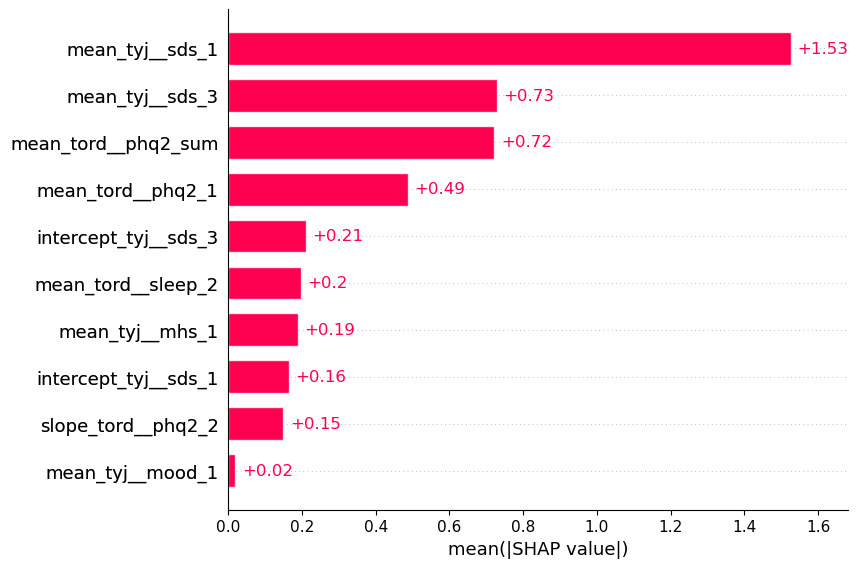

v2_day both HistGradientBoostingRegressor Mean R2: 0.178


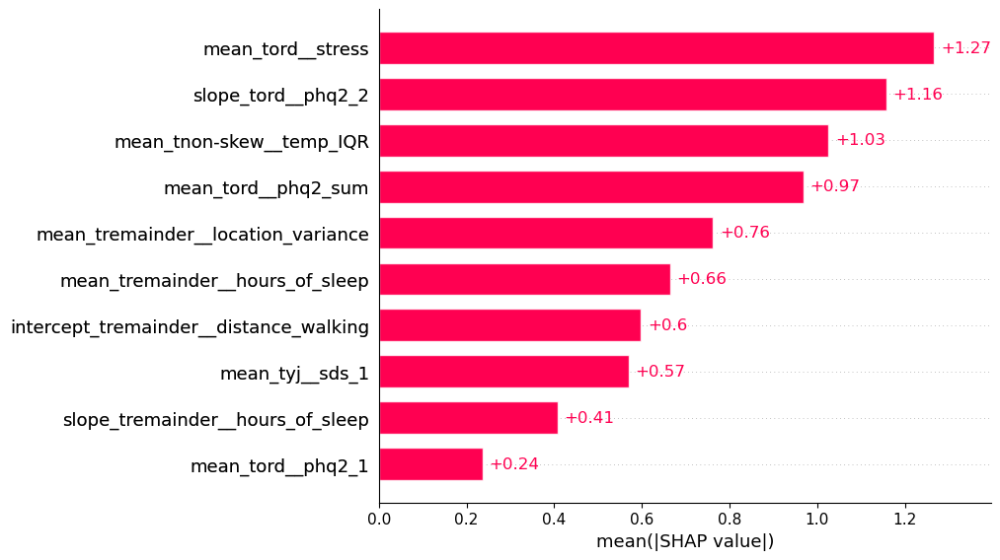

v1_week both HistGradientBoostingRegressor Mean R2: -0.082


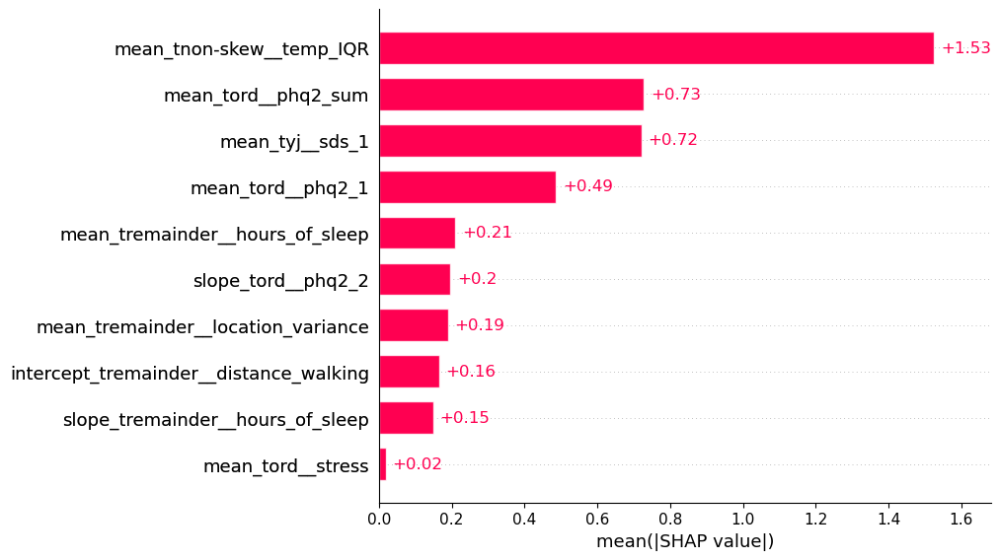

v2_week both HistGradientBoostingRegressor Mean R2: 0.192


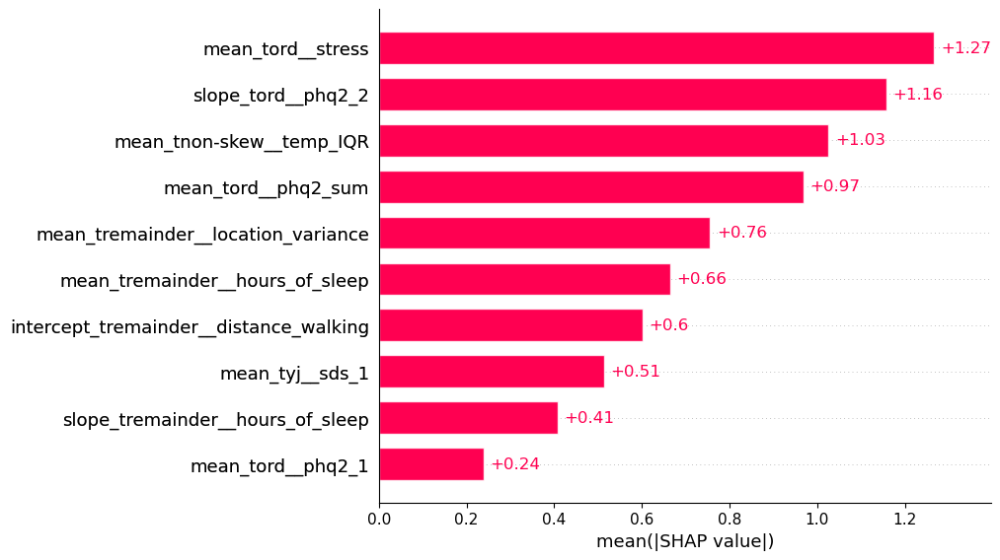

In [ ]:
# Feature importance 
# SHAP Printing 

for name in ['v1_day', 'v2_day', 'v1_week', 'v2_week']: #4
	for y_col in ['phq9_mean']: #2
		for type in ['both']: #3
			for model_name in models: #only one atm 
				mean_r2 = round(np.mean(model_dict_slopeint[name][y_col][type][model_name]['r2_scores']), 3)
				print(name, type, model_name, f'Mean R2: {mean_r2}')
				i=0 #change based on which CV you want to see
				explainer = shap.Explainer(model_dict_slopeint[name][y_col][type][model_name]['model'][i], approximate=True)
				shap_values = explainer(model_dict_slopeint[name][y_col][type][model_name]['X_test'][i], check_additivity=False)
				shap.plots.bar(shap_values)
				del explainer, shap_values
				gc.collect() 

Interestingly, adding the baseline features decreased the R2 score. 

Try PCA on long dataset

In [ ]:
for name in df_names:
	print(f'\n\nDATAFRAME: {name}')

	df = pd.read_csv(os.path.join(brighten_dir, f'{name}_Xy_imputed_8wks_long_trainval.csv'))
	y_col = 'change_sum'
	X_col = [col for col in df.columns if any(item in col for item in daily_v2_weather)]

	corr = df[X_col + [y_col]].corr()
	corr = corr[y_col].sort_values(ascending=False)
	print(f'Top 5 features correlated with {y_col}:')
	print(corr.head(8))

correlated_weather_cols = ['non-skew__humidity_mean', 'non-skew__humidity_median', 'non-skew__cloud_cover_mean', 'non-skew__cloud_cover_median']


In [ ]:
for name in df_names:
	print(f'\n\nDATAFRAME: {name}')

	df = pd.read_csv(os.path.join(brighten_dir, f'{name}_Xy_imputed_long_trainval.csv'))
	print(df.columns.to_list())
	print(len(df.columns.to_list()))




DATAFRAME: v1_day
['Unnamed: 0', 'day', 'num_id', 'remainder__phq2_1', 'remainder__phq2_2', 'remainder__phq2_sum', 'non-skew__aggregate_communication', 'non-skew__call_count', 'non-skew__call_duration', 'non-skew__interaction_diversity', 'non-skew__missed_interactions', 'non-skew__sms_count', 'non-skew__sms_length', 'bc__mobility', 'bc__mobility_radius', 'ord__gad7_1', 'ord__gad7_2', 'ord__gad7_3', 'ord__gad7_4', 'ord__gad7_5', 'ord__gad7_6', 'ord__gad7_7', 'ord__gad7_8', 'ord__gad7_sum', 'ord__gad_cat', 'ord__screen_1', 'yj__screen_2', 'yj__screen_3', 'yj__screen_4', 'cat__gender_0.0', 'cat__gender_1.0', 'cat__gender_nan', 'ord__education', 'ord__working', 'ord__income_satisfaction', 'ord__income_lastyear', 'ord__marital_status', 'cat__race_0.0', 'cat__race_1.0', 'cat__race_2.0', 'cat__race_3.0', 'cat__race_4.0', 'cat__race_5.0', 'cat__race_6.0', 'cat__race_nan', 'yj__age', 'ord__alc_1', 'yj__alc_2', 'yj__alc_3', 'ord__alc_sum', 'yj__sds_1', 'ord__sds_2', 'yj__sds_3', 'ord__stress',

In [ ]:

symptom_matrices_df_dict = {}
flattened_matrices_df_dict = {}
sensor_matrices_df_dict = {}
target_matrices_df_dict = {}
flattened_sensor_df_dict = {}
flattened_target_df_dict = {}	

correlated_weather_cols = ['non-skew__humidity_mean', 'non-skew__humidity_median', 'non-skew__cloud_cover_mean', 'non-skew__cloud_cover_median']

#### Take the average of each subject's symptom correlation and use it to make clusters of variables

# Create dicts of all subjects' correlation matrices
for name in df_names:
	print(f'\n\nDATAFRAME: {name}')

	df = pd.read_csv(os.path.join(brighten_dir, f'{name}_Xy_imputed_long_trainval.csv'))
	df = df.loc[:, ~df.columns.str.contains('^Unnamed')]
	
	# Take out y columns
	y_cols = ['change_cat','change_sum','change_binary','phq9_mean','phq9_cat_mean']
	df = df.drop(columns=[col for col in df.columns if any(item in col for item in y_cols)])

	# Take out baseline columns
	df = df.drop(columns=[col for col in df.columns if any(item in col for item in baseline_cols)])

	# Make symptom/flattened dicts for all cols
	ignore_cols = [col for col in df.columns if any(item in col for item in baseline_cols+id_columns) or "_indicator" in col or "_bin" in col or "index" in col]
	ignore_cols.append('season')
	# target_cols = [col for col in df.columns if "phq9" in col]

	weather_cols_present = [col for col in df.columns if any(item in col for item in daily_v2_weather)]
	weather_cols_drop = [col for col in weather_cols_present if col not in correlated_weather_cols]
	ignore_cols += weather_cols_drop

	keep_columns = list(set(df.columns.to_list()) - set(ignore_cols))
	print(keep_columns)
	print(f"All cols for {name}:")
	symptom_matrix_dict, flattened_matrix_dict = fs.make_symptom_matrices(df, ignore_cols, num_to_plot=0)
	

	# Assign dicts to nested dict
	symptom_matrices_df_dict[name] = symptom_matrix_dict
	flattened_matrices_df_dict[name] = flattened_matrix_dict


	# Make separate symptom/flattened dicts for target cols vs. sensor cols
	if 'week' in name:
		target_cols = phq9_cols
		print(f"Sensor cols for {name}:")
		sensor_cols = [col for col in df.columns if any(item in col for item in daily_cols_v1+daily_cols_v2)]
		print(sensor_cols)
		nonsensor_cols = [col for col in df.columns if col not in sensor_cols]
		sensor_matrices_dict, flattened_sensor_dict = fs.make_symptom_matrices(df, ignore_cols+nonsensor_cols, num_to_plot=0)
		target_df = df.copy().drop(columns=[col for col in df.columns if col not in target_cols and 'num_id' not in col])
		print(f"Target cols for {name}:")

		target_matrices_dict, flattened_target_dict = fs.make_symptom_matrices(target_df, ignore_cols, num_to_plot=0)

	if 'day' in name:
		print(f"Sensor cols for {name}:")
		target_cols = phq2_cols
		sensor_cols = [col for col in df.columns if any(item in col for item in daily_cols_v1+daily_cols_v2)]
		print(sensor_cols)
		nonsensor_cols = [col for col in df.columns if col not in sensor_cols]
		sensor_matrices_dict, flattened_sensor_dict = fs.make_symptom_matrices(df, ignore_cols+nonsensor_cols, num_to_plot=0)
		target_df = df.copy().drop(columns=[col for col in df.columns if col not in target_cols and 'num_id' not in col])
		print(f"Target cols for {name}:")
		target_matrices_dict, flattened_target_dict = fs.make_symptom_matrices(target_df, ignore_cols, num_to_plot=0)

	#Assign sensor/target dicts to nested dict
	sensor_matrices_df_dict[name] = sensor_matrices_dict
	target_matrices_df_dict[name] = target_matrices_dict
	flattened_sensor_df_dict[name] = flattened_sensor_dict
	flattened_target_df_dict[name] = flattened_target_dict






DATAFRAME: v1_day
['non-skew__call_count', 'remainder__phq2_1', 'bc__mobility', 'remainder__phq2_2', 'ord__mhs_3', 'ord__mhs_5', 'ord__mhs_1', 'ord__sleep_2', 'non-skew__call_duration', 'non-skew__sms_count', 'yj__mood_1', 'ord__mhs_2', 'non-skew__aggregate_communication', 'bc__mobility_radius', 'ord__sleep_3', 'ord__support', 'ord__stress', 'yj__sds_3', 'remainder__phq2_sum', 'ord__mhs_4', 'non-skew__sms_length', 'mood_1_final', 'yj__sds_1', 'non-skew__missed_interactions', 'ord__sds_2', 'ord__sleep_1']
All cols for v1_day:
In df there are 231 subjects.
231 subs with symptom matrices
231 filled condensed arrays
Sensor cols for v1_day:
['non-skew__aggregate_communication', 'non-skew__call_count', 'non-skew__call_duration', 'non-skew__interaction_diversity', 'non-skew__missed_interactions', 'non-skew__sms_count', 'non-skew__sms_length', 'bc__mobility', 'bc__mobility_radius']
In df there are 231 subjects.
231 subs with symptom matrices
231 filled condensed arrays
Target cols for v1_day

In [ ]:
matrix = symptom_matrices_df_dict['v2_day'][1178.0]
display(matrix)
display(flattened_matrices_df_dict['v2_day'][1178.0])

,ord__sds_2,yj__distance_high_speed_transportation_hr_nonzero,ord__sleep_1,remainder__phq2_sum,yj__mood_1,ord__mhs_4,ord__support,yj__distance_walking_hr,yj__hours_of_sleep_hr,mood_1_final,...,yj__distance_high_speed_transportation_hr,ord__mhs_2,remainder__phq2_1,ord__mhs_5,ord__mhs_1,ord__mhs_3,non-skew__humidity_mean,non-skew__humidity_median,ord__sleep_2,ord__sleep_3
ord__sds_2,1.000000,0.0,0.0,0.194988,-0.697741,0.0,0.465873,-0.127907,0.119932,0.0,...,-0.128247,0.0,0.619460,0.0,0.0,0.0,0.058099,0.056546,0.0,0.0
yj__distance_high_speed_transportation_hr_nonzero,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0
ord__sleep_1,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0
remainder__phq2_sum,0.194988,0.0,0.0,1.000000,0.092094,0.0,0.372649,0.012243,-0.145901,0.0,...,0.107984,0.0,0.868864,0.0,0.0,0.0,-0.050202,-0.069668,0.0,0.0
yj__mood_1,-0.697741,0.0,0.0,0.092094,1.000000,0.0,0.308805,0.061713,-0.105191,0.0,...,-0.055141,0.0,-0.230381,0.0,0.0,0.0,-0.219763,-0.232257,0.0,0.0
ord__mhs_4,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0
ord__support,0.465873,0.0,0.0,0.372649,0.308805,0.0,1.000000,-0.093598,0.029304,0.0,...,-0.238390,0.0,0.537909,0.0,0.0,0.0,-0.194316,-0.211811,0.0,0.0
yj__distance_walking_hr,-0.127907,0.0,0.0,0.012243,0.061713,0.0,-0.093598,1.000000,0.007086,0.0,...,0.203650,0.0,-0.115621,0.0,0.0,0.0,0.336479,0.356618,0.0,0.0
yj__hours_of_sleep_hr,0.119932,0.0,0.0,-0.145901,-0.105191,0.0,0.029304,0.007086,1.000000,0.0,...,0.130900,0.0,-0.111079,0.0,0.0,0.0,0.183540,0.167167,0.0,0.0
mood_1_final,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0


[0.0,
 0.0,
 0.19498826681319933,
 -0.6977407149243607,
 0.0,
 0.46587277121357973,
 -0.12790724682601307,
 0.1199316636824021,
 0.0,
 -0.2670588832739665,
 0.9938703702317653,
 0.979154801788663,
 0.986285553750134,
 -0.1282472940106441,
 -0.12824729401064408,
 0.0,
 0.619460200092208,
 0.0,
 0.0,
 0.0,
 0.05809878014554014,
 0.0565458121547059,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.09209366121762301,
 0.0,
 0.37264932319770094,
 0.012242717399592694,
 -0.1459012154773994,
 0.0,
 0.8763200695812072,
 0.158584289938516,
 0.25561236157405576,
 0.1397492806891545,
 0.10798355319767003,
 0.10798355319767,
 0.0,
 0.8688636131405456,
 0.0,
 0.0,
 0.0,
 -0.05020191752612114,
 -0.06966769132949525,
 0.0,
 0.0,
 0.0,
 0.30880548042783823,
 0.061712923

In [ ]:
print(symptom_matrices_df_dict['v1_day'][next(iter(symptom_matrices_df_dict['v1_day']))].columns.to_list())
#ind = [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 1. 0. 0. 0. 1. 1. 0. 0. 1. 0. 0. 0. 0. 0.]

['yj__sds_3', 'ord__sds_2', 'yj__sds_1', 'ord__stress', 'ord__sleep_1', 'non-skew__call_duration', 'non-skew__aggregate_communication', 'non-skew__missed_interactions', 'remainder__phq2_sum', 'yj__mood_1', 'ord__sleep_2', 'ord__mhs_2', 'ord__mhs_4', 'ord__support', 'remainder__phq2_1', 'bc__mobility_radius', 'ord__mhs_1', 'ord__mhs_5', 'non-skew__sms_length', 'bc__mobility', 'ord__mhs_3', 'mood_1_final', 'non-skew__call_count', 'non-skew__sms_count', 'remainder__phq2_2', 'ord__sleep_3']


T test https://www.youtube.com/watch?v=VekJxtk4BYM 

Needs normal distribution of the metric variables-- test for normal distribution of each corr value

also the variance between my two groups must be approximately equal -- levene's test

In [ ]:
#num_id	change_sum	week	change_binary	phq9_mean	phq9_bin
#v1_phq9_sum_change.csv

# SENSOR AND SURVEY 
# Network based statistics for high phq9 vs. low phq9 -- OVER WHOLE STUDY
import bct 
from bct import nbs
from scipy import stats

significance_level = 0.05

for v in ['v1','v2']:
	print(v)
	phq9_stats = pd.read_csv(os.path.join(brighten_dir, f'{v}_phq9_sum_change.csv'))

	depressed = phq9_stats[phq9_stats['phq9_bin']==1]['num_id']
	print(f'There are {len(depressed)} subs in the depressed group')
	depressed_present = [sub for sub in depressed if sub in symptom_matrices_df_dict[f'{v}_day']]
	print(f'There are {len(depressed_present)} subs present from the depressed group')
	X = {key: symptom_matrices_df_dict[f'{v}_day'][key] for key in depressed_present}
	x_arr = np.stack([df.values for df in X.values()], axis=-1)
	print(f'x_arr shape {x_arr.shape}')
		
	nondepressed = phq9_stats[phq9_stats['phq9_bin']==0]['num_id']
	print(f'There are {len(depressed)} subs in the nondepressed group')
	nondepressed_present = [sub for sub in nondepressed if sub in symptom_matrices_df_dict[f'{v}_day']]
	print(f'There are {len(nondepressed_present)} subs present from the nondepressed group')
	y = {key: symptom_matrices_df_dict[f'{v}_day'][key] for key in nondepressed_present}
	y_arr = np.stack([df.values for df in y.values()], axis=-1)
	print(f'y_arr shape {y_arr.shape}')

	degf = len(X) + len(y) - 2
	print(f'The degrees of freedom are: {degf}')

	t_thresh = stats.t.ppf(1-significance_level, degf)
	print(f'The critical t value is {round(t_thresh, 2)}')

	pval, adj, null = nbs.nbs_bct(x_arr, y_arr, thresh=t_thresh, verbose=False)
	print(pval)
	# Convert adj to boolean mask
	mask = adj.astype(bool)
	component_cols = y[next(iter(y))].loc[:, mask]
	print(component_cols.columns.to_list())


v1
There are 111 subs in the depressed group
There are 41 subs present from the depressed group
x_arr shape (26, 26, 41)
There are 111 subs in the nondepressed group
There are 102 subs present from the nondepressed group
y_arr shape (26, 26, 102)
The degrees of freedom are: 141
The critical t value is 1.66
max component size is 78
estimating null distribution with 1000 permutations
permutation 0 of 1000.  p-value so far is 0.000
permutation 100 of 1000.  p-value so far is 0.000
permutation 200 of 1000.  p-value so far is 0.000
permutation 300 of 1000.  p-value so far is 0.000
permutation 400 of 1000.  p-value so far is 0.000
permutation 500 of 1000.  p-value so far is 0.000
permutation 600 of 1000.  p-value so far is 0.000
permutation 700 of 1000.  p-value so far is 0.000
permutation 800 of 1000.  p-value so far is 0.000
permutation 900 of 1000.  p-value so far is 0.000
permutation 999 of 1000.  p-value so far is 0.000
[0.]
['ord__sleep_1', 'ord__sleep_1', 'ord__sleep_1', 'ord__sleep_1

In [ ]:
#num_id	change_sum	week	change_binary	phq9_mean	phq9_bin
#v1_phq9_sum_change.csv

# JUST SENSOR
# Network based statistics for high phq9 vs. low phq9 -- OVER WHOLE STUDY
import bct 
from bct import nbs
from scipy import stats

significance_level = 0.05

for v in ['v1','v2']:
	print(v)
	phq9_stats = pd.read_csv(os.path.join(brighten_dir, f'{v}_phq9_sum_change.csv'))
	depressed = phq9_stats[phq9_stats['phq9_bin']==1]['num_id']
	print(f'There are {len(depressed)} subs in the depressed group')
	depressed_present = [sub for sub in depressed if sub in sensor_matrices_df_dict[f'{v}_day']]
	print(f'There are {len(depressed_present)} subs present from the depressed group')
	X = {key: sensor_matrices_df_dict[f'{v}_day'][key] for key in depressed_present}
	x_arr = np.stack([df.values for df in X.values()], axis=-1)
	print(f'x_arr shape {x_arr.shape}')
		
	nondepressed = phq9_stats[phq9_stats['phq9_bin']==0]['num_id']
	print(f'There are {len(depressed)} subs in the nondepressed group')
	nondepressed_present = [sub for sub in nondepressed if sub in sensor_matrices_df_dict[f'{v}_day']]
	print(f'There are {len(nondepressed_present)} subs present from the nondepressed group')
	y = {key: sensor_matrices_df_dict[f'{v}_day'][key] for key in nondepressed_present}
	y_arr = np.stack([df.values for df in y.values()], axis=-1)
	print(f'y_arr shape {y_arr.shape}')

	degf = len(X) + len(y) - 2
	print(f'The degrees of freedom are: {degf}')

	t_thresh = stats.t.ppf(1-significance_level, degf)
	print(f'The critical t value is {round(t_thresh, 2)}')

	pval, adj, null = nbs.nbs_bct(x_arr, y_arr, thresh=t_thresh, verbose=False)
	print(pval)
	# Convert adj to boolean mask
	mask = adj.astype(bool)
	component_cols = y[next(iter(y))].loc[:, mask]
	print(component_cols.columns.to_list())


v1
There are 111 subs in the depressed group
There are 41 subs present from the depressed group
x_arr shape (8, 8, 41)
There are 111 subs in the nondepressed group
There are 102 subs present from the nondepressed group
y_arr shape (8, 8, 102)
The degrees of freedom are: 141
The critical t value is 1.66
max component size is 3
estimating null distribution with 1000 permutations
permutation 0 of 1000.  p-value so far is 1.000
permutation 100 of 1000.  p-value so far is 0.376
permutation 200 of 1000.  p-value so far is 0.378
permutation 300 of 1000.  p-value so far is 0.362
permutation 400 of 1000.  p-value so far is 0.357
permutation 500 of 1000.  p-value so far is 0.343
permutation 600 of 1000.  p-value so far is 0.354
permutation 700 of 1000.  p-value so far is 0.359
permutation 800 of 1000.  p-value so far is 0.360
permutation 900 of 1000.  p-value so far is 0.366
permutation 999 of 1000.  p-value so far is 0.363
[0.363]
['non-skew__missed_interactions', 'non-skew__missed_interactions

In [ ]:
#num_id	change_sum	week	change_binary	phq9_mean	phq9_bin
#v1_phq9_sum_change.csv

# Network based statistics for high phq9 vs. low phq9 --- ENDING/LAST PHQ9
import bct 
from bct import nbs
from scipy import stats

significance_level = 0.05

for v in ['v1','v2']:
	print(v)
	
	phq9_end_df = pd.read_csv(os.path.join(brighten_dir, f'{name}_phq9sum_last'))
	phq9_end_df = phq9_end_df.loc[:, ~phq9_end_df.columns.str.contains('Unnamed')]

	depressed = phq9_end_df[phq9_end_df['depressed_binary']==1]['num_id']
	print(f'There are {len(depressed)} subs in the depressed group')
	depressed_present = [sub for sub in depressed if sub in symptom_matrices_df_dict[f'{v}_day']]
	print(f'There are {len(depressed_present)} subs present from the depressed group')
	X = {key: symptom_matrices_df_dict[f'{v}_day'][key] for key in depressed_present}
	x_arr = np.stack([df.values for df in X.values()], axis=-1)
	print(f'x_arr shape {x_arr.shape}')
		
	nondepressed = phq9_end_df[phq9_end_df['depressed_binary']==0]['num_id']
	print(f'There are {len(depressed)} subs in the nondepressed group')
	nondepressed_present = [sub for sub in nondepressed if sub in symptom_matrices_df_dict[f'{v}_day']]
	print(f'There are {len(nondepressed_present)} subs present from the nondepressed group')
	y = {key: symptom_matrices_df_dict[f'{v}_day'][key] for key in nondepressed_present}
	y_arr = np.stack([df.values for df in y.values()], axis=-1)
	print(f'y_arr shape {y_arr.shape}')

	degf = len(X) + len(y) - 2
	print(f'The degrees of freedom are: {degf}')

	t_thresh = stats.t.ppf(1-significance_level, degf)
	print(f'The critical t value is {round(t_thresh, 2)}')

	pval, adj, null = nbs.nbs_bct(x_arr, y_arr, thresh=t_thresh, verbose=False)
	print(pval)
	# Convert adj to boolean mask
	mask = adj.astype(bool)
	component_cols = y[next(iter(y))].loc[:, mask]
	print(component_cols.columns.to_list())


In [ ]:
#num_id	change_sum	week	change_binary	phq9_mean	phq9_bin
#v1_phq9_sum_change.csv

# Network based statistics for positive change vs. negative change
import bct 
from bct import nbs
from scipy import stats
from scipy.stats import ttest_ind


significance_level = 0.05

for v in ['v1','v2']:
	print(v)
	phq9_stats = pd.read_csv(os.path.join(brighten_dir, f'{v}_phq9_sum_change.csv'))
	pos = phq9_stats[phq9_stats['change_binary'].isin([0,1])]['num_id']
	print(f'There are {len(pos)} subs in the pos group')
	pos_present = [sub for sub in pos if sub in sensor_matrices_df_dict[f'{v}_day']]
	print(f'There are {len(pos_present)} subs present from the pos group')
	X = {key: sensor_matrices_df_dict[f'{v}_day'][key] for key in pos_present}
	x_arr = np.stack([df.values for df in X.values()], axis=-1)
	print(f'x_arr shape {x_arr.shape}')
		
	neg = phq9_stats[phq9_stats['change_binary'].isin([-1])]['num_id']
	print(f'There are {len(neg)} subs in the neg group')
	neg_present = [sub for sub in neg if sub in sensor_matrices_df_dict[f'{v}_day']]
	print(f'There are {len(nondepressed_present)} subs present from the neg group')
	y = {key: sensor_matrices_df_dict[f'{v}_day'][key] for key in neg_present}
	y_arr = np.stack([df.values for df in y.values()], axis=-1)
	print(f'y_arr shape {y_arr.shape}')

	degf = len(X) + len(y) - 2
	print(f'The degrees of freedom are: {degf}')

	t_thresh = stats.t.ppf(1-significance_level, degf)
	print(f'The critical t value is {round(t_thresh, 2)}')
	# Flatten along subjects
	tvals, pvals = ttest_ind(x_arr.transpose(2,0,1).reshape(len(X), -1),
							y_arr.transpose(2,0,1).reshape(len(y), -1),
							axis=0, equal_var=False)
	print("Max |t|:", np.nanmax(np.abs(tvals)))


	pval, adj, null = nbs.nbs_bct(x_arr, y_arr, thresh=t_thresh, verbose=False)

	print(pval)
	# Convert adj to boolean mask
	mask = adj.astype(bool)
	component_cols = y[next(iter(y))].loc[:, mask]
	print(component_cols.columns.to_list())


v1
There are 270 subs in the pos group
There are 95 subs present from the pos group
x_arr shape (8, 8, 95)
There are 124 subs in the neg group
There are 42 subs present from the neg group
y_arr shape (8, 8, 48)
The degrees of freedom are: 141
The critical t value is 1.66
Max |t|: 2.285218200133685


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_axis_nan_policy.py:618: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, axis=axis, **kwds)


BCTParamError: Unsuitable threshold

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


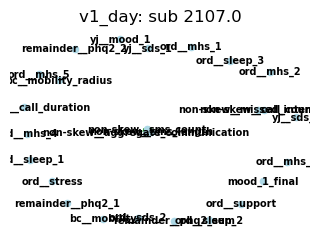

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


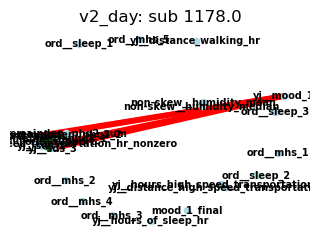

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


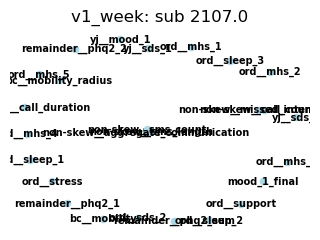

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


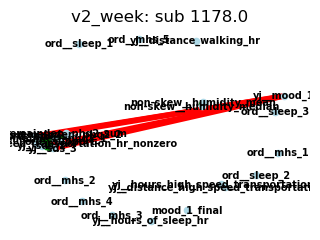

In [ ]:
# Plot a few symptom matrices
for name, df_dict in symptom_matrices_df_dict.items():
	count=0
	for sub, corr_matrix in df_dict.items():
		if count<1:
			fs.plot_network(corr_matrix, title=f'{name}: sub {sub}')
			count=+1

v1_day
(26, 26) variables included


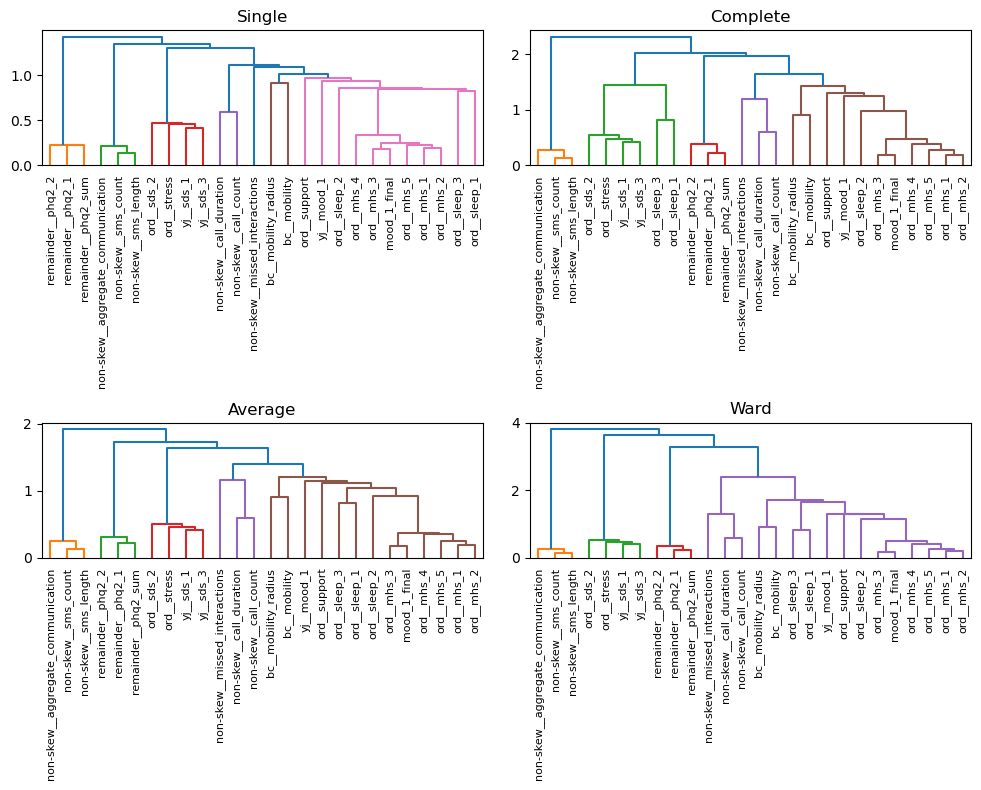

v2_day
(25, 25) variables included


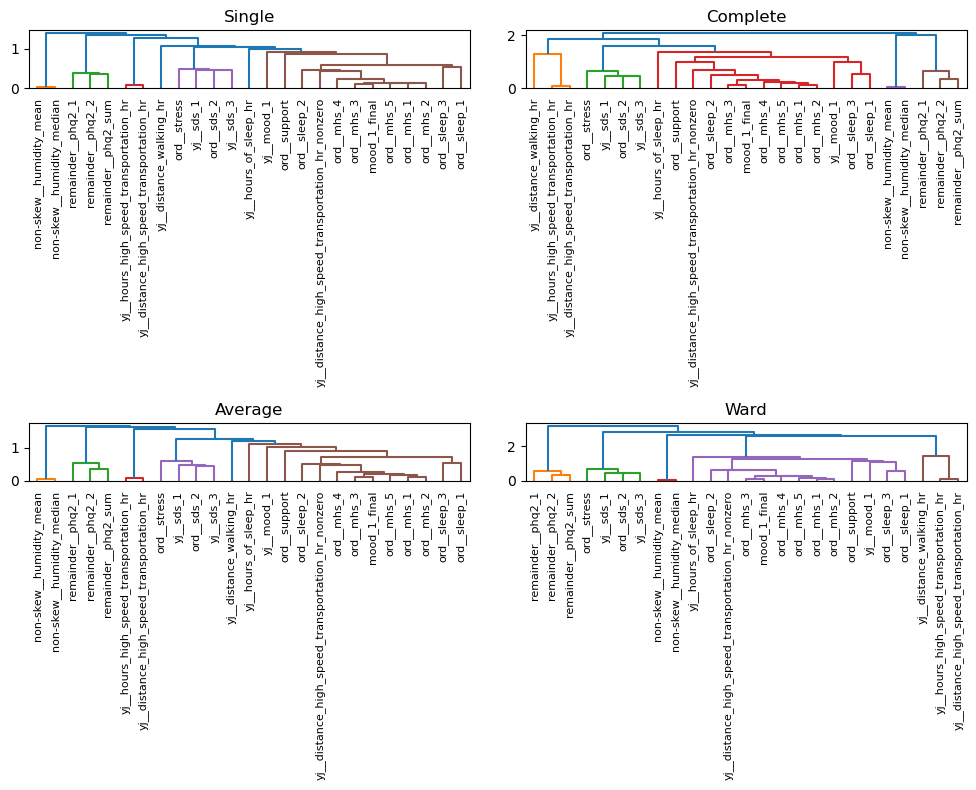

v1_week
(26, 26) variables included


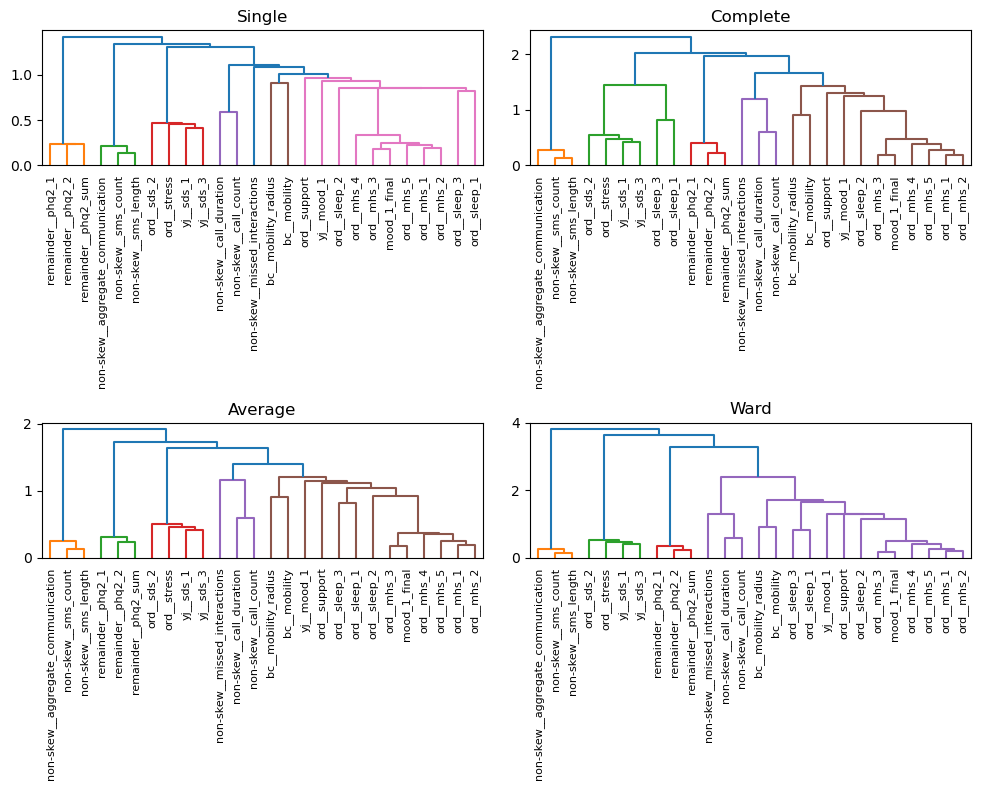

v2_week
(25, 25) variables included


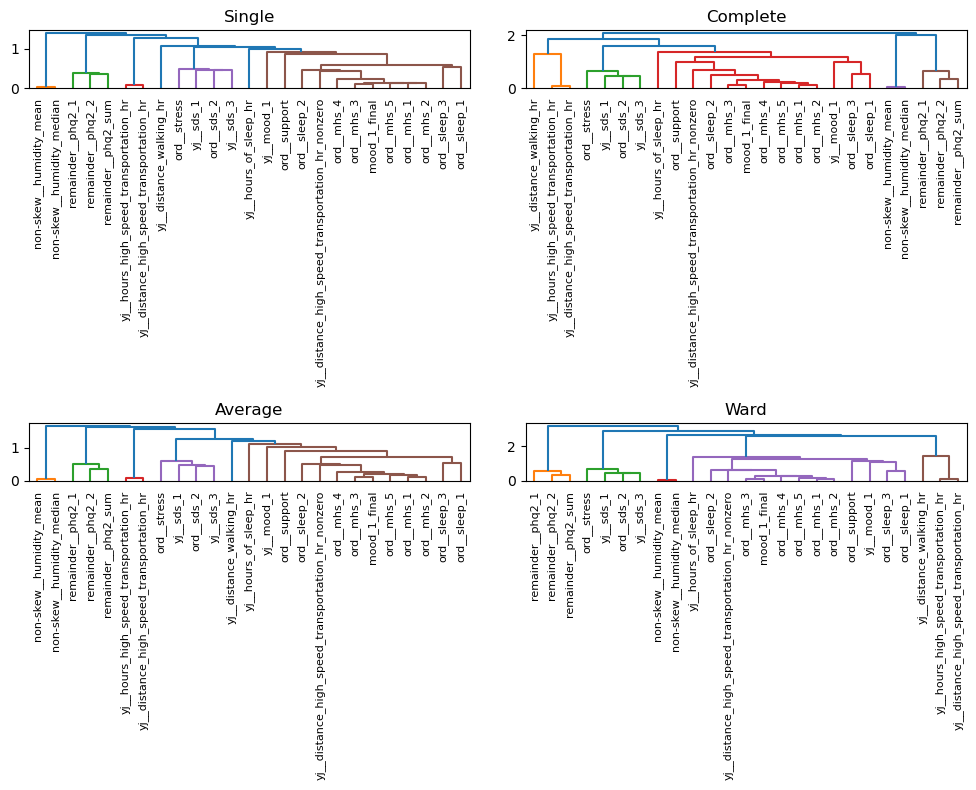

In [ ]:
## Plot options
for name, df in symptom_matrices_df_dict.items():
	avg_matrix = fs.average_matrix(df)
	fs.plot_hier_agg(avg_matrix, df[list(df.keys())[0]].index, is_dict=False, group_title=f'{name}') # 3, ward


In [ ]:
################# Create cluster_dict of Variables + Cluster Labels ############
# Fill in n clusters + linkage type

clust_dict = {}
# clust_dict['v1_day'] = v1_day_clust_dict
for name, dictionary in symptom_matrices_df_dict.items():
	avg_matrix = fs.average_matrix(dictionary)
	if 'v1_day' in name:
		clust_dict[name] = fs.hier_agg_clustering(avg_matrix, dictionary[list(dictionary.keys())[0]].index, n_clusters=11, linkage='single', is_dict=False)
	elif 'v2_day' in name:
		clust_dict[name] = fs.hier_agg_clustering(avg_matrix, dictionary[list(dictionary.keys())[0]].index, n_clusters=11, linkage='ward', is_dict=False)
	elif 'v1_week' in name:
		clust_dict[name] = fs.hier_agg_clustering(avg_matrix, dictionary[list(dictionary.keys())[0]].index, n_clusters=11, linkage='single', is_dict=False)
	elif 'v2_week' in name:
	   clust_dict[name] = fs.hier_agg_clustering(avg_matrix, dictionary[list(dictionary.keys())[0]].index, n_clusters=11, linkage='ward', is_dict=False)

In [ ]:
################# Create df_pca of Variables + 1st PC of clusters Labels ############
importlib.reload(fs)
dfs_pca = {}
dfs_pca_dict = {}
for name in df_names:
	df = pd.read_csv(os.path.join(brighten_dir, f'{name}_Xy_imputed_long_trainval.csv'))	
	
	print(f'\nFor {name}')
	dfs_pca[name], dfs_pca_dict[name] = fs.pca_on_clusters(df, clust_dict[name], n_clusters=9, wide=False) #n_clusters = number shown, so choose max



For v1_day
Cols for cluster 0: ['ord__sleep_1', 'ord__sleep_3', 'mood_1_final', 'ord__mhs_1', 'ord__mhs_2', 'ord__mhs_3', 'ord__mhs_4', 'ord__mhs_5']
Cols for cluster 1: ['non-skew__call_count', 'non-skew__call_duration']
Cols for cluster 2: ['non-skew__aggregate_communication', 'non-skew__sms_count', 'non-skew__sms_length']
Cols for cluster 3: ['remainder__phq2_1', 'remainder__phq2_2', 'remainder__phq2_sum']
Cols for cluster 4: ['yj__sds_1', 'ord__sds_2', 'yj__sds_3', 'ord__stress']
Cols for cluster 5: ['non-skew__missed_interactions']
Cols for cluster 6: ['yj__mood_1']
Cols for cluster 7: ['ord__support']
Cols for cluster 8: ['bc__mobility_radius']

For v2_day
Cols for cluster 0: ['yj__distance_high_speed_transportation_hr_nonzero', 'ord__sleep_2', 'mood_1_final', 'ord__mhs_1', 'ord__mhs_2', 'ord__mhs_3', 'ord__mhs_4', 'ord__mhs_5']
Cols for cluster 1: ['remainder__phq2_1', 'remainder__phq2_2', 'remainder__phq2_sum']
Cols for cluster 2: ['ord__sleep_1', 'ord__sleep_3']
Cols for clus

## Questions:

### SDS
- sds_1 	The symptoms have disrupted your work/school
- sds_2 	The symptoms have disrupted your social life / leisure activities
- sds_3 	The symptoms have disrupted your family life / home responsibilities
- stress 	In the last week, how much were you set back by stressful events or personal problems such as work, home, social, health, or financial problems?
- support In the past week, how much support have you received from friends, relatives, co-workers, etc., as a percentage of the amount you needed to cope?
	* *0 = not at all, 3 = Mildly, 6 = Moderately, 9 = Severely*

### Sleep
- sleep_1 	Thinking about your time in bed at night, over the past week, on average how long did it take you to fall asleep?
- sleep_3 	Thinking about your time in bed at night, over the past week, on average how long did you lie awake after having been asleep?
	* *1 = 0 - 15 minutes, 2 = 16 - 30 minutes, 3 = 31 - 60 minutes, 4 = 61 - 90 minutes, 5 = 91 - 120 minutes, 6 = More than 120 minutes*
- sleep_2 	Thinking about your time in bed at night, over the past week, on average how long were you actually asleep?
	* *1 = 5-6 hours, 2 = 6-7 hours, 3 = 7-8 hours, 4 = Less than 5 hours, 5 = More than 8 hours*

### Mental Health Services
- mhs_1 	An answer to, 'Do you see a psychiatrist for mental health or substance abuse treatment?'
- mhs_2 	An answer to, 'Do you see a psychologist, social worker, or other counselors for mental health or substance abuse treatment? '
- mhs_3 	An answer to, 'Do you attend any groups for mental health or substance abuse treatment?'
- mhs_4 	An answer to, ' Are you reading any self-help books for mental health or substance abuse treatment?'
- mhs_5 	An answer to, 'Are you taking any medications for mental health problems? 
	* *-1 = Decline, 0 = No, 1 = Yes* 

### Mood
- mood_1    'Since beginning this study, how would you describe the change (if any) in ACTIVITY LIMITATIONS, SYMPTOMS, EMOTIONS, and OVERALL QUALITY OF LIFE, related to your mood? '
	* *1 = No change, 2 = Almost the same, 3 = A little better, 4 = Somewhat better, 5 = Much better, 6 = Very much better*

In [ ]:
# # Name the clusters
dfs_pca_dict['v1_day'][0]['name'] = 'pc_sleep_mood_mhs'          # sleep_1, sleep_3, mhs_1-5
dfs_pca_dict['v1_day'][1]['name'] = 'pc_calls'                        # call_count, call_duration
dfs_pca_dict['v1_day'][2]['name'] = 'pc_lieAwake'                  # sds_1-3, stress
dfs_pca_dict['v1_day'][3]['name'] = 'pc_texts'         # sms_count, sms_length, aggregate_communication
dfs_pca_dict['v1_day'][4]['name'] = 'pc_phq2'                         # mood_1
dfs_pca_dict['v1_day'][5]['name'] = 'pc_sds_stress'                      # support
dfs_pca_dict['v1_day'][6]['name'] = 'pc_missed-interafctions'         # mobility_radius
dfs_pca_dict['v1_day'][7]['name'] = 'pc_mobility-radius'                    # mobility
dfs_pca_dict['v1_day'][8]['name'] = 'pc_mobility'              # sleep_2

dfs_pca_dict['v2_day'][0]['name'] = 'pc_sleep_mood_mhs'           # support, sleep_1-3, mhs_1-5
dfs_pca_dict['v2_day'][1]['name'] = 'pc_phq2'                  # sds_1-3, stress
dfs_pca_dict['v2_day'][2]['name'] = 'pc_lieAwake'       # humidity/temp IQR + std
dfs_pca_dict['v2_day'][3]['name'] = 'pc_sds'            # humidity mean + median
dfs_pca_dict['v2_day'][4]['name'] = 'pc_high-speed-trans'                # temp mean + median
dfs_pca_dict['v2_day'][5]['name'] = 'pc_distance-walk'                # dew point IQR + std
dfs_pca_dict['v2_day'][6]['name'] = 'pc_sleep-sensor'                # dew point mean + median
dfs_pca_dict['v2_day'][7]['name'] = 'pc_support'                      # precip_sum
dfs_pca_dict['v2_day'][8]['name'] = 'pc_mood-1'                         # mood_1

dfs_pca_dict['v1_week'][0]['name'] = 'pc_sleep_mood_mhs'          # sleep_1, sleep_3, mhs_1-5
dfs_pca_dict['v1_week'][1]['name'] = 'pc_calls'                        # call_count, call_duration
dfs_pca_dict['v1_week'][2]['name'] = 'pc_lieAwake'                  # sds_1-3, stress
dfs_pca_dict['v1_week'][3]['name'] = 'pc_texts'         # sms_count, sms_length, aggregate_communication
dfs_pca_dict['v1_week'][4]['name'] = 'pc_phq2'                         # mood_1
dfs_pca_dict['v1_week'][5]['name'] = 'pc_sds_stress'                      # support
dfs_pca_dict['v1_week'][6]['name'] = 'pc_missed-interafctions'         # mobility_radius
dfs_pca_dict['v1_week'][7]['name'] = 'pc_mobility-radius'                    # mobility
dfs_pca_dict['v1_week'][8]['name'] = 'pc_mobility'              # sleep_2

dfs_pca_dict['v2_week'][0]['name'] = 'pc_sleep_mood_mhs'           # support, sleep_1-3, mhs_1-5
dfs_pca_dict['v2_week'][1]['name'] = 'pc_phq2'                  # sds_1-3, stress
dfs_pca_dict['v2_week'][2]['name'] = 'pc_lieAwake'       # humidity/temp IQR + std
dfs_pca_dict['v2_week'][3]['name'] = 'pc_sds'            # humidity mean + median
dfs_pca_dict['v2_week'][4]['name'] = 'pc_high-speed-trans'                # temp mean + median
dfs_pca_dict['v2_week'][5]['name'] = 'pc_distance-walk'                # dew point IQR + std
dfs_pca_dict['v2_week'][6]['name'] = 'pc_sleep-sensor'                # dew point mean + median
dfs_pca_dict['v2_week'][7]['name'] = 'pc_support'                      # precip_sum
dfs_pca_dict['v2_week'][8]['name'] = 'pc_mood-1'                         # mood_1


importlib.reload(fs)
dfs_pca = {}
for name in df_names:
	df_scaled = pd.read_csv(os.path.join(brighten_dir, f'{name}_Xy_imputed_8wks_long_trainval.csv'))
	dfs_pca[name] = fs.merge_df_via_cluster_pca_dict(df_scaled, dfs_pca_dict[name], on_columns=['num_id','day'])
	dfs_pca[name].to_csv(os.path.join(brighten_dir, f'{name}_X_8wks_pca.csv'), index=False)
	print(f'Saved {name} PCA df to {name}_X_8wks_pca.csv')




Saved v1_day PCA df to v1_day_X_8wks_pca.csv
Saved v2_day PCA df to v2_day_X_8wks_pca.csv
Saved v1_week PCA df to v1_week_X_8wks_pca.csv
Saved v2_week PCA df to v2_week_X_8wks_pca.csv


In [ ]:
df_names

['v1_day', 'v2_day', 'v1_week', 'v2_week']

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


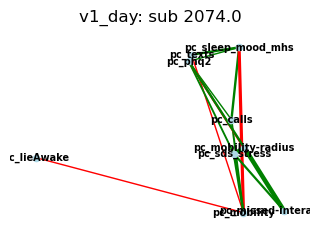

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


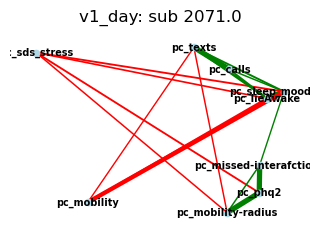

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


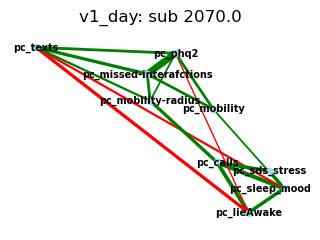

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


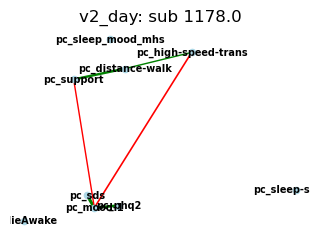

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


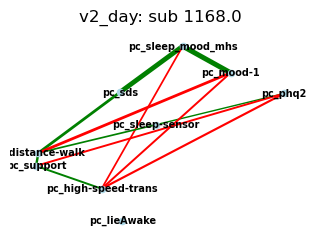

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


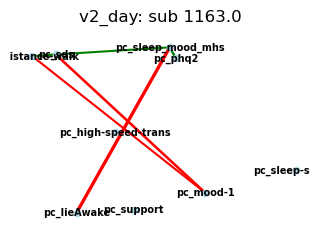

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


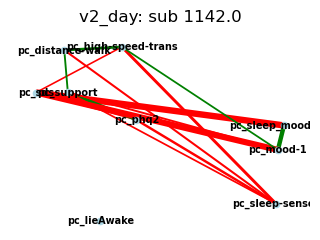

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


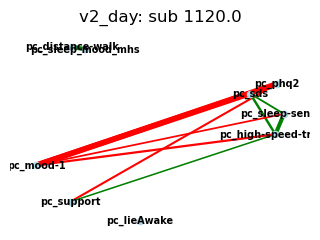

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


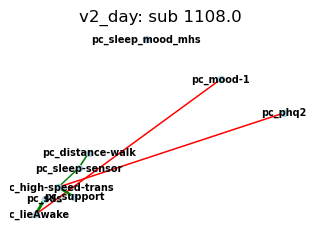

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


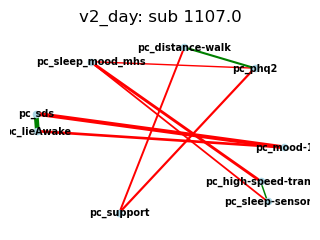

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


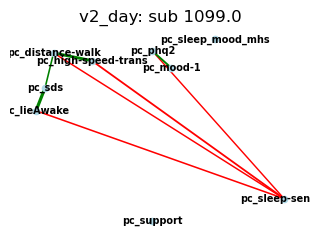

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


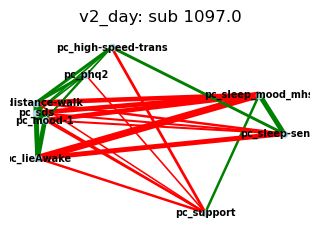

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


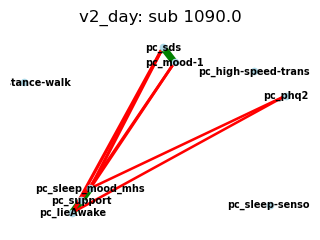

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


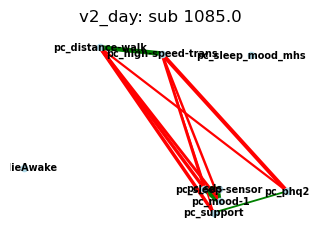

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


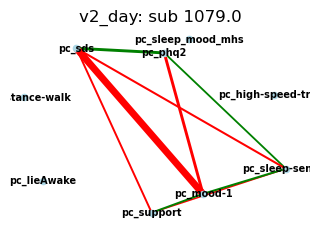

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


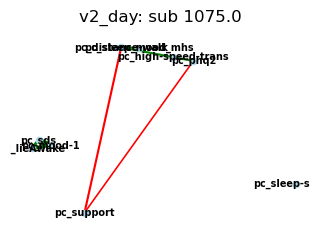

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


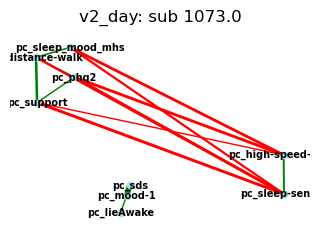

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


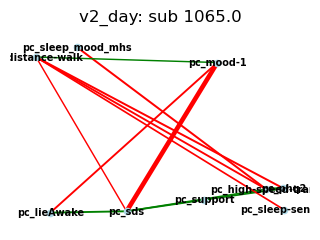

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


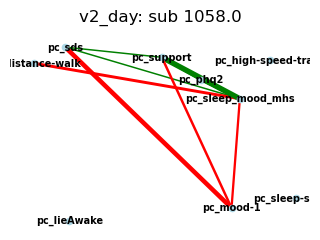

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


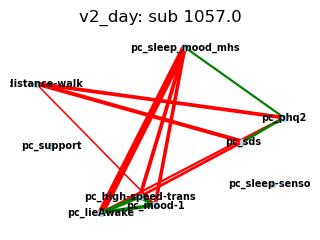

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


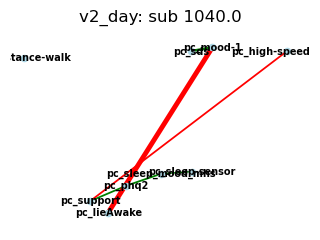

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


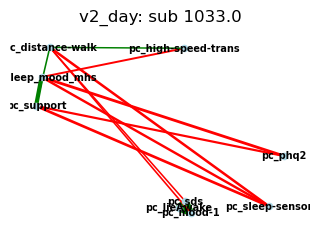

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


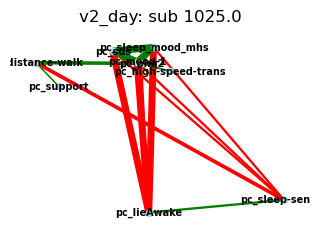

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


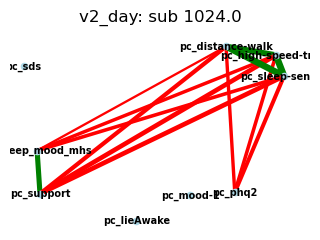

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


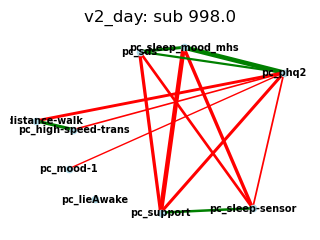

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


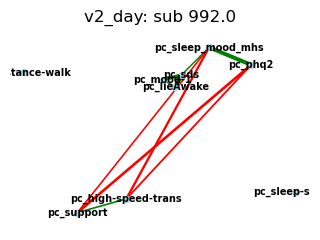

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


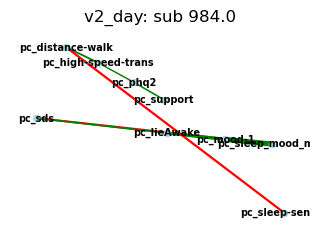

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


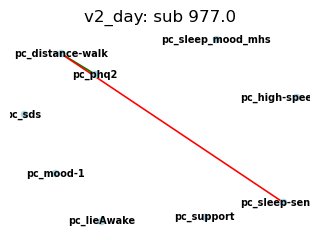

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


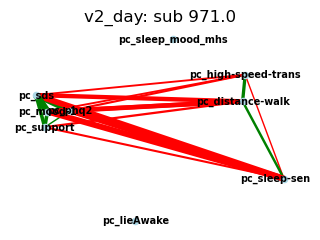

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


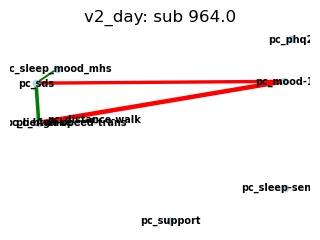

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


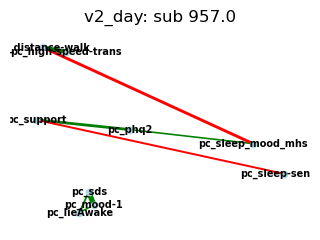

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


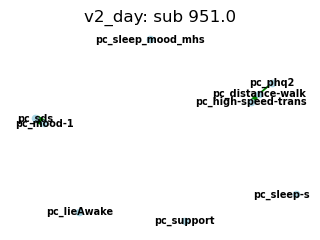

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


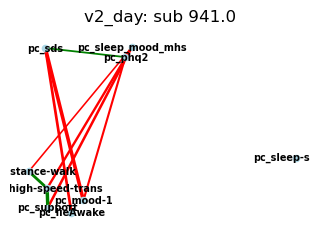

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


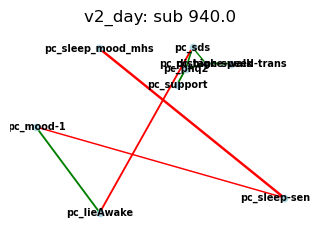

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


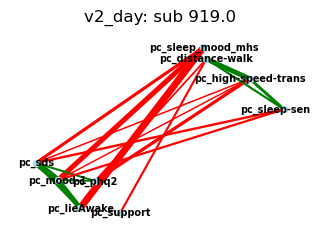

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


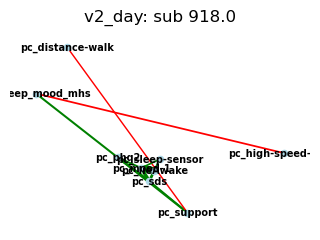

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


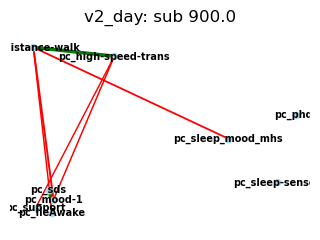

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


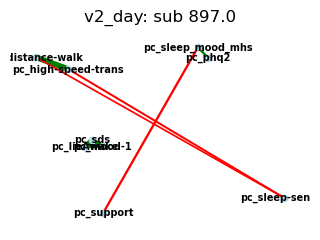

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


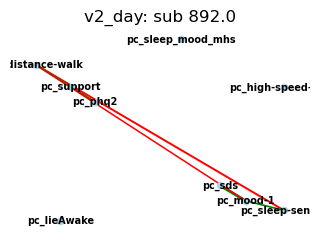

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


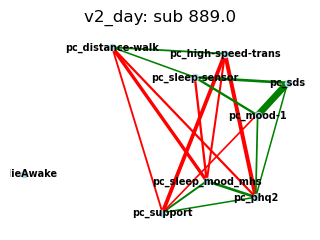

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


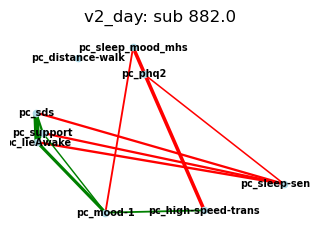

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


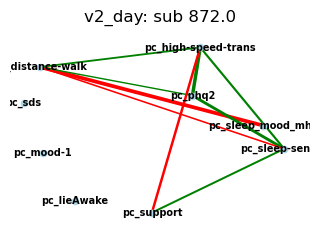

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


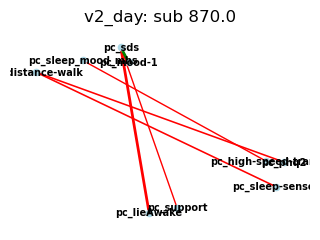

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


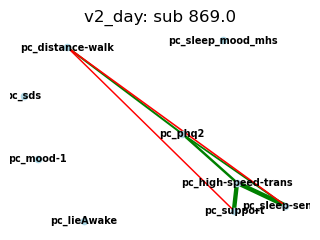

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


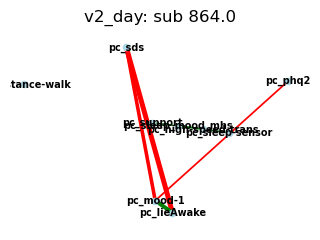

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


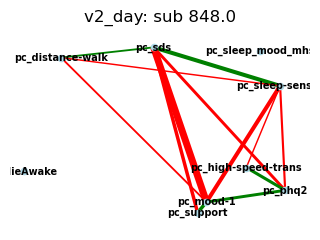

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


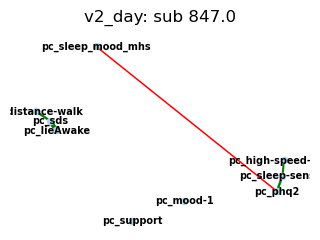

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


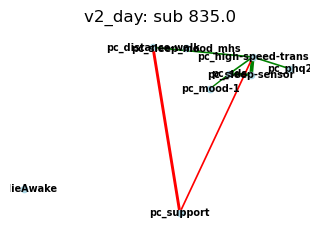

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


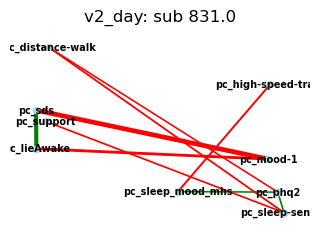

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


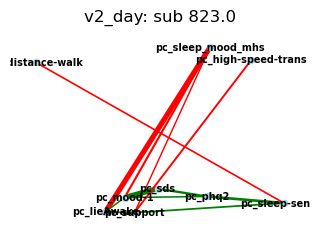

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


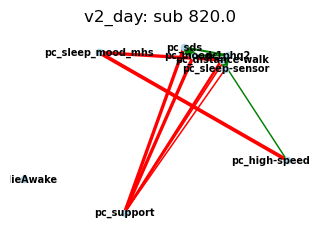

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


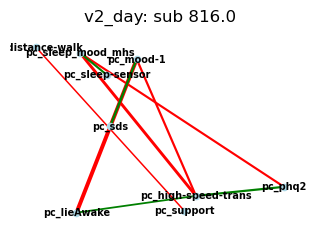

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


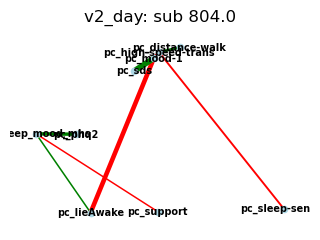

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


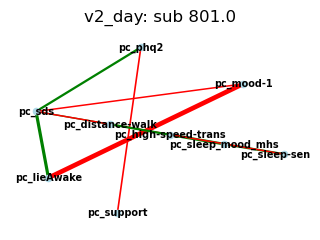

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


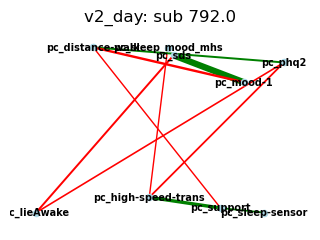

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


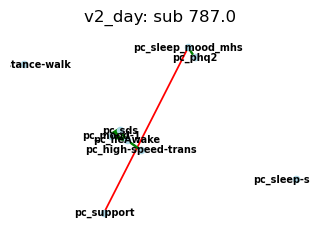

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


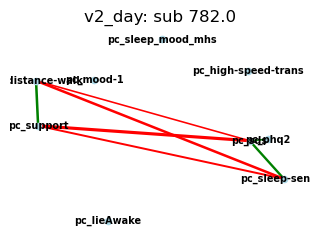

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


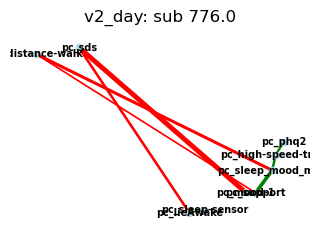

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


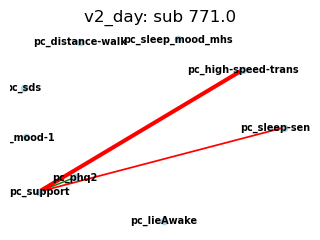

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


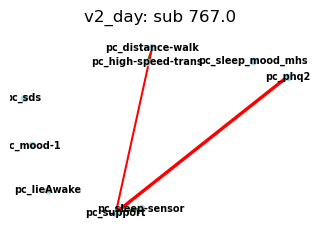

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


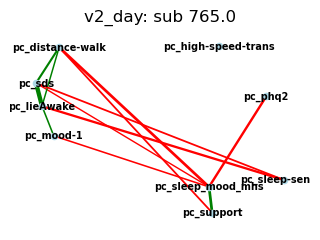

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


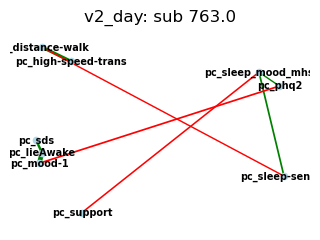

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


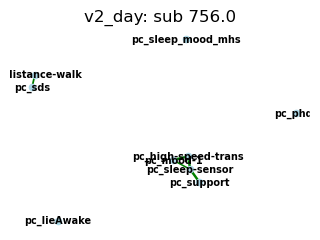

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


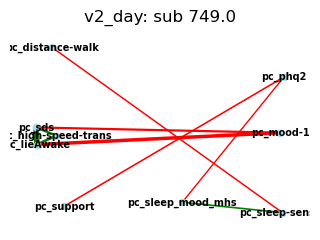

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


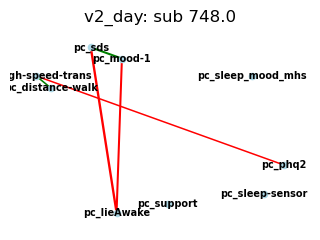

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


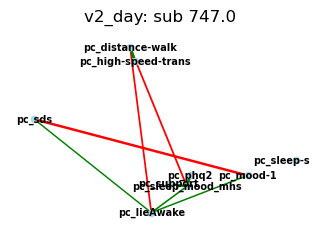

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


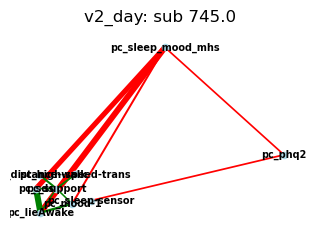

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


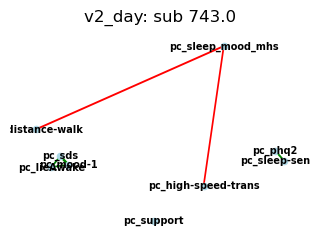

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


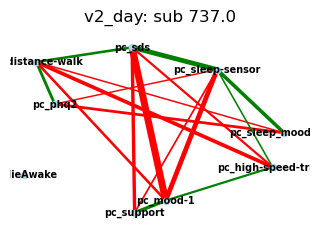

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


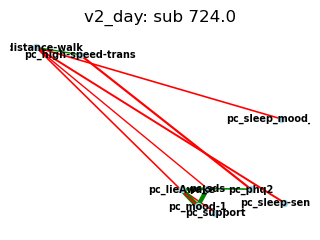

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


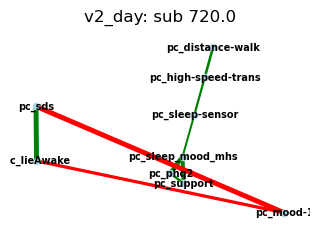

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


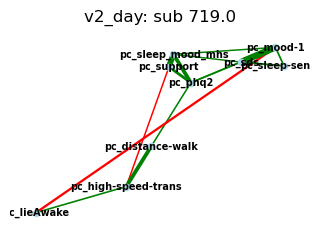

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


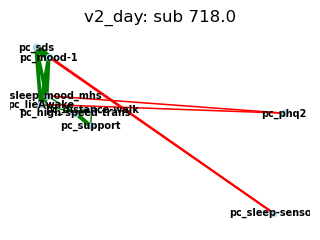

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


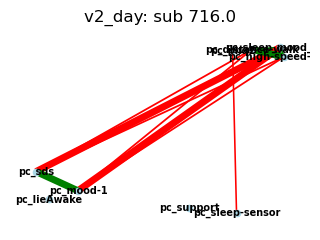

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


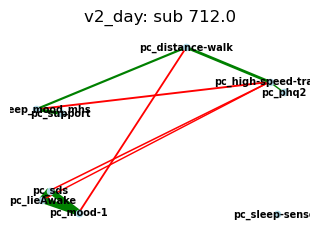

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


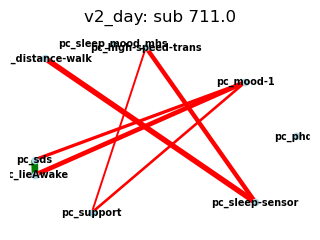

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


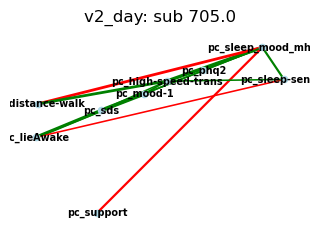

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


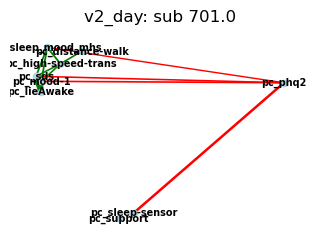

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


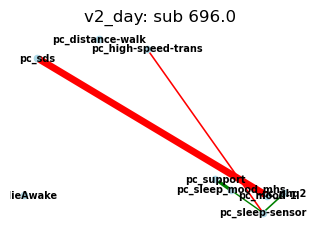

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


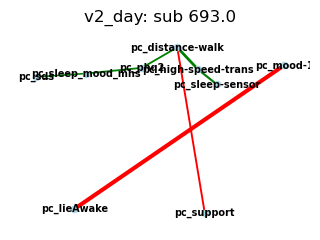

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


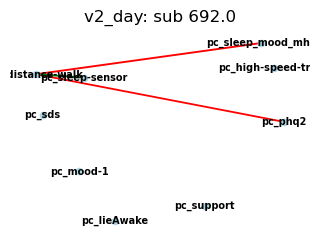

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


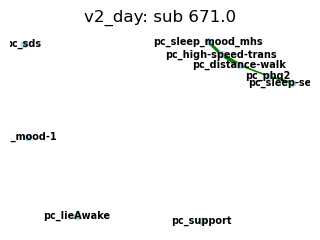

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


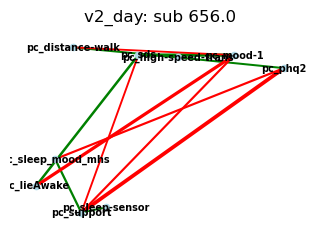

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


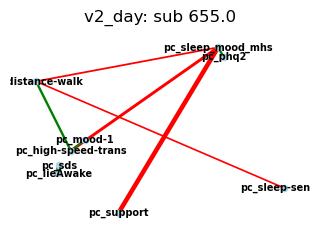

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


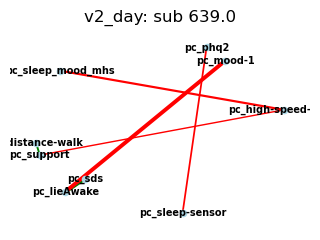

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


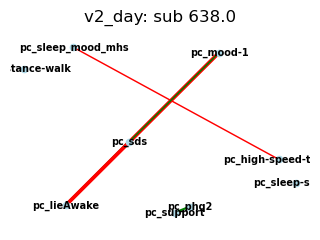

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


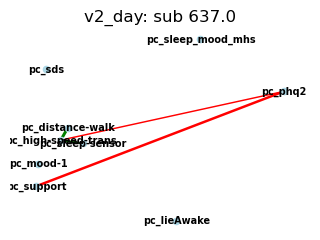

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


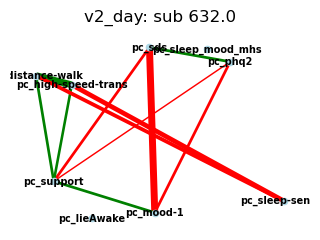

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


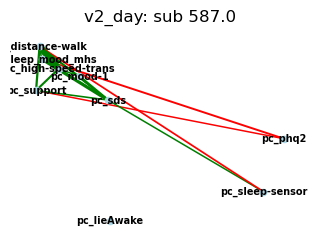

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


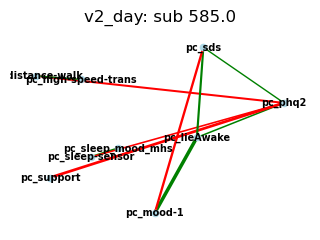

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


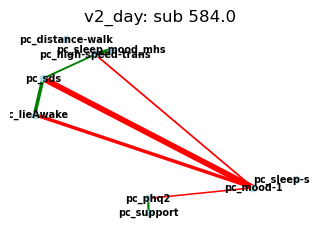

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


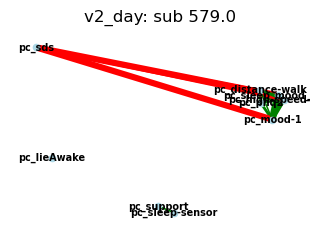

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


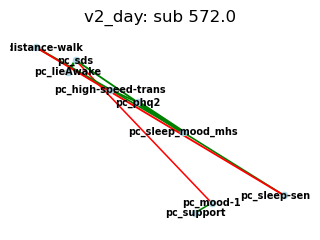

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


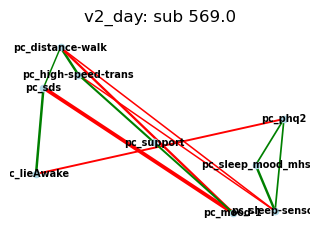

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


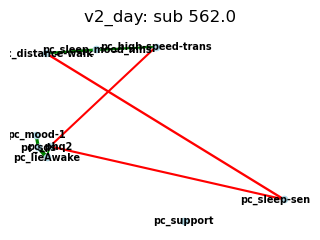

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


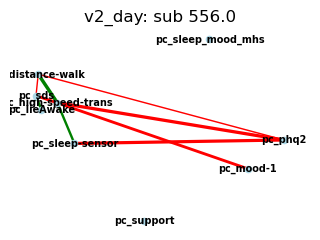

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


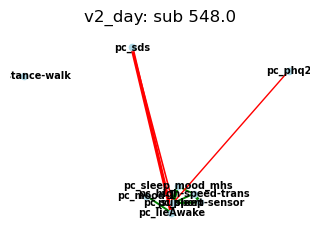

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


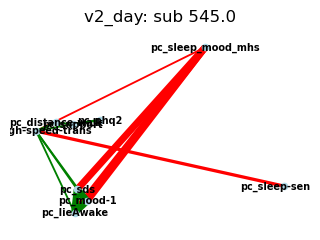

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


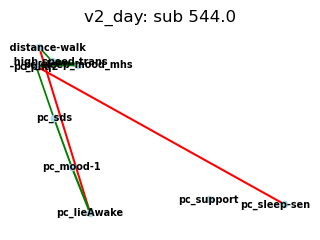

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


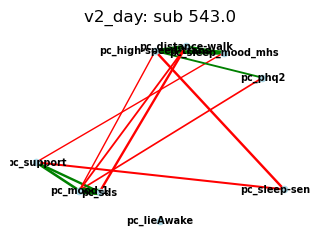

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


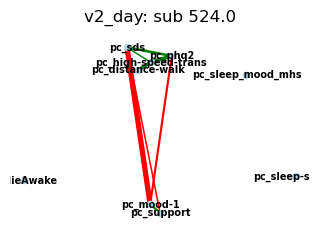

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


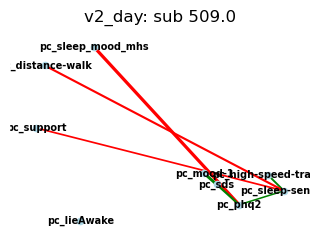

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


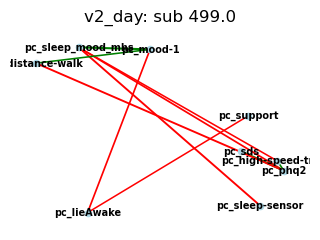

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


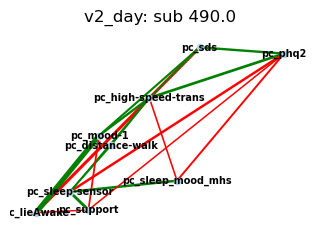

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


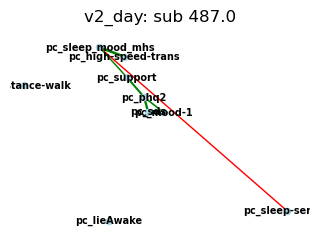

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


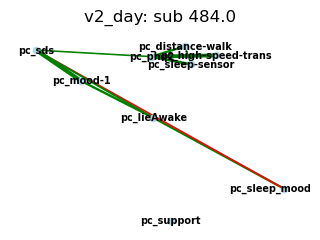

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


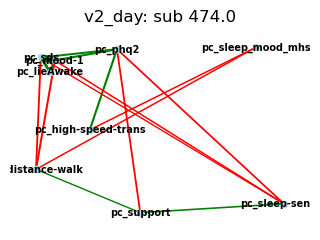

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


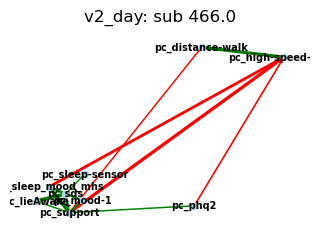

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


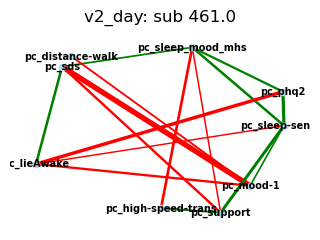

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


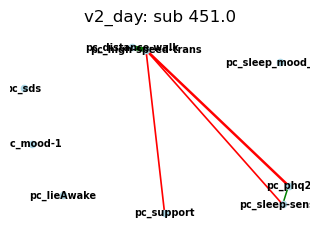

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


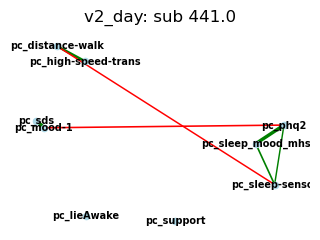

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


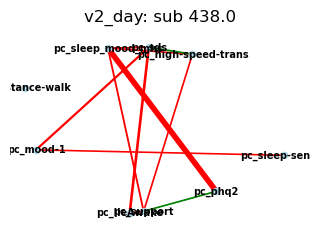

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


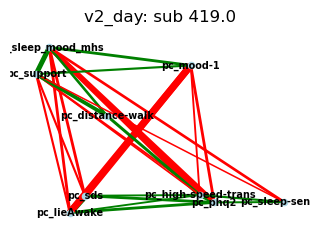

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


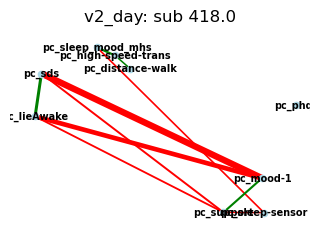

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


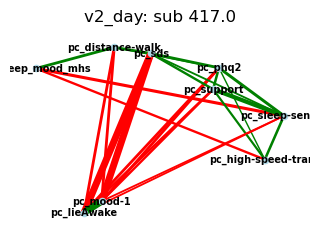

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


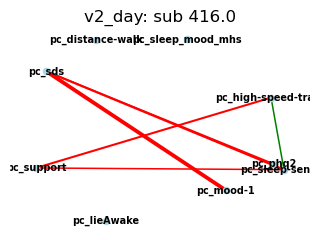

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


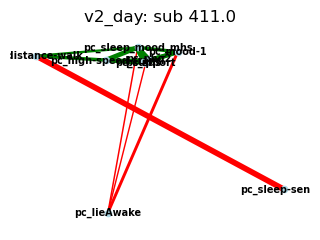

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


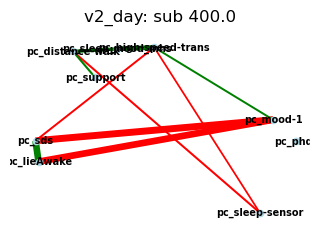

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


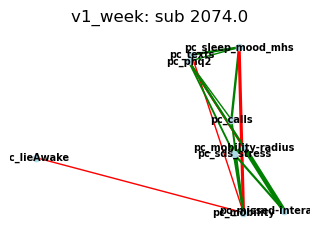

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


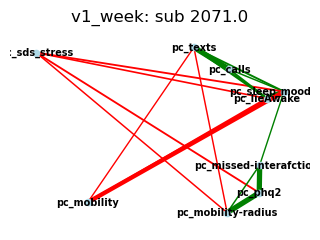

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


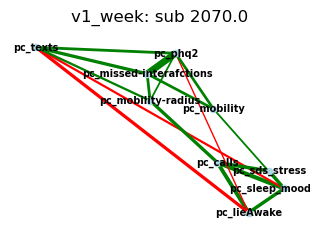

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


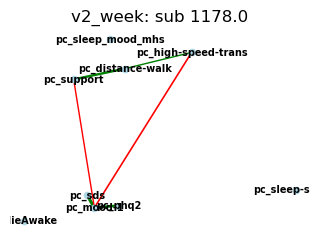

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


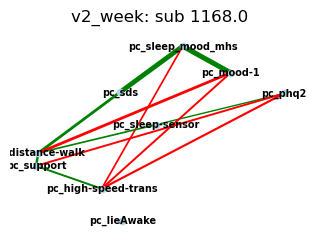

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


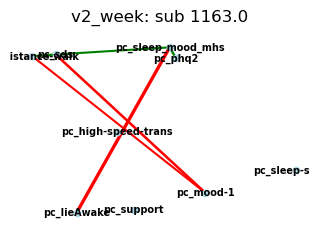

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


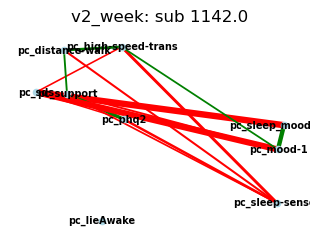

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


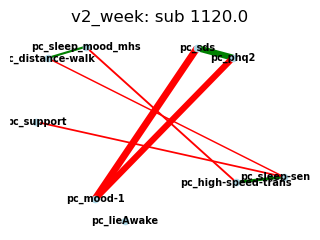

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


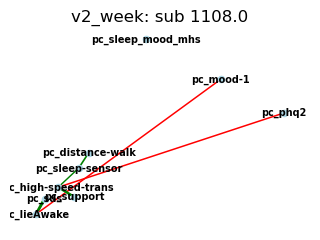

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


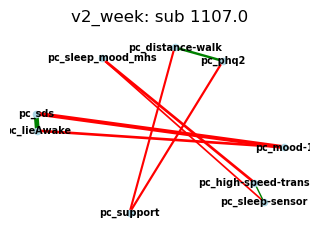

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


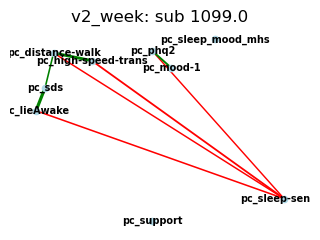

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


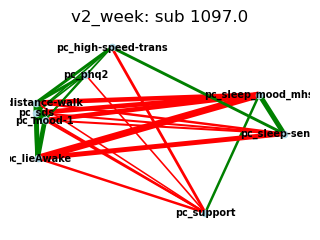

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


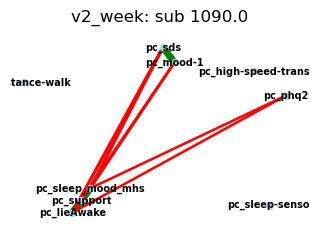

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


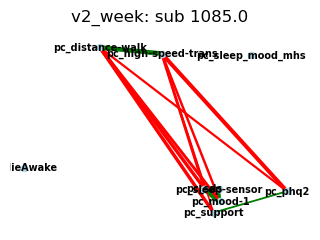

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


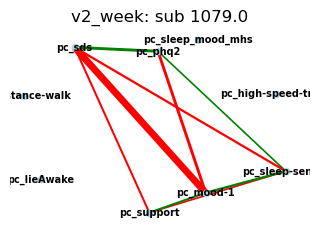

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


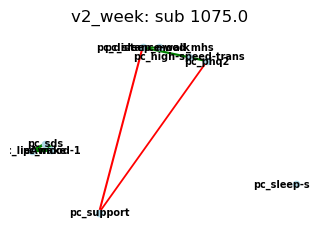

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


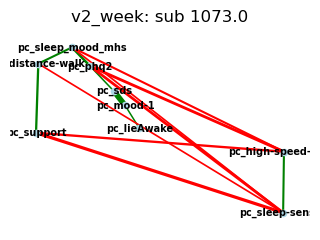

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


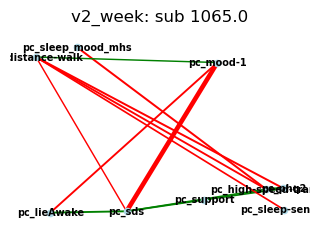

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


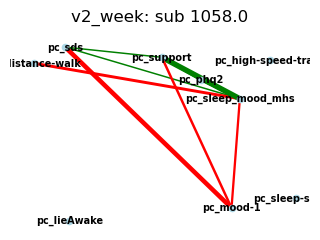

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


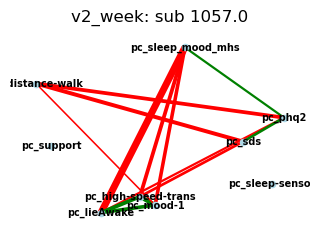

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


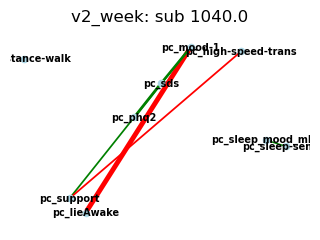

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


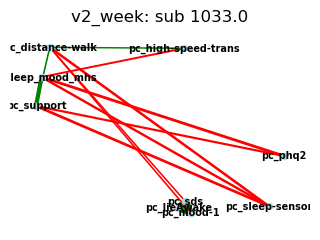

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


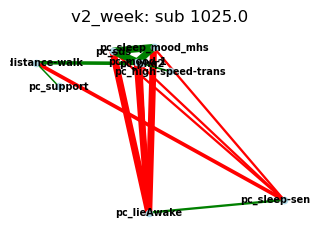

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


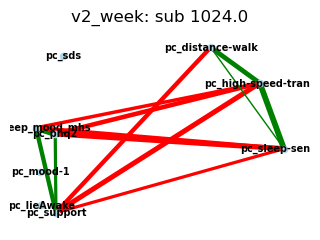

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


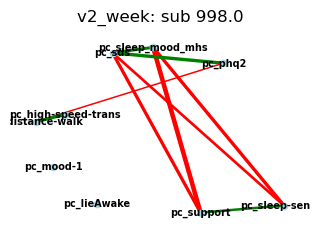

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


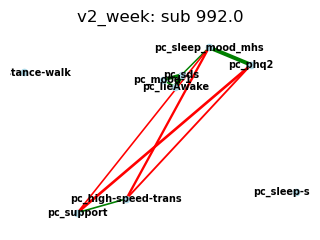

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


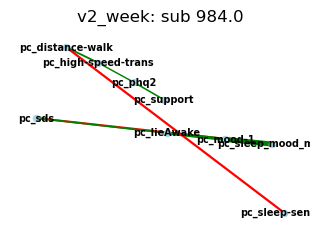

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


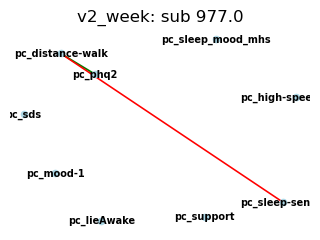

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


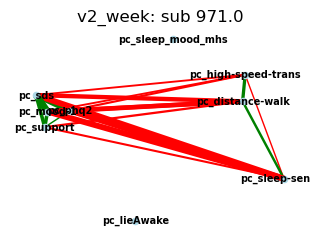

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


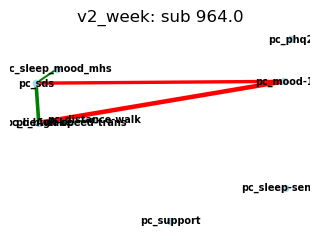

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


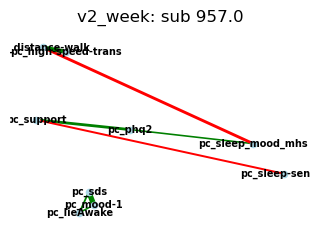

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


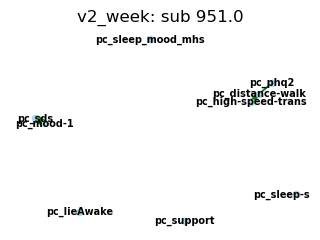

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


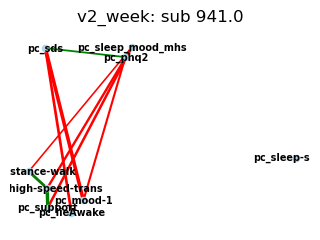

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


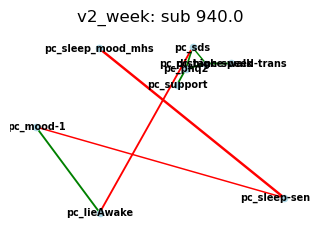

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


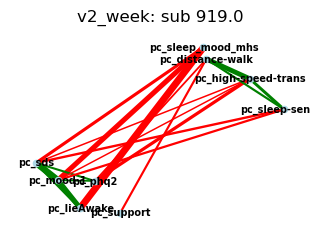

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


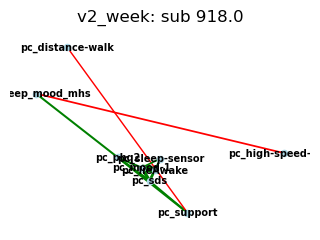

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


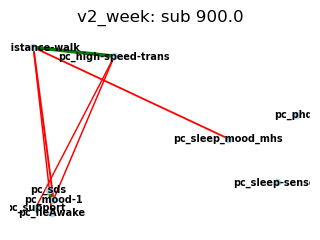

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


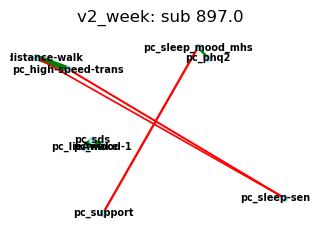

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


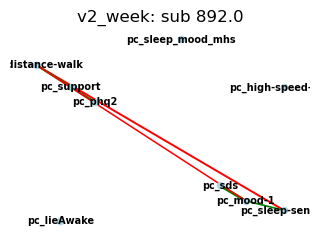

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


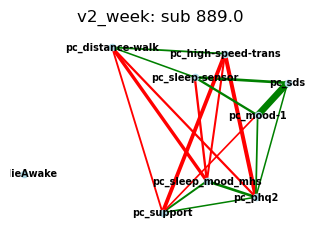

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


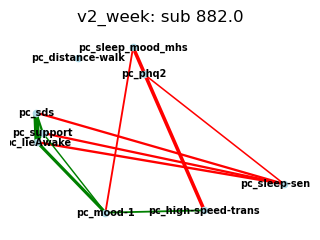

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


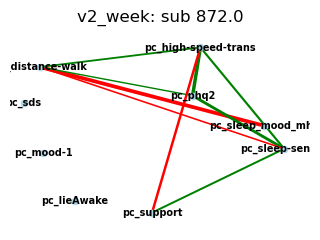

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


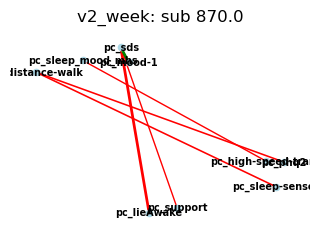

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


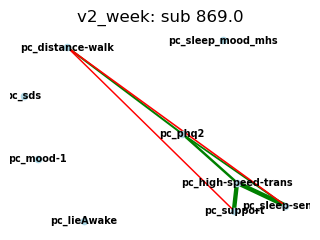

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


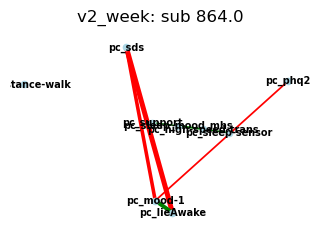

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


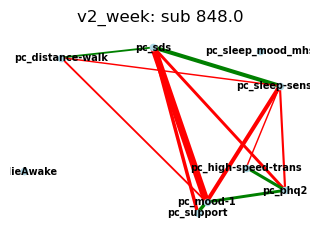

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


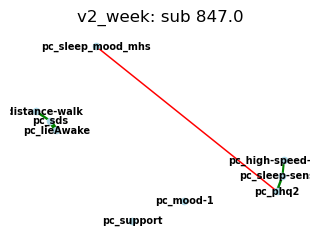

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


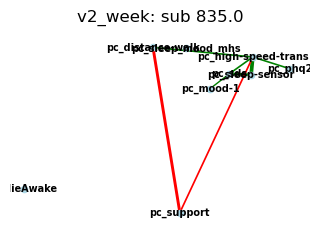

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


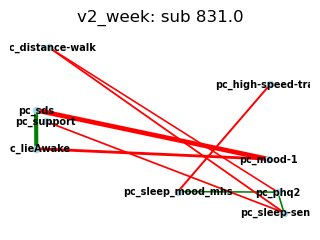

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


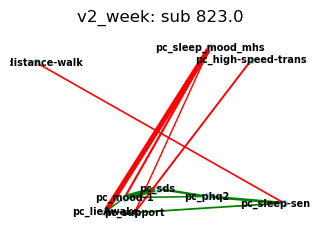

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


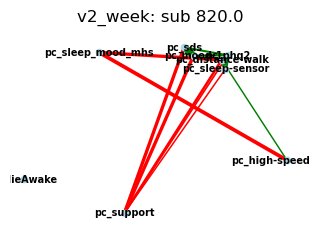

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


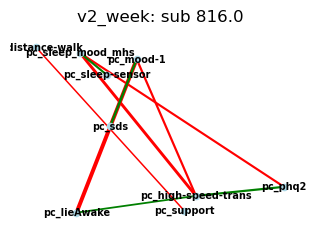

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


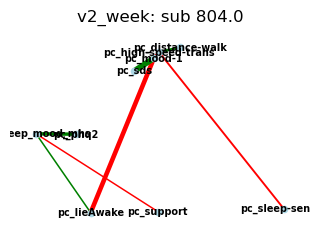

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


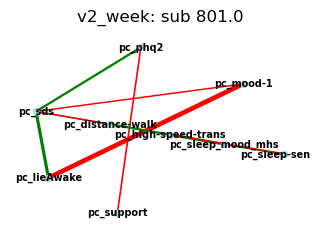

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


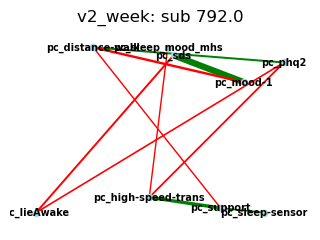

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


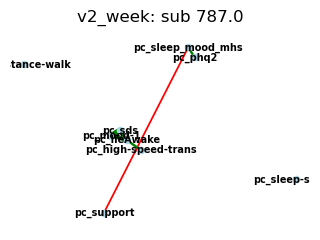

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


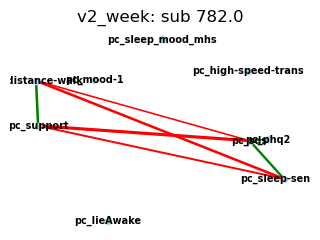

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


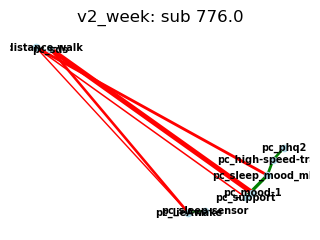

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


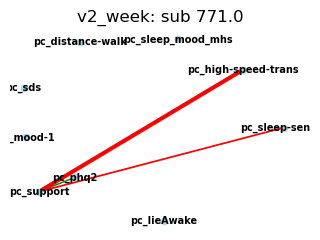

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


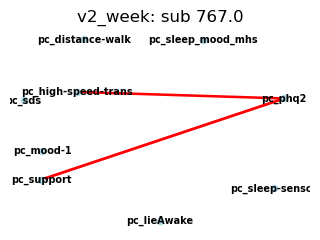

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


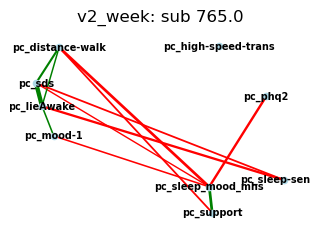

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


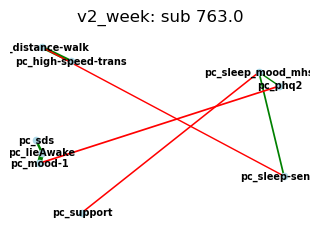

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


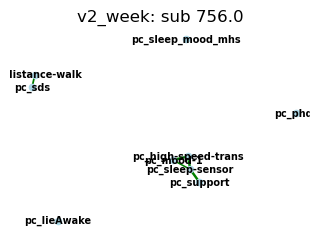

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


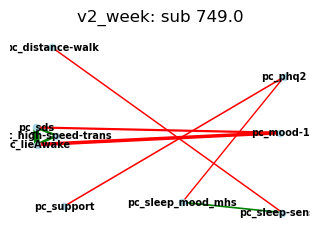

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


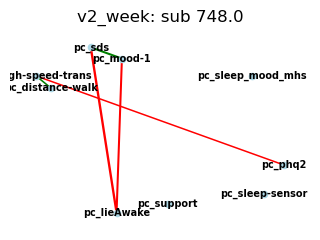

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


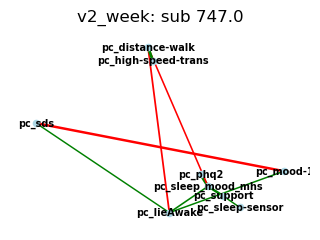

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


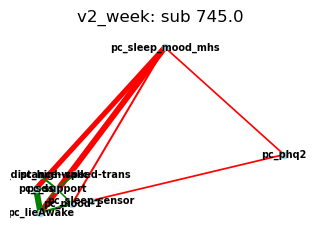

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


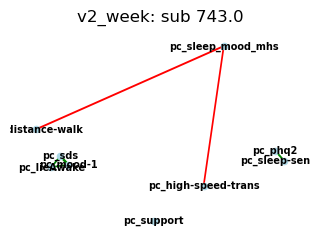

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


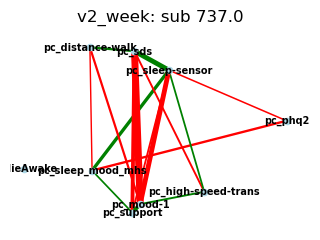

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


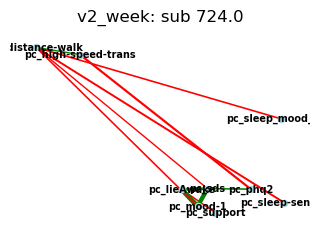

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


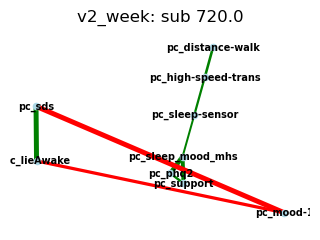

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


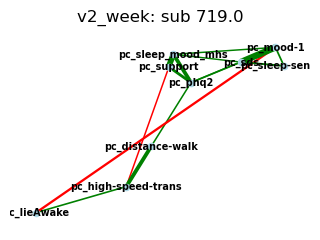

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


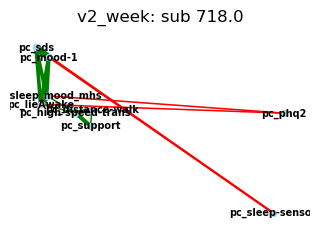

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


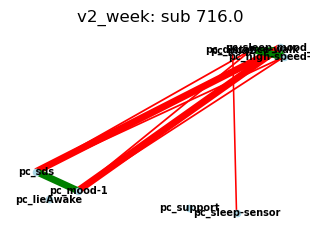

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


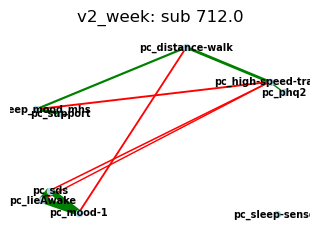

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


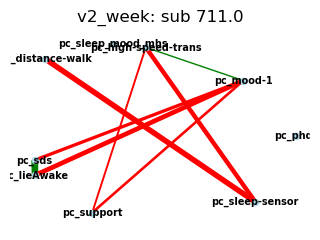

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


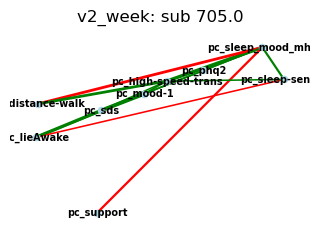

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


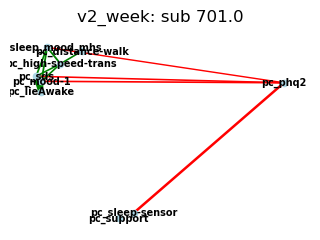

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


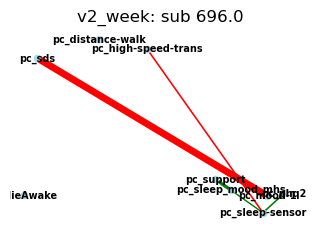

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


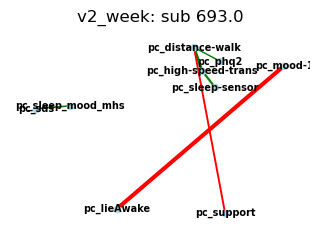

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


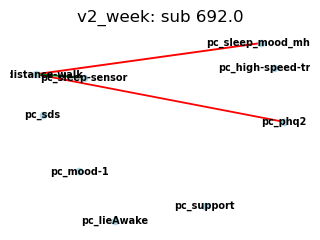

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


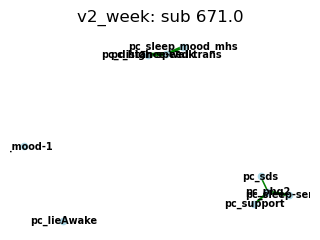

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


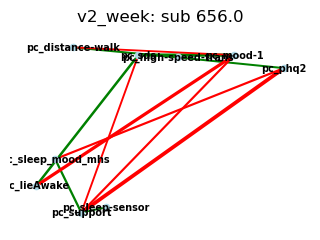

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


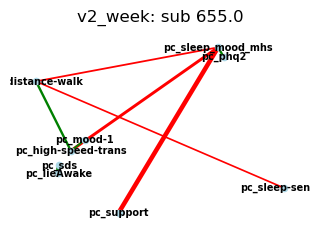

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


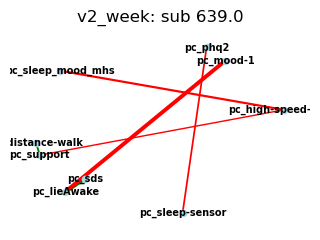

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


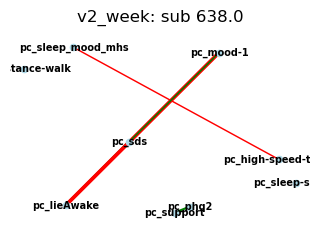

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


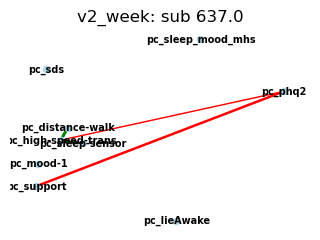

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


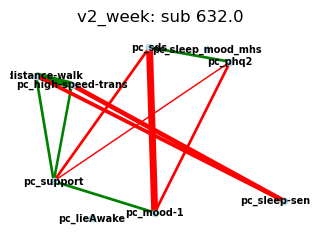

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


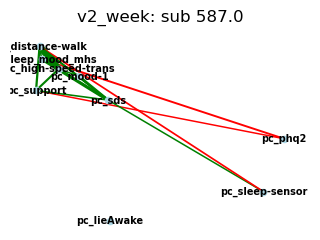

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


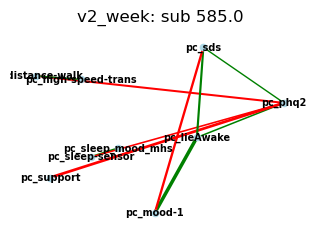

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


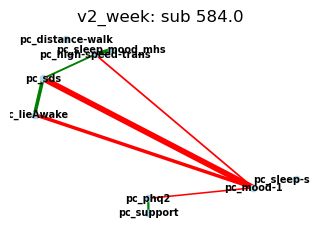

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


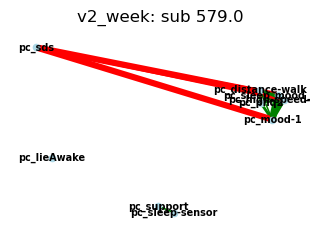

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


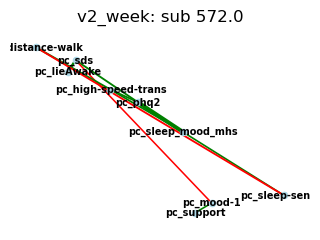

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


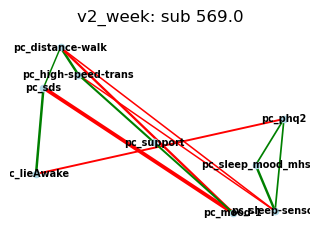

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


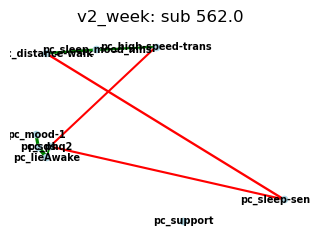

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


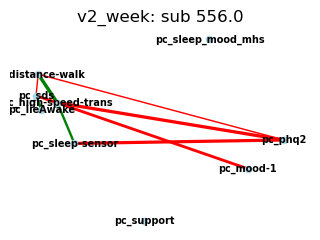

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


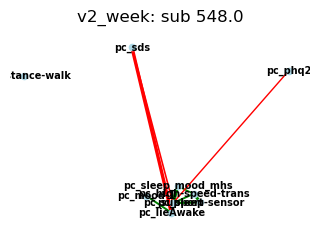

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


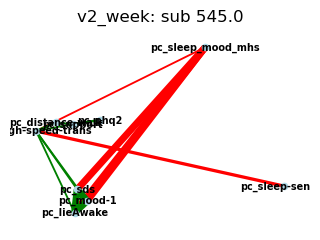

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


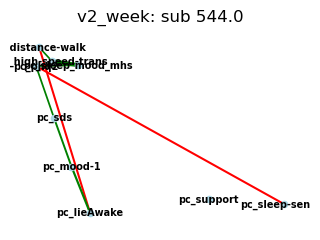

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


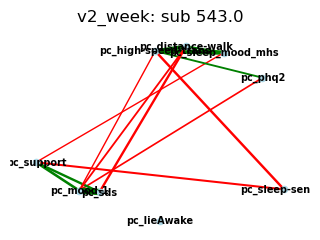

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


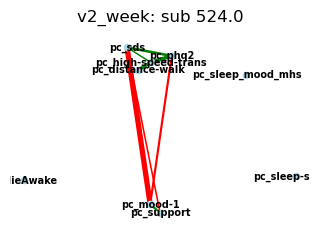

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


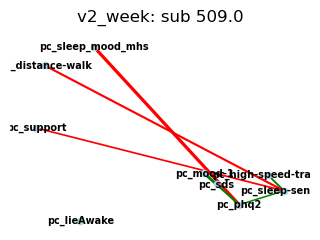

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


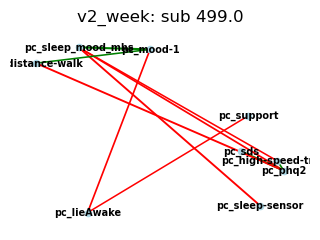

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


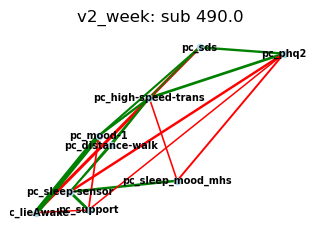

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


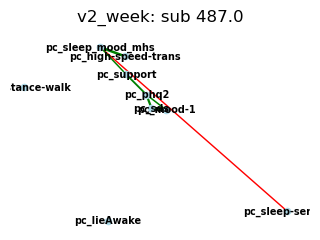

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


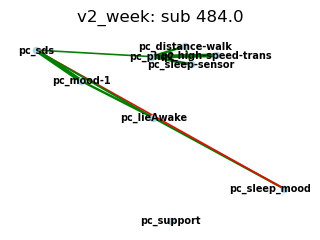

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


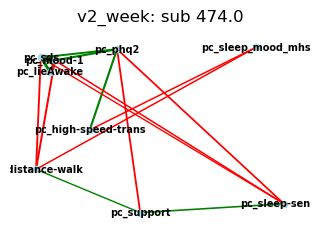

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


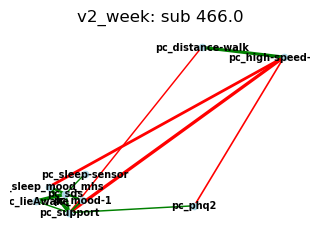

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


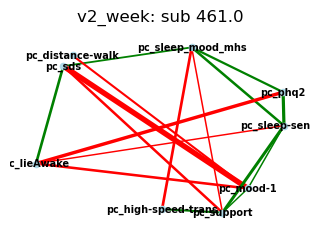

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


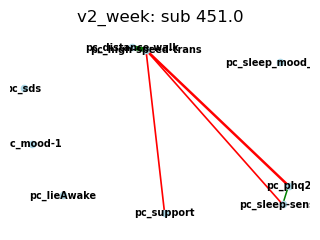

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


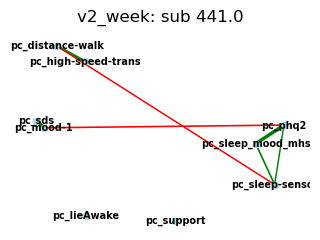

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


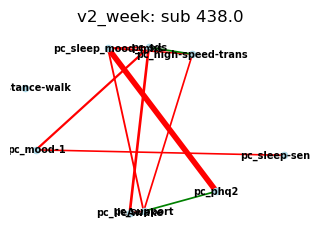

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


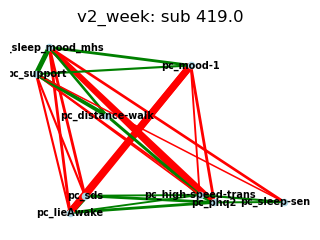

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


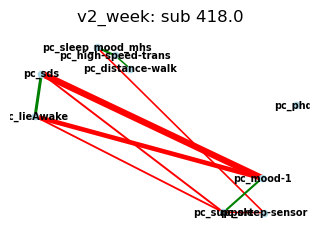

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


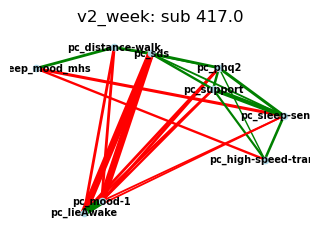

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


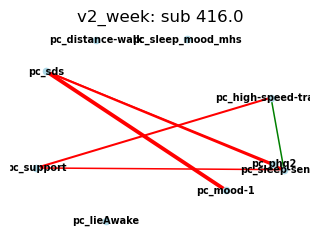

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


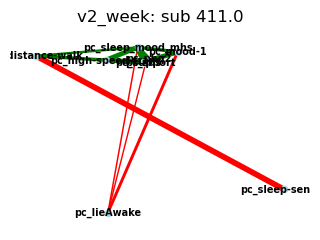

/Users/demo/Library/CloudStorage/Box-Box/Holmes_lab_kaley/motif_proj/smartphone modelling etc notebooks copy/scripts/feature_selection.py:374: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


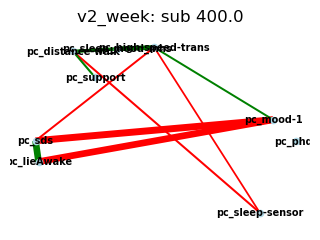

In [ ]:
############ Plot subjects' individual networks of PCs ############

# # Predefine fixed positions for nodes
# fixed_positions_v1_day = {
#     'pc_sleep-init-wake_mhs': (1, 3),
#     'pc_calls': (1, 2),
#     'pc_texts_communication': (2, 2),
#     'pc_sds_stress': (1, 4),
#     'pc_support': (2, 4),
#     'pc_mood': (1, 5),
#     'pc_mobility_radius': (3, 1),
#     'pc_mobility': (3, 2),
#     'pc_sleep-duration': (2, 3)
# }
# fixed_positions_v2_day = {
#     'pc_sleep-support_mhs': (1, 3),
#     'pc_sds_stress': (1, 4),
#     'pc_mood': (1, 5),
#     'pc_env_temp-humidity_var': (2, 2),
#     'pc_env_humidity_avg': (3, 2),
#     'pc_env_temp_avg': (3, 3),
#     'pc_dewpoint_var': (2, 3),
#     'pc_dewpoint_avg': (2, 4),
#     'pc_precip': (3, 4)
# }

# fixed_positions_v1_week = {
#     'pc_sleep-init-wake_mhs': (1, 3),
#     'pc_calls': (1, 2),
#     'pc_texts_communication': (2, 2),
#     'pc_sds_stress': (1, 4),
#     'pc_support': (2, 4),
#     'pc_mood': (1, 5),
#     'pc_mobility_radius': (3, 1),
#     'pc_mobility': (3, 2),
#     'pc_sleep-duration': (2, 3)
# }

# fixed_positions_v2_week = {
#     'pc_sleep-support_mhs': (1, 3),
#     'pc_sds_stress': (1, 4),
#     'pc_mood': (1, 5),
#     'pc_env_temp-humidity_var': (2, 2),
#     'pc_env_humidity_avg': (3, 2),
#     'pc_env_temp_avg': (3, 3),
#     'pc_dewpoint_var': (2, 3),
#     'pc_dewpoint_avg': (2, 4),
#     'pc_precip': (3, 4)
# }

for name, df in dfs_pca.items():
	count, count2, count3, count4 = 0, 0, 0, 0
	
	cols=[col for col in df.columns.to_list() if 'pc_' in col]
	for sub in df['num_id'].unique():
		sub_df = df[df['num_id']==sub]
		if sub_df.shape[0] > 8:
			corr_matrix = sub_df[cols].corr()
			if count<3:
				if 'v1_day' in name:
					fs.plot_network(corr_matrix, title=f'{name}: sub {sub}', threshold=0.2)
					count+=1
			if count2<3:
				if 'v1_week' in name:
					fs.plot_network(corr_matrix, title=f'{name}: sub {sub}', threshold=0.2)
					count2+=1
			if count3<3:
				if 'v2_day' in name:
					fs.plot_network(corr_matrix, title=f'{name}: sub {sub}', threshold=0.2)
					count2+=1
			if count4<3:
				if 'v2_week' in name:
					fs.plot_network(corr_matrix, title=f'{name}: sub {sub}', threshold=0.2)
					count2+=1


In [ ]:
for name in df_names: 
	df = pd.read_csv(os.path.join(brighten_dir, f'{name}_X_8wks_pca.csv'))
	display(df.head(10))

,Unnamed: 0,day,num_id,change_cat,week,phq9_cat_mean,change_sum,change_binary,phq9_mean,non-skew__aggregate_communication,...,ord__mhs_5,pc_sleep_mood_mhs,pc_calls,pc_lieAwake,pc_texts,pc_phq2,pc_sds_stress,pc_missed-interafctions,pc_mobility-radius,pc_mobility
0,0,0,2074.0,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,...,0.0,0.039459,-0.941067,-0.162058,-3.786377,-0.096482,-0.628069,0.030012,-0.037235,0.545038
1,1,2,2074.0,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,...,0.0,0.039459,-0.730319,-0.166093,-1.336918,-4.061710,-0.159145,1.205086,2.962765,0.469287
2,2,3,2074.0,NaN,NaN,NaN,NaN,NaN,NaN,-0.029234,...,1.0,0.039459,-0.705849,1.017370,-3.786377,-0.096482,-0.628069,0.030012,-0.037235,0.405674
3,3,4,2074.0,NaN,NaN,NaN,NaN,NaN,NaN,0.412574,...,0.0,0.039459,-0.524515,0.208100,1.112540,-0.096482,-0.628069,0.030012,-0.037235,0.392413
4,4,5,2074.0,NaN,NaN,NaN,NaN,NaN,NaN,-0.300020,...,0.0,3.039423,-0.035073,-0.024577,1.112540,-0.096482,-0.028060,0.030012,-0.037235,0.557243
5,5,6,2074.0,NaN,NaN,NaN,NaN,NaN,NaN,-0.243012,...,0.0,3.057925,-0.035073,-0.024577,1.112540,9.160923,-0.028060,0.030012,5.962765,0.557243
6,6,7,2074.0,NaN,NaN,NaN,NaN,NaN,NaN,-0.271516,...,0.0,3.039423,-0.823713,3.735635,3.561999,-0.096482,-0.628069,0.030012,-0.037235,-1.702061
7,7,8,2074.0,NaN,NaN,NaN,NaN,NaN,NaN,-0.414035,...,0.0,3.039423,-0.164449,0.315609,-1.336918,-0.096482,-0.159145,0.030012,-0.037235,0.557243
8,8,9,2074.0,NaN,NaN,NaN,NaN,NaN,NaN,0.441078,...,0.0,3.039423,-0.117342,-0.771039,1.112540,-0.096482,-0.628069,0.030012,-0.037235,0.100798
9,9,10,2074.0,NaN,NaN,NaN,NaN,NaN,NaN,0.213048,...,0.0,3.039423,-0.542766,-0.755956,1.112540,-0.096482,-0.628069,0.030012,-0.037235,-1.972861


,Unnamed: 0,day,num_id,change_cat,week,phq9_cat_mean,change_sum,change_binary,phq9_mean,non-skew__cloud_cover_mean,...,ord__mhs_5,pc_sleep_mood_mhs,pc_phq2,pc_lieAwake,pc_sds,pc_high-speed-trans,pc_distance-walk,pc_sleep-sensor,pc_support,pc_mood-1
0,0,0,1178.0,0.0,10.0,3.0,-4.0,0.0,17.0,1.635503e-16,...,0.0,-0.292762,-1.782810,0.001009,0.063757,1.922946,0.346313,0.189285,0.064700,-0.111775
1,1,39,1178.0,0.0,10.0,3.0,-4.0,0.0,17.0,-1.314347e+00,...,0.0,-0.292762,-1.782810,0.001009,0.063757,1.922946,0.346313,0.189285,-2.509383,-0.111775
2,2,40,1178.0,0.0,10.0,3.0,-4.0,0.0,17.0,1.425675e+00,...,0.0,-0.292762,-1.782810,0.001009,0.063757,-0.958345,1.043833,-1.684866,-0.381929,-0.111775
3,3,41,1178.0,0.0,10.0,3.0,-4.0,0.0,17.0,3.355587e-01,...,0.0,-0.292762,-0.530611,0.001009,7.682817,-0.958345,-0.622520,0.783899,-1.231575,0.888225
4,4,42,1178.0,0.0,10.0,3.0,-4.0,0.0,17.0,-1.049184e+00,...,0.0,-0.292762,-1.782810,0.001009,0.063757,1.922946,0.346313,0.189285,-3.483973,-0.111775
5,5,43,1178.0,0.0,10.0,3.0,-4.0,0.0,17.0,-1.255422e+00,...,0.0,-0.292762,0.666473,0.001009,0.063757,1.922946,0.346313,0.189285,-3.229079,-0.111775
6,6,44,1178.0,0.0,10.0,3.0,-4.0,0.0,17.0,-1.078647e+00,...,0.0,-0.292762,-1.782810,0.001009,0.063757,1.922946,0.346313,0.189285,-3.738867,-0.111775
7,7,45,1178.0,0.0,10.0,3.0,-4.0,0.0,17.0,-1.078647e+00,...,0.0,-0.292762,-1.782810,0.001009,0.063757,-0.958345,0.200254,-2.154218,-4.331950,-0.111775
8,8,46,1178.0,0.0,10.0,3.0,-4.0,0.0,17.0,-1.343810e+00,...,0.0,-0.292762,-2.998266,0.001009,0.063757,-0.958345,-1.748116,-1.337428,-2.845904,-0.111775
9,9,47,1178.0,0.0,10.0,3.0,-4.0,0.0,17.0,-7.545578e-01,...,0.0,-0.292762,-1.782810,0.001009,0.063757,-0.958345,-0.236467,-1.014578,-3.610585,-0.111775


,Unnamed: 0,day,num_id,change_cat,week,phq9_cat_mean,change_sum,change_binary,phq9_mean,non-skew__aggregate_communication,...,ord__mhs_5,pc_sleep_mood_mhs,pc_calls,pc_lieAwake,pc_texts,pc_phq2,pc_sds_stress,pc_missed-interafctions,pc_mobility-radius,pc_mobility
0,0,0.0,2074.0,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,...,0.0,0.039459,-0.941067,-0.162058,-3.756941,-0.096482,-0.628069,0.030012,-0.037235,0.545038
1,1,10.0,2074.0,NaN,NaN,NaN,NaN,NaN,NaN,0.213048,...,0.0,3.039423,-0.823713,3.735635,3.591431,-0.096482,-0.628069,0.030012,-0.037235,-1.702061
2,2,11.0,2074.0,NaN,NaN,NaN,NaN,NaN,NaN,1.980281,...,0.0,3.039423,-0.323097,2.517413,1.141974,-0.096482,-0.628069,0.030012,-0.037235,-1.972001
3,3,12.0,2074.0,NaN,NaN,NaN,NaN,NaN,NaN,0.911390,...,0.0,3.039423,-0.301175,-0.200705,6.040889,-0.096482,-0.628069,0.030012,-0.037235,-0.964516
4,4,13.0,2074.0,NaN,NaN,NaN,NaN,NaN,NaN,-0.542302,...,0.0,3.039423,0.106812,0.231403,6.040889,11.241868,-0.159145,1.205086,3.962765,-1.562928
5,5,14.0,2074.0,NaN,NaN,NaN,NaN,NaN,NaN,-0.613561,...,0.0,3.039423,-0.542766,-0.755956,1.141974,-0.096482,-0.628069,0.030012,-0.037235,-1.972861
6,6,15.0,2074.0,NaN,NaN,NaN,NaN,NaN,NaN,0.469582,...,0.0,3.039423,0.007963,-0.091217,3.591431,-0.096482,-0.628069,0.030012,-0.037235,-0.895113
7,7,16.0,2074.0,NaN,NaN,NaN,NaN,NaN,NaN,-0.556554,...,0.0,3.039423,-0.321159,0.243574,-1.307483,-0.096482,-0.628069,0.030012,-0.037235,-1.550854
8,8,17.0,2074.0,NaN,NaN,NaN,NaN,NaN,NaN,-0.585058,...,0.0,3.039423,-0.698967,1.490164,-1.307483,-0.096482,-0.159145,0.030012,-0.037235,-1.969426
9,9,18.0,2074.0,NaN,NaN,NaN,NaN,NaN,NaN,-0.399783,...,0.0,3.039423,-0.204824,0.149230,-1.307483,-0.096482,-0.159145,0.030012,-0.037235,0.557243


,Unnamed: 0,day,num_id,change_cat,week,phq9_cat_mean,change_sum,change_binary,phq9_mean,non-skew__cloud_cover_mean,...,ord__mhs_5,pc_sleep_mood_mhs,pc_phq2,pc_lieAwake,pc_sds,pc_high-speed-trans,pc_distance-walk,pc_sleep-sensor,pc_support,pc_mood-1
0,0,0.0,1178.0,0.0,10.0,3.0,-4.0,0.0,17.0,1.635503e-16,...,0.0,-0.292762,-1.736000,0.001009,0.063757,1.922946,0.346313,0.189285,0.064700,-0.111775
1,1,39.0,1178.0,0.0,10.0,3.0,-4.0,0.0,17.0,-1.314347e+00,...,0.0,-0.292762,-1.736000,0.001009,0.063757,1.922946,0.346313,0.189285,-2.509383,-0.111775
2,2,40.0,1178.0,0.0,10.0,3.0,-4.0,0.0,17.0,1.425675e+00,...,0.0,-0.292762,-1.736000,0.001009,0.063757,-0.958345,1.043833,-1.684866,-0.381929,-0.111775
3,3,41.0,1178.0,0.0,10.0,3.0,-4.0,0.0,17.0,3.355587e-01,...,0.0,-0.292762,-0.480485,0.001009,7.682817,-0.958345,-0.622520,0.783899,-1.231575,0.888225
4,4,42.0,1178.0,0.0,10.0,3.0,-4.0,0.0,17.0,-1.049184e+00,...,0.0,-0.292762,-1.736000,0.001009,0.063757,1.922946,0.346313,0.189285,-3.483973,-0.111775
5,5,43.0,1178.0,0.0,10.0,3.0,-4.0,0.0,17.0,-1.255422e+00,...,0.0,-0.292762,0.713229,0.001009,0.063757,1.922946,0.346313,0.189285,-3.229079,-0.111775
6,6,44.0,1178.0,0.0,10.0,3.0,-4.0,0.0,17.0,-1.078647e+00,...,0.0,-0.292762,-1.736000,0.001009,0.063757,1.922946,0.346313,0.189285,-3.738867,-0.111775
7,7,45.0,1178.0,0.0,10.0,3.0,-4.0,0.0,17.0,-1.078647e+00,...,0.0,-0.292762,-1.736000,0.001009,0.063757,-0.958345,0.200254,-2.154218,-4.331950,-0.111775
8,8,46.0,1178.0,0.0,10.0,3.0,-4.0,0.0,17.0,-1.343810e+00,...,0.0,-0.292762,-2.950315,0.001009,0.063757,-0.958345,-1.748116,-1.337428,-2.845904,-0.111775
9,9,47.0,1178.0,0.0,10.0,3.0,-4.0,0.0,17.0,-7.545578e-01,...,0.0,-0.292762,-1.736000,0.001009,0.063757,-0.958345,-0.236467,-1.014578,-3.610585,-0.111775


In [ ]:
y_cols = ['change_cat','change_sum','change_binary','phq9_mean','phq9_cat_mean']

for name in df_names: 
	
	df_base=pd.read_csv(os.path.join(brighten_dir,  f'{name}_Xy_long_trainval.csv'))

	baseline_cols_present = [col for col in df_base.columns if any(item in col for item in y_cols+['dt','num_id'])]

	print(name, 'y cols present:', baseline_cols_present)

	




v1_day y cols present: ['dt', 'num_id', 'change_cat', 'phq9_cat_mean', 'change_sum', 'change_binary', 'phq9_mean']
v2_day y cols present: ['dt', 'num_id', 'change_cat', 'phq9_cat_mean', 'change_sum', 'change_binary', 'phq9_mean']
v1_week y cols present: ['dt', 'num_id', 'change_cat', 'phq9_cat_mean', 'change_sum', 'change_binary', 'phq9_mean']
v2_week y cols present: ['dt', 'num_id', 'change_cat', 'phq9_cat_mean', 'change_sum', 'change_binary', 'phq9_mean']


In [ ]:
for name in df_names: 
	df = pd.read_csv(os.path.join(brighten_dir, f'{name}_X_8wks_pca.csv'))
	print(df.columns.to_list())

['Unnamed: 0', 'day', 'num_id', 'change_cat', 'week', 'phq9_cat_mean', 'change_sum', 'change_binary', 'phq9_mean', 'non-skew__aggregate_communication', 'non-skew__call_count', 'non-skew__call_duration', 'non-skew__interaction_diversity', 'non-skew__missed_interactions', 'non-skew__sms_count', 'non-skew__sms_length', 'bc__mobility', 'bc__mobility_radius', 'yj__sds_1', 'ord__sds_2', 'yj__sds_3', 'ord__stress', 'ord__support', 'ord__sleep_1', 'ord__sleep_2', 'ord__sleep_3', 'yj__mood_1', 'ord__mhs_1', 'ord__mhs_2', 'ord__mhs_3', 'ord__mhs_4', 'ord__mhs_5', 'pc_sleep_mood_mhs', 'pc_calls', 'pc_lieAwake', 'pc_texts', 'pc_phq2', 'pc_sds_stress', 'pc_missed-interafctions', 'pc_mobility-radius', 'pc_mobility']
['Unnamed: 0', 'day', 'num_id', 'change_cat', 'week', 'phq9_cat_mean', 'change_sum', 'change_binary', 'phq9_mean', 'non-skew__cloud_cover_mean', 'non-skew__dew_point_mean', 'non-skew__humidity_mean', 'non-skew__temp_mean', 'yj__dew_point_IQR', 'non-skew__humidity_IQR', 'non-skew__temp_IQ

In [ ]:
### Sensor PCA -> mood

from sklearn.model_selection import train_test_split

y_cols =['phq2'] 
models = {
	'HistGradientBoostingRegressor': [HistGradientBoostingRegressor()]
}

model_dict_slopeint={}
for name in df_names: 
	model_dict_slopeint[name] = {}
	df = pd.read_csv(os.path.join(brighten_dir, f'{name}_X_8wks_pca.csv'))
	#df_base=pd.read_csv(os.path.join(brighten_dir,  f'{name}_Xy_imputed_long_trainval.csv'))

	# baseline_cols_present = [col for col in df_base.columns if any(item in col for item in baseline_cols+['dt','num_id']+y_cols)]
	# df_base = df_base[baseline_cols_present]
	# df_merged = pd.merge(df, df_base, on=['num_id','day'])

	for y_col in ['pc_phq2']:
		model_dict_slopeint[name][y_col]={}
		for length_type in ['8wks']:
			for model_name in models:
				model_dict_slopeint[name][y_col][length_type]={}
				results_df = []
				# Xy_df = pd.merge(df_merged, y_df[['num_id', y_col]], on='num_id', how='outer')
				# Xy_df=Xy_df.dropna(subset=y_col)
				
				# print(f'X has {X.shape[0]} observations, {X.shape[1]} features.')
				#display(X)
				# non_numeric_cols = X.select_dtypes(include=['object']).columns
				# if len(non_numeric_cols) > 0:
				# 	print("Non-numeric columns found:", non_numeric_cols)
				# 	print(X[non_numeric_cols].head())
				
				# Inputs
				# groups = Xy_df['num_id']
				# gkf = GroupKFold(n_splits=5)
				# X2 = X.drop(columns='num_id').copy()  # drop group id from features for group KFold
				#print(([col for col in X2.columns if X2.isna().sum()[col]<200]))

				for sub, sub_df in df.groupby('num_id'):
					if len(sub_df)>50:
						y = sub_df[y_col]
						X_df = sub_df[[col for col in sub_df.columns if 'pc_' in col and y_col not in col]]

						model_dict_slopeint[name][y_col][length_type][model_name] = {}
						model_dict_slopeint[name][y_col][length_type][model_name][sub] = {}
						model_dict_slopeint[name][y_col][length_type][model_name][sub]['model']=[]
						model_dict_slopeint[name][y_col][length_type][model_name][sub]['X_test']=[]
						model_dict_slopeint[name][y_col][length_type][model_name][sub]['y_pred']=[]
						model_dict_slopeint[name][y_col][length_type][model_name][sub]['y_test']=[]
						model_dict_slopeint[name][y_col][length_type][model_name][sub]['r2_scores']=[]
						model_dict_slopeint[name][y_col][length_type][model_name][sub]['mae']=[]
						model_dict_slopeint[name][y_col][length_type][model_name][sub]['corr']=[]



						X_train, X_test, y_train, y_test = train_test_split(X_df, y, test_size=0.3)

						model = models[model_name][0]
						# if y_col in ['change_cat','change_binary']:
						# 	model= models[model_name][1]
						model.fit(X_train, y_train)
						model_dict_slopeint[name][y_col][length_type][model_name][sub]['model'].append(model)

						y_pred = np.round(model.predict(X_test)).astype(int) #ordinal Y
						model_dict_slopeint[name][y_col][length_type][model_name][sub]['y_pred'] = y_pred
						model_dict_slopeint[name][y_col][length_type][model_name][sub]['y_test'] = y_test
						model_dict_slopeint[name][y_col][length_type][model_name][sub]['X_test'].append(X_test)

						r2 = r2_score(y_test, y_pred)
						model_dict_slopeint[name][y_col][length_type][model_name][sub]['r2_scores'].append(r2)
						
						mae = mean_absolute_error(y_test, y_pred)
						model_dict_slopeint[name][y_col][length_type][model_name][sub]['mae'].append(mae)

						y_range = round(y.min(), 1) - round(y.max(), 1)
						mae_average = round(np.mean(model_dict_slopeint[name][y_col][length_type][model_name][sub]['mae']), 4)
						mae_percentage = mae_average/y_range


						results_df.append([sub, round(np.mean(model_dict_slopeint[name][y_col][length_type][model_name][sub]['r2_scores']), 4), mae_average, mae_percentage])


						print(f"Sub {sub}: {y_col} type {length_type} -- mean R²: {round(np.mean(model_dict_slopeint[name][y_col][length_type][model_name][sub]['r2_scores']), 4)}, mean MAE: {round(np.mean(model_dict_slopeint[name][y_col][length_type][model_name][sub]['mae']), 4)} of {round(y.min(), 1)}-{round(y.max(), 1)}")

				results_df = pd.DataFrame(results_df, columns=['Subject', 'R2 Mean', 'MAE', 'MAE Percentage'])
				results_df.to_csv(os.path.join(brighten_dir, f'{name}_{length_type}_bySub_predicting-{y_col}_pca.csv'), index=False)
			


Sub 416.0: pc_phq2 type 8wks -- mean R²: -15.4412, mean MAE: 1.1561 of -4.2-0.7
Sub 418.0: pc_phq2 type 8wks -- mean R²: -0.1015, mean MAE: 1.7263 of -4.2-5.6
Sub 438.0: pc_phq2 type 8wks -- mean R²: -0.4496, mean MAE: 0.9854 of -4.2-1.9
Sub 441.0: pc_phq2 type 8wks -- mean R²: -0.1603, mean MAE: 1.9884 of -4.2-4.3
Sub 466.0: pc_phq2 type 8wks -- mean R²: -3.5699, mean MAE: 1.3736 of -3.0-5.6
Sub 474.0: pc_phq2 type 8wks -- mean R²: -0.2617, mean MAE: 1.4153 of -3.0-3.1
Sub 484.0: pc_phq2 type 8wks -- mean R²: 0.0275, mean MAE: 1.017 of -1.8-0.7
Sub 487.0: pc_phq2 type 8wks -- mean R²: -0.0025, mean MAE: 1.5852 of -4.2-3.1
Sub 499.0: pc_phq2 type 8wks -- mean R²: -0.1693, mean MAE: 3.0611 of -3.0-5.6
Sub 544.0: pc_phq2 type 8wks -- mean R²: 0.3609, mean MAE: 1.6224 of -4.2-5.6
Sub 548.0: pc_phq2 type 8wks -- mean R²: -0.7452, mean MAE: 1.4192 of -4.2-5.6
Sub 556.0: pc_phq2 type 8wks -- mean R²: 0.1657, mean MAE: 1.7075 of -4.2-5.6
Sub 562.0: pc_phq2 type 8wks -- mean R²: 0.2884, mean M

In [ ]:
import plotly.express as px
for name in df_names: 
	for y_col in ['pc_phq2']:
		for length_type in ['8wks']:
			for model_name in models:
				results_df = pd.read_csv(os.path.join(brighten_dir, f'{name}_{length_type}_bySub_predicting-{y_col}_pca.csv'))
				results_df = results_df.dropna()
				fig = px.bar(results_df, x='Subject', y='R2 Mean', title=f'R2 of {name} over {length_type} by Subject Predicting {y_col} with PCA inputs')
				fig.show()
				


In [ ]:
import plotly.express as px
for name in df_names: 
	for y_col in ['pc_phq2']:
		for length_type in ['8wks']:
			for model_name in models:
				results_df = pd.read_csv(os.path.join(brighten_dir, f'{name}_{length_type}_bySub_predicting-{y_col}_pca.csv'))
				results_df = results_df.dropna()
				fig = px.bar(results_df, x='Subject', y='MAE Percentage', title=f'MAE Percentage of {name} over {length_type} by Subject Predicting {y_col} with PCA inputs')
				fig.show()

In [ ]:

pc_symptom_matrices_df_dict = {}
pc_flattened_matrices_df_dict = {}
pc_sensor_matrices_df_dict = {}
pc_target_matrices_df_dict = {}
pc_flattened_sensor_df_dict = {}
pc_flattened_target_df_dict = {}	

correlated_weather_cols = ['non-skew__humidity_mean', 'non-skew__humidity_median', 'non-skew__cloud_cover_mean', 'non-skew__cloud_cover_median']

#### Take the average of each subject's symptom correlation and use it to make clusters of variables

# Create dicts of all subjects' correlation matrices
for name in df_names:
	print(f'\n\nDATAFRAME: {name}')

	df = pd.read_csv(os.path.join(brighten_dir, f'{name}_X_8wks_pca.csv'))
	df = df.loc[:, ~df.columns.str.contains('^Unnamed')]
	
	# Take out y columns
	y_cols = ['pc_phq2']
	df = df.drop(columns=[col for col in df.columns if any(item in col for item in y_cols)])

	# Make symptom/flattened dicts for all cols
	ignore_cols = [col for col in df.columns if "pc_" not in col]

	keep_columns = list(set(df.columns.to_list()) - set(ignore_cols))
	print(keep_columns)
	print(f"All cols for {name}:")
	symptom_matrix_dict, flattened_matrix_dict = fs.make_symptom_matrices(df, ignore_cols, num_to_plot=0)
	

	# Assign dicts to nested dict
	pc_symptom_matrices_df_dict[name] = symptom_matrix_dict
	pc_flattened_matrices_df_dict[name] = flattened_matrix_dict


	# Make separate symptom/flattened dicts for target cols vs. sensor cols
	target_cols = ['pc_phq2']
	print(f"Sensor cols for {name}:")
	sensor_cols = [col for col in df.columns if 'pc_' in col and col not in target_cols]
	print(sensor_cols)
	nonsensor_cols = [col for col in df.columns if col not in sensor_cols]
	sensor_matrices_dict, flattened_sensor_dict = fs.make_symptom_matrices(df, ignore_cols+nonsensor_cols, num_to_plot=0)
	target_df = df.copy().drop(columns=[col for col in df.columns if col not in target_cols and 'num_id' not in col])
	print(f"Target cols for {name}:")

	target_matrices_dict, flattened_target_dict = fs.make_symptom_matrices(target_df, ignore_cols, num_to_plot=0)

	#Assign sensor/target dicts to nested dict
	pc_sensor_matrices_df_dict[name] = sensor_matrices_dict
	pc_target_matrices_df_dict[name] = target_matrices_dict
	pc_flattened_sensor_df_dict[name] = flattened_sensor_dict
	pc_flattened_target_df_dict[name] = flattened_target_dict






DATAFRAME: v1_day
['pc_sds_stress', 'pc_support', 'pc_sleep_mood_mhs', 'pc_calls', 'pc_missed-interafctions', 'pc_mood1', 'pc_texts', 'pc_mobility']
All cols for v1_day:
In df there are 75 subjects.
75 subs with symptom matrices
75 filled condensed arrays
Sensor cols for v1_day:
['pc_sleep_mood_mhs', 'pc_calls', 'pc_texts', 'pc_sds_stress', 'pc_missed-interafctions', 'pc_mood1', 'pc_support', 'pc_mobility']
In df there are 75 subjects.
75 subs with symptom matrices
75 filled condensed arrays
Target cols for v1_day:
In df there are 75 subjects.
0 subs with symptom matrices
0 filled condensed arrays


DATAFRAME: v2_day
['pc_humidity', 'pc_support', 'pc_sleep_mood_mhs', 'pc_lieAwake', 'pc_sds', 'pc_sleepHours', 'pc_high-speed-trans', 'pc_distance-walk']
All cols for v2_day:
In df there are 117 subjects.
117 subs with symptom matrices
117 filled condensed arrays
Sensor cols for v2_day:
['pc_sleep_mood_mhs', 'pc_lieAwake', 'pc_sds', 'pc_high-speed-trans', 'pc_distance-walk', 'pc_sleepHour

In [ ]:
#num_id	change_sum	week	change_binary	phq9_mean	phq9_bin
#v1_phq9_sum_change.csv

# SENSOR AND SURVEY 
# Network based statistics for high phq9 vs. low phq9 -- OVER WHOLE STUDY
import bct 
from bct import nbs
from scipy import stats

significance_level = 0.05

for v in ['v1','v2']:
	print(v)
	phq9_stats = pd.read_csv(os.path.join(brighten_dir, f'{v}_phq9_sum_change.csv'))

	depressed = phq9_stats[phq9_stats['phq9_bin']==1]['num_id']
	print(f'There are {len(depressed)} subs in the depressed group')
	depressed_present = [sub for sub in depressed if sub in pc_symptom_matrices_df_dict[f'{v}_day']]
	print(f'There are {len(depressed_present)} subs present from the depressed group')
	X = {key: pc_symptom_matrices_df_dict[f'{v}_day'][key] for key in depressed_present}
	x_arr = np.stack([df.values for df in X.values()], axis=-1)
	print(f'x_arr shape {x_arr.shape}')
		
	nondepressed = phq9_stats[phq9_stats['phq9_bin']==0]['num_id']
	print(f'There are {len(depressed)} subs in the nondepressed group')
	nondepressed_present = [sub for sub in nondepressed if sub in pc_symptom_matrices_df_dict[f'{v}_day']]
	print(f'There are {len(nondepressed_present)} subs present from the nondepressed group')
	y = {key: pc_symptom_matrices_df_dict[f'{v}_day'][key] for key in nondepressed_present}
	y_arr = np.stack([df.values for df in y.values()], axis=-1)
	print(f'y_arr shape {y_arr.shape}')

	degf = len(X) + len(y) - 2
	print(f'The degrees of freedom are: {degf}')

	t_thresh = stats.t.ppf(1-significance_level, degf)
	print(f'The critical t value is {round(t_thresh, 2)}')

	pval, adj, null = nbs.nbs_bct(x_arr, y_arr, thresh=t_thresh, verbose=False)
	print(pval)
	# Convert adj to boolean mask
	mask = adj.astype(bool)
	component_cols = y[next(iter(y))].loc[:, mask]
	print(component_cols.columns.to_list())


v1
There are 111 subs in the depressed group
There are 17 subs present from the depressed group
x_arr shape (8, 8, 17)
There are 111 subs in the nondepressed group
There are 35 subs present from the nondepressed group
y_arr shape (8, 8, 35)
The degrees of freedom are: 50
The critical t value is 1.68
max component size is 4
estimating null distribution with 1000 permutations
permutation 0 of 1000.  p-value so far is 1.000
permutation 100 of 1000.  p-value so far is 0.238
permutation 200 of 1000.  p-value so far is 0.189
permutation 300 of 1000.  p-value so far is 0.203
permutation 400 of 1000.  p-value so far is 0.204
permutation 500 of 1000.  p-value so far is 0.204
permutation 600 of 1000.  p-value so far is 0.198
permutation 700 of 1000.  p-value so far is 0.195
permutation 800 of 1000.  p-value so far is 0.199
permutation 900 of 1000.  p-value so far is 0.195
permutation 999 of 1000.  p-value so far is 0.194
[0.194 0.939]
['pc_sds_stress', 'pc_sds_stress', 'pc_support', 'pc_support'

In [ ]:
# SHAP Printing -- do after above, can't run without first making results {}
import gc 

for name in ['v1_day', 'v2_day', 'v1_week', 'v2_week']: #4
	for y_col in ['phq9_mean']: #2
		for type in ['8wks']: #3
			for model_name in models: #only one atm 
				mean_r2 = round(np.mean(model_dict[name][y_col][type][model_name]['r2_scores']), 3)
				print(name, type, model_name, f'Mean R2: {mean_r2}')
				i=0 #change based on which CV you want to see
				explainer = shap.Explainer(model_dict[name][y_col][type][model_name]['model'][i], approximate=True)
				shap_values = explainer(model_dict[name][y_col][type][model_name]['X_test'][i], check_additivity=False)
				shap.plots.bar(shap_values)
				del explainer, shap_values
				gc.collect()  
				
				#shap.summary_plot(shap_values, model_dict[name][y_col][type][model_name]['X_test'][i], show=False)


In [ ]:
# import plotly.express as px


# for name in ['v1_week', 'v2_week']:
# 	for score in scoring_metrics:
# 		results_df = pd.read_csv(os.path.join(brighten_dir, f'phq9_full_results.csv'))
# 		# target_df = results_df[results_df['target']==target]
# 		# model_df = target_df[target_df['model']==model]
		
# 		scoring_df = results_df[results_df['scoring']==score]
# 		name_df = scoring_df[scoring_df['df_name']==name]
# 		model_df=name_df.loc[:, ~name_df.columns.str.contains('^Unnamed')]
# 		model_df = model_df.drop_duplicates()

		
# 		title = f'Average {score} scoring predicting phq9_cols, for {name}'
# 		fig = px.bar(model_df, x='target', y='cv_average', color='model', barmode='group', title=title)
# 		fig.show()
		

In [ ]:
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import pdist, squareform
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering

############# Plot Hierarchical Agglomerative Clustering ##################
def plot_hier_agg(flattened_matrices, matrix_labels=None, is_dict=False, group_title=None):
	# Compute pairwise distances
	if is_dict is True:
		distances = pdist(list(flattened_matrices.values()), metric='euclidean')
	else:
		distances = pdist(flattened_matrices)

	# Step 3: Create clustering with different solutions
	Z1 = linkage(distances, method='single', metric='euclidean')
	Z2 = linkage(distances, method='complete', metric='euclidean')
	Z3 = linkage(distances, method='average', metric='euclidean')
	Z4 = linkage(distances, method='ward', metric='euclidean')

	# Step 4: Plot the dendrograms
	plt.figure(figsize=(10, 8))
	if not (matrix_labels is None):
		labels = matrix_labels
	elif is_dict is True:
		labels = list(flattened_matrices.keys())
	else:
		labels=None

	print(group_title)
	if is_dict is True:
		print(len(flattened_matrices.keys()), 'matrices included')
	else:
		print(flattened_matrices.shape, 'variables included')
	plt.subplot(2,2,1), dendrogram(Z1, labels=labels, leaf_rotation=90, leaf_font_size=8), plt.title('Single')
	plt.subplot(2,2,2), dendrogram(Z2, labels=labels, leaf_rotation=90, leaf_font_size=8), plt.title('Complete')
	plt.subplot(2,2,3), dendrogram(Z3, labels=labels, leaf_rotation=90, leaf_font_size=8), plt.title('Average')
	plt.subplot(2,2,4), dendrogram(Z4, labels=labels, leaf_rotation=90, leaf_font_size=8), plt.title('Ward')
	plt.tight_layout()  # Prevent overlapping elements
	plt.show()


############# Create Hierarchical Agglomerative Clustering Labels ##################
def hier_agg_clustering(matrices, labels, n_clusters=2, linkage='ward', is_dict=False):
	hierarchical_cluster = AgglomerativeClustering(
		n_clusters=n_clusters,  # Number of clusters
		linkage=linkage  # Linkage method
	)

	if is_dict is True:
		cluster_labels = hierarchical_cluster.fit_predict(list(matrices.values()))
	else:
		cluster_labels = hierarchical_cluster.fit_predict(matrices)
	
	# # Map subject ids to labels
	subject_clusters = dict(zip(labels, cluster_labels))

	# Print cluster counts
	# cluster_counts = pd.Series(list(subject_clusters.values())).value_counts()
	# print(cluster_counts)

	return subject_clusters

In [ ]:
# Put all features into high/low
# profiles of features
# what percentage of each profile are depressed / not depressed, what are their things, etc